# ECON 430 Project Ⅰ

### Department of Economics
### Dr. Randall R. Rojas

### Team Members (With equal efforts):
#### Huitong Li 606353219
#### Jiaqi Tian 406353098
#### Chaoyang Wang 506547001
#### Jingxuan Gao 406548652

### Motivation:
In this project we focus on "Wine Quality" dataset from UCI Machine Learning Coolaborator.With careful analysis, we explore the realtionship between quality(limited integer levels) and other factors, and trying to make predictive model so we can determine wine's quality using its features.

## *0* Preparation with packages and data

### *0*.(a) Install necessary packages and import them

In [1]:
! pip install ydata-profiling

In [2]:
!pip install shap

In [3]:
!pip install ucimlrepo

In [4]:
from ucimlrepo import fetch_ucirepo
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from ydata_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import math

import os
# this just gets rid of annoying warnings
import warnings
warnings.filterwarnings('ignore')

# these allows you to manipulate Python objects in R and vice versa
from rpy2.robjects import pandas2ri
import rpy2.rinterface as rinterface
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr

import boruta
from boruta import BorutaPy
from boruta_shap import BorutaShap

from sklearn.linear_model import LinearRegression
from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

from numpy import random;
from scipy.stats import norm

# For R kernel
import rpy2.ipython
%load_ext rpy2.ipython
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri

import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.formula.api as smf
from statsmodels.graphics import regressionplots
from statsmodels.stats.multicomp import MultiComparison
from statsmodels.robust.robust_linear_model import RLM
from statsmodels.iolib.summary2 import summary_col
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import linear_reset

# sklearn functions work best with their own implementations of models
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score, KFold


/Users/a1/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


### *0*.(b) Import Data from ucimlrepo package for analysis

In [5]:
wine_quality=fetch_ucirepo(id=186)

In [6]:
wine_quality

{'data': {'ids': None,
  'features':       fixed_acidity  volatile_acidity  citric_acid  residual_sugar  chlorides  \
  0               7.4              0.70         0.00             1.9      0.076   
  1               7.8              0.88         0.00             2.6      0.098   
  2               7.8              0.76         0.04             2.3      0.092   
  3              11.2              0.28         0.56             1.9      0.075   
  4               7.4              0.70         0.00             1.9      0.076   
  ...             ...               ...          ...             ...        ...   
  6492            6.2              0.21         0.29             1.6      0.039   
  6493            6.6              0.32         0.36             8.0      0.047   
  6494            6.5              0.24         0.19             1.2      0.041   
  6495            5.5              0.29         0.30             1.1      0.022   
  6496            6.0              0.21         0.38

The data is in UCI's type, we need to transfer it into dataframe

In [7]:
print(type(wine_quality))

<class 'ucimlrepo.dotdict.dotdict'>


And here is the transfer:

In [8]:
df_wine_quality=wine_quality.data.original.copy()
df_wine_quality

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white


### Interpretation:

**Initial Predictors:** <br>
fixed acidity: most acids involved with wine or fixed or nonvolatile (do not evaporate readily).<br>
volatile acidity: the amount of acetic acid in wine, which at too high of levels can lead to an unpleasant, vinegar taste.<br>
citric acid: Afound in small quantities, citric acid can add 'freshness' and flavor to wines.<br>
residual sugar: the amount of sugar remaining after fermentation stops.<br>
chlorides: the amount of salt in the wine.<br>
free sulfur dioxide: the free form of SO2 exists in equilibrium between molecular SO2 (as a dissolved gas) and bisulfite ion.<br>
total sulfur dioxide: amount of free and bound forms of S02; in low concentrations, SO2 is mostly undetectable in wine, but at free SO2.<br>
density: the density of water is close to that of water depending on the percent alcohol and sugar content.<br>
pH: describes how acidic or basic a wine is on a scale from 0 (very acidic) to 14 (very basic).<br>
sulphates: a wine additive which can contribute to sulfur dioxide gas (S02) levels.<br>



**Response Variable**: <br>
quality: Wine quality (score between 0 and 10)

We may need data with just float numbers for some analysis, so we store it here using df_num

In [9]:
df_num=df_wine_quality.drop('color',axis=1,inplace=False)
df_num

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


### *1*.(a) The descriptive analysis of the variables in the dataset:

Now, we are sure the data set we will analyze is df_wine_quality, without dropping the categorical variable "color" 

In [10]:
df_wine_quality

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white


For our data set, we don't have any NAs, so the 1(f) will not be a problem for our data set

In [11]:
df_wine_quality.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
color                   0
dtype: int64

In [12]:
df_wine_quality.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


Because the skew and kurtosis cannot deal with string variable, we need our df_num for analysis here.

In [13]:
df_num_desc = df_num.describe()
df_num_desc.loc['skew'] = df_num.apply(lambda x: stats.skew(x))
df_num.loc['kurtosis'] = df_num.apply(lambda x: stats.kurtosis(x))
df_num_desc

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000
skew,1.722892,1.494751,0.471622,1.435073,5.398581,1.219784,-0.001177,0.503485,0.386749,1.796855,0.565587,0.189579


### *1*.(a).(1) Histogram

Comparing FD with Sturges methods, the FD method is better for complex and big data set. We have 6497 observations in our data set. So, we will choose FD method for this reason.

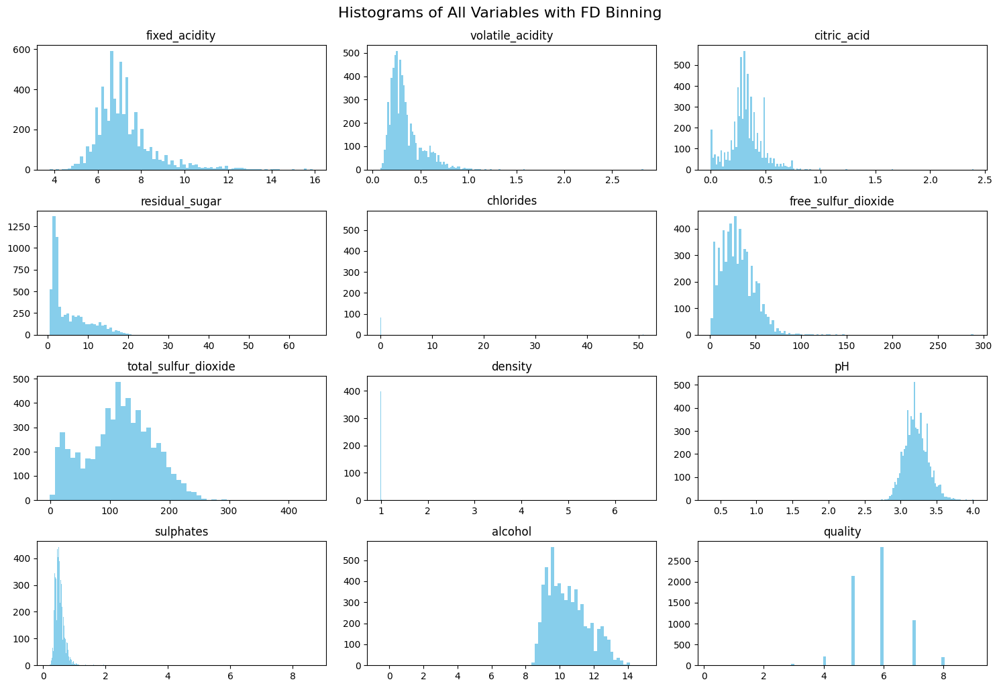

In [14]:
def bins_fd(series):
    # Calculate the numerator: (n^(1/3) * (max - min))
    numerator = (len(series) ** (1/3)) * (series.max() - series.min())
    # Calculate the denominator: 2 * IQR (Interquartile Range)
    denominator = 2 * (series.quantile(0.75) - series.quantile(0.25))
    # Return the number of bins as an integer, ensure it is at least 1
    return max(int(np.round(numerator / denominator)), 1)

# Plot histograms for each variable using the FD binning method
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 10))  # Adjust rows and columns based on the number of variables
axes = axes.flatten()

for i, col in enumerate(df_num.columns):
    num_bins = bins_fd(df_num[col])  # Calculate the number of bins using the FD rule for the column data
    axes[i].hist(df_num[col], bins=num_bins, color='skyblue')  # Use the column data for the histogram
    axes[i].set_title(col)

plt.tight_layout()
plt.suptitle('Histograms of All Variables with FD Binning', fontsize=16, y=1.02)
plt.show()

However, for some data like chlorides and density, it is really hard to tell where the data is. We will present the normal one so for reference.

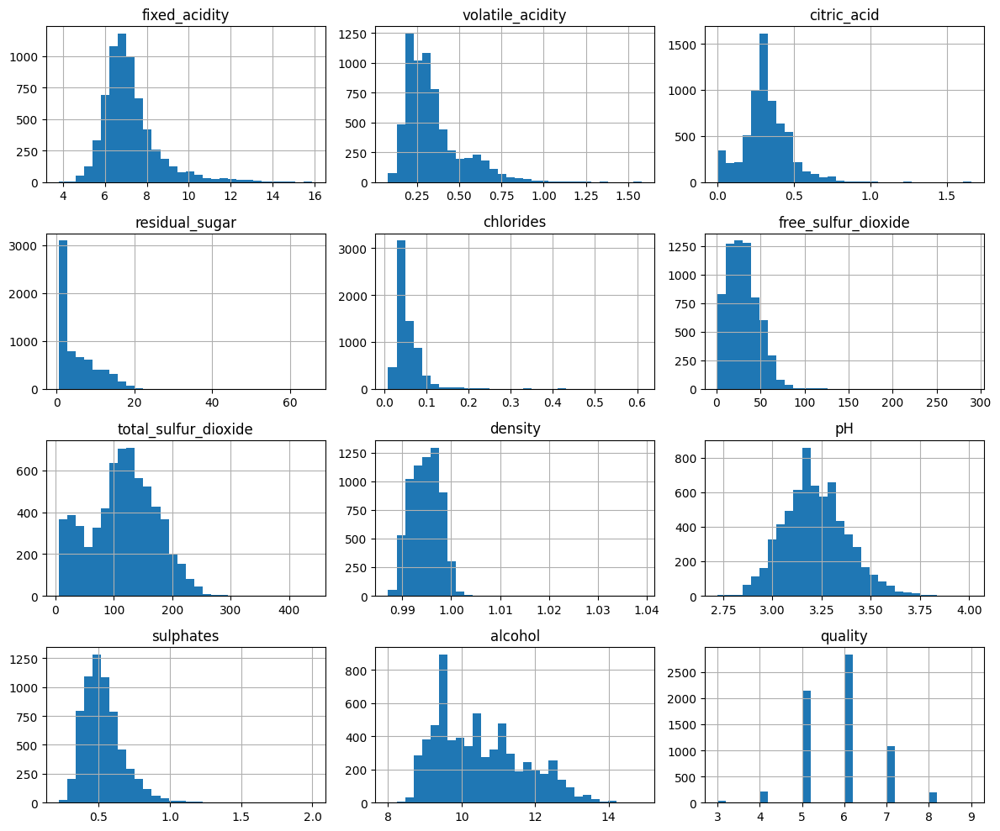

In [15]:
df_wine_quality.hist(bins=30, figsize=(12, 10))
plt.tight_layout()
plt.show()

### *1*.(a).(2) Quantile (Q-Q) Plots

Here we draw the QQ plot, we can see that every predictors is nearly (not fully) normally distributed. However, some of them have some qualities of skews. We will check them in later parts if we need some transformation of these data.

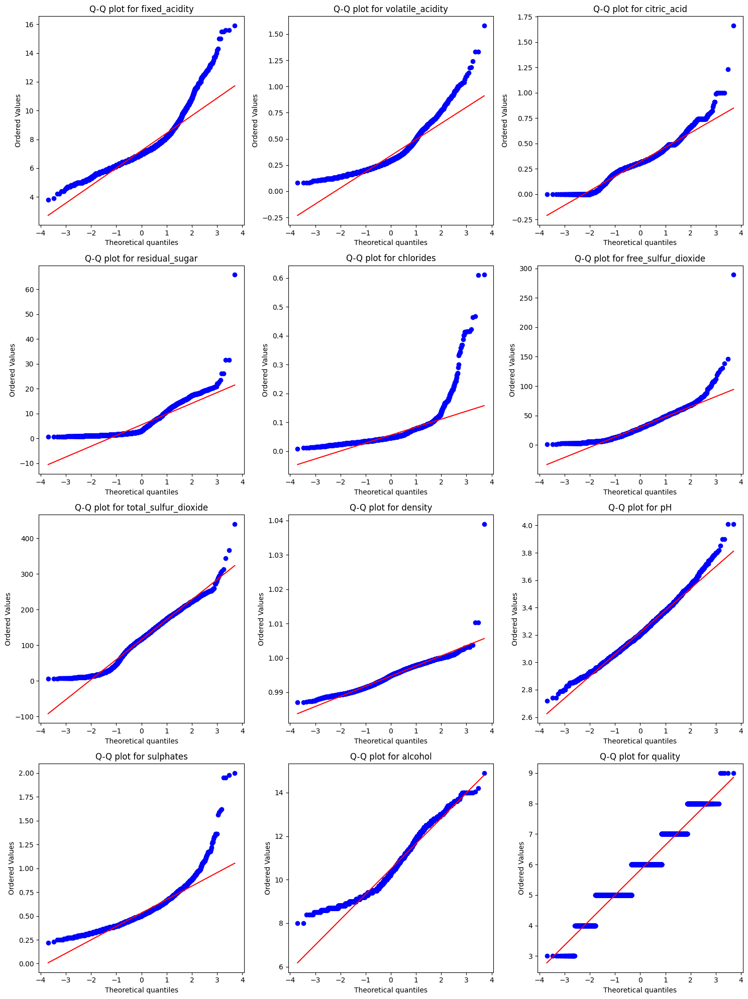

In [16]:
numeric_columns = df_wine_quality.select_dtypes(include='number').columns

# Set the colums and rows
n_cols = 3  
n_rows = int(np.ceil(len(numeric_columns) / n_cols)) 

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Show every Q-Q plot
for i, column in enumerate(numeric_columns):
    row = i // n_cols  
    col = i % n_cols 
    ax = axes[row, col]  
    stats.probplot(df_wine_quality[column], dist="norm", plot=ax)  
    ax.set_title(f"Q-Q plot for {column}")

# If one plot is useless, we hide it
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

Noted that the quality value can only take integer between [1,10], which means its distribution is a little bit weird :(

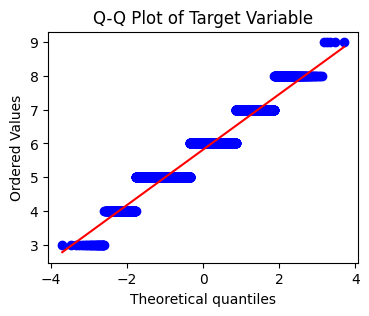

In [17]:
plt.figure(figsize=(4, 3))
stats.probplot(df_wine_quality['quality'], dist="norm", plot=plt)
plt.title('Q-Q Plot of Target Variable')
plt.show()

### *1*.(a).(3) Correlation Plot

We can see that there is no highly correlation happening between variables, and all predictors may have some relationship with quality.

Our data set is valid for further analysis.

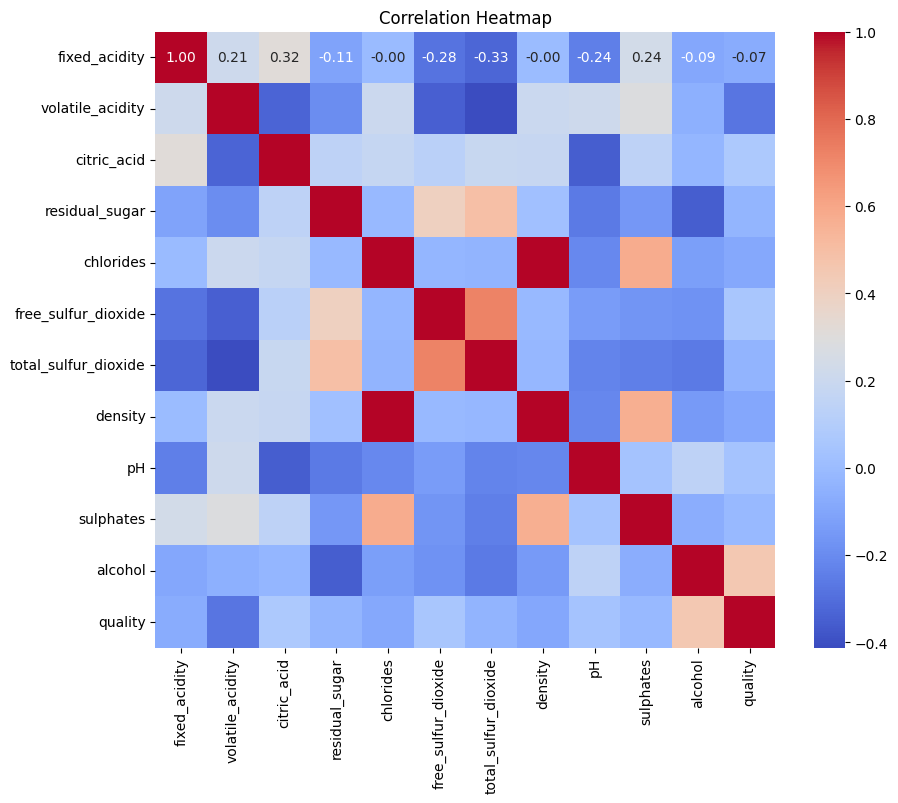

In [18]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_num.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

### *1*.(a).(4) Box Plot

We can see that our predictors are desperated, which means our data may cover most of the situations for wines with good prediction result for the model.

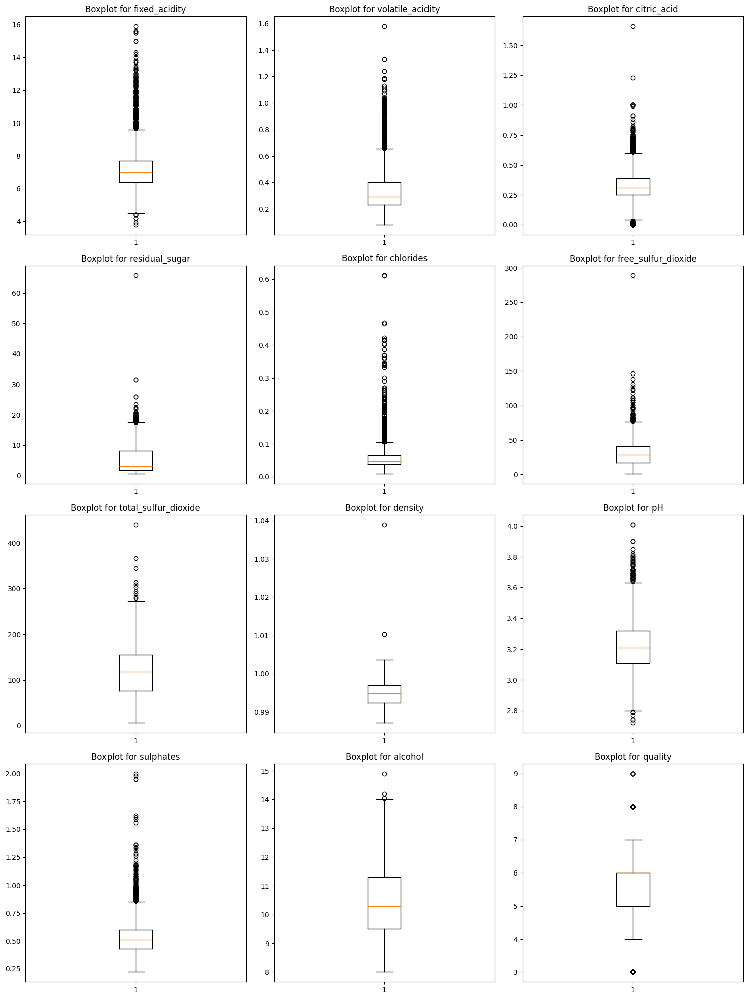

In [19]:
# Creating Box Plots
# Get the numeric columns
numeric_columns = df_wine_quality.select_dtypes(include='number').columns

# Set number of rows and columns for subplots
n_cols = 3  # Number of plots per row
n_rows = int(np.ceil(len(numeric_columns) / n_cols))  # Calculate number of rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))

# Plot each boxplot in a grid
for i, column in enumerate(numeric_columns):
    row = i // n_cols  # Calculate row index
    col = i % n_cols  # Calculate column index
    ax = axes[row, col]  # Select the specific subplot
    ax.boxplot(df_wine_quality[column])  # Create boxplot for the current column
    ax.set_title(f"Boxplot for {column}")  # Set the title

# Hide any unused subplots
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes.flatten()[j])

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

### *1*.(b) Using Pandas Profiling to do exploratory analysis

In [20]:
#Using profilereport we can do an exploratory analysis
profile = ProfileReport(df_wine_quality, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Findings:

#### 1.Dataset Overview:

The dataset consists of 13 variables and 6497 observations.

There are no missing values, but 992 duplicate rows (15.3%) are present, which might affect the analysis.

#### 2.Variable Correlations:

Several variables exhibit high correlations. For instance:

Alcohol is highly correlated with density.

Chlorides and color are also highly correlated with other variables such as alcohol, pH, and sulphates.

Such high correlations might indicate multicollinearity, which could affect regression analysis.

#### 3.Distinct Values:

The color variable has two categories: red and white, with a majority being white wines (4898), and 1599 red wines.

Quality is the response variable with 7 distinct categories, ranging from 3 to 9.

#### 4.Distributions:

Most variables are not normally distributed, as observed in their histograms. For example, sulphates, citric acid, and pH exhibit skewness.

Quality is more evenly distributed, with a higher concentration in the mid-range values (5 and 6).

#### 5.Outliers and Zeros:

Some variables like citric acid contain 2.3% zeros, and residual sugar ranges from very low to extremely high values (0.6 to 65.8), suggesting potential outliers.

#### 6. Duplicate Rows:

There are several frequent duplicates, which should be addressed either by removal or aggregation depending on their impact.

### New Discovery

#### High Correlations:

There are multiple high correlations between variables. For instance, alcohol is highly correlated with density, and color is correlated with chlorides, fixed_acidity, and total_sulfur_dioxide. These relationships suggest potential multicollinearity, which could affect predictive models that rely on independent variables.

#### Duplicate Rows:

There are a significant number of duplicate rows (992 or 15.3%). Duplicate data might skew the model's understanding of relationships between variables. Depending on the analysis goals, these duplicates might need to be removed to avoid overfitting.

#### Zeros: 

The citric_acid variable has 151 instances of zero values, which represent 2.3% of the dataset. This suggests a potential issue with how this feature was recorded, or it might represent valid data indicating no citric acid content in some wines. Further investigation might be needed to determine if these zeros are legitimate or require treatment (e.g., imputation).

#### Skewness and Kurtosis: 

Many of the variables, like fixed_acidity and volatile_acidity, exhibit skewness (positive or negative) and non-normal distributions. These distributions might require transformation (such as logarithmic transformation) to normalize them before applying certain types of regression models, especially those that assume normality.

#### Distinct Values: 

Several variables, like density and chlorides, have a limited number of distinct values. This might indicate that these features are more categorical in nature or could have constrained ranges, influencing their contribution to predictive models.

#### No Missing Data: 

There are no missing values in the dataset, which simplifies the preprocessing steps and indicates that the data is complete for analysis.

### *1*.(C) Estimate density distributions and show the plots with the respective fits


Using density and CDF to show that our data is not normally distributed and it has different ways to fit them.


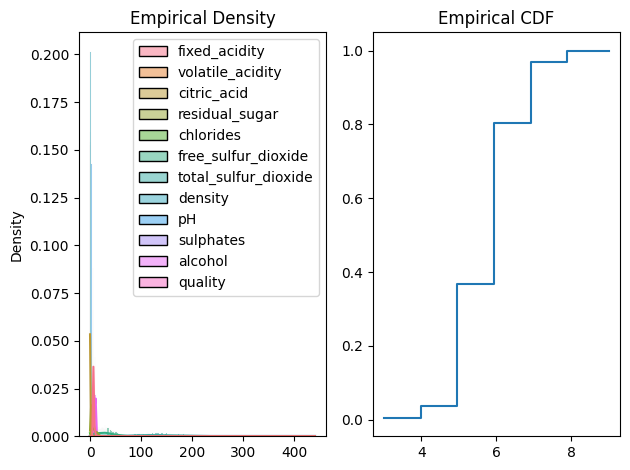

In [21]:
# create empricial CDF
df_wine_quality_ecdf = sm.distributions.ECDF(df_wine_quality['quality']) # fit distribution
df_wine_quality_range = np.linspace(min(df_wine_quality['quality']), max(df_wine_quality['quality'])) # grid of values
df_wine_quality_cdf = df_wine_quality_ecdf(df_wine_quality_range) # apply distribution

# First we look at empirical distributions
fig3, ax3 = plt.subplots(1, 2)
sns.histplot(df_wine_quality, stat='density', kde=True, ax=ax3[0])
ax3[0].lines[0].set_color('crimson')
ax3[0].lines[0].set_linestyle('--')
ax3[0].set_title('Empirical Density')
plt.step(df_wine_quality_range, df_wine_quality_cdf)
ax3[1].set_title('Empirical CDF')
plt.tight_layout()


Density Overview

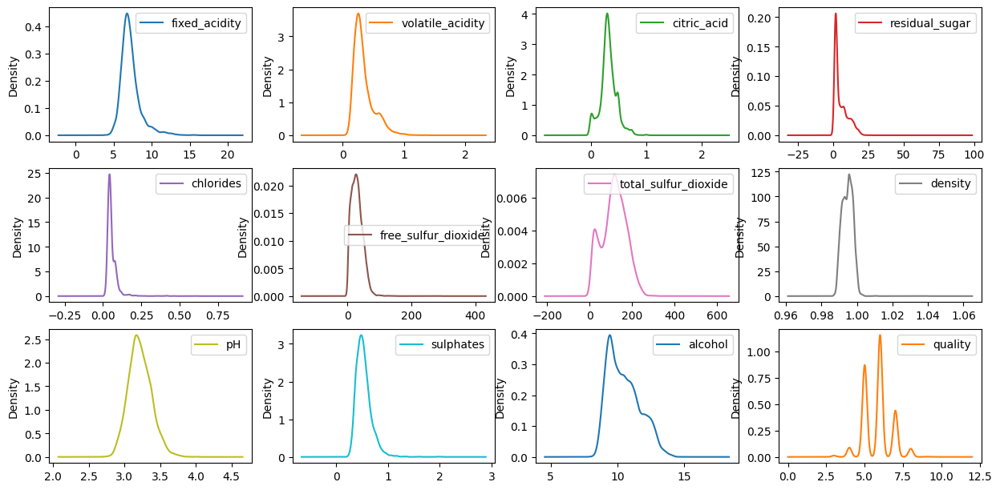

In [22]:
df_wine_quality.plot(kind='density', subplots=True, layout=(4,4), sharex=False, figsize=(15,10))
plt.show()

Transfering Python data to R data so we could use R to draw Cullen & Frey plot

In [23]:
pandas2ri.activate()

In [24]:
ro.globalenv['wine_quality']=df_wine_quality

#### Draw Cullen & Frey plot

For quality which is our "y", the normal distribution is fitable and easy to use. However, quality can only take integer between 1-10, so it will not be a good fit.

summary statistics
------
min:  3   max:  9 
median:  6 
mean:  5.818378 
estimated sd:  0.8732553 
estimated skewness:  0.1896227 
estimated kurtosis:  3.232322 


Loading required package: MASS
Loading required package: survival
In addition: Warning messages:
1: package ‘fitdistrplus’ was built under R version 4.3.3 
2: In data("wine_quality") : data set ‘wine_quality’ not found


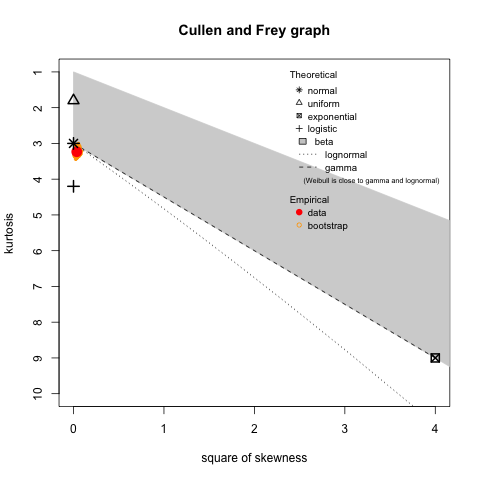

In [25]:
%%R
set.seed(10) # for bootstrap
library("fitdistrplus")
data("wine_quality")

# Cullen-Frey Graph
descdist(wine_quality$quality, boot = 1000)

Black line is our fit line which is not good because we only can take seperated integer here.

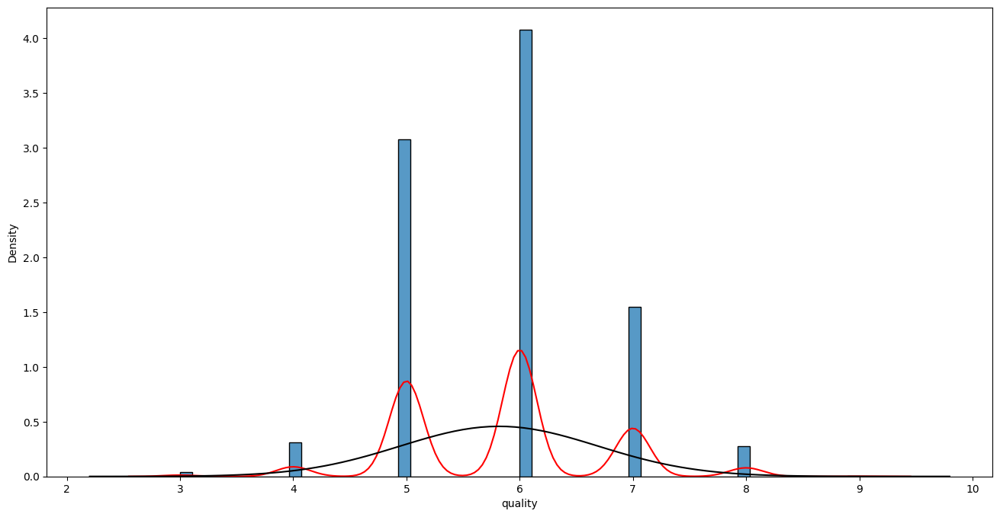

In [26]:
#Quality
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['quality'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['quality'],color='red')
#Normal distribution fits
mu, std = stats.norm.fit(df_wine_quality['quality'])
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p_norm = stats.norm.pdf(x, mu, std)
plt.plot(x, p_norm,color='black')

For fixed_acidity, both lognormal or gamma distribution maybe fitable. We will try them both.

summary statistics
------
min:  3.8   max:  15.9 
median:  7 
mean:  7.215307 
estimated sd:  1.296434 
estimated skewness:  1.72329 
estimated kurtosis:  8.061161 


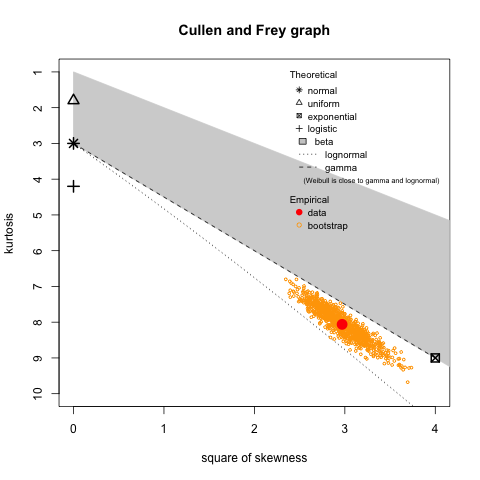

In [27]:
%%R
descdist(wine_quality$fixed_acidity, boot = 1000)

Blue line (Lognormal fit) and Green line(Gamma fit) are both OK for fixed_acidity

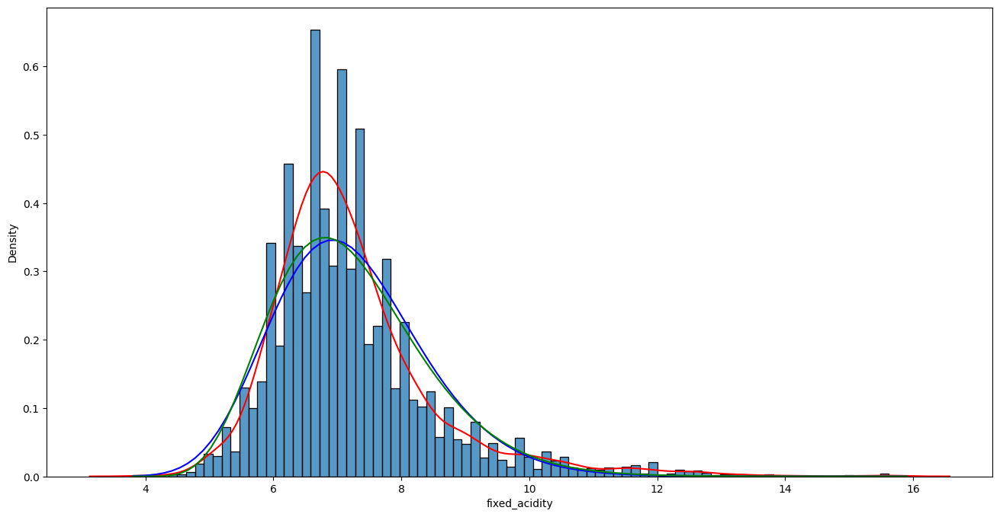

In [28]:
#fixed_acidity
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['fixed_acidity'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['fixed_acidity'],color='red')
# Lognormal distribution fit
shape, loc, scale = stats.lognorm.fit(df_wine_quality['fixed_acidity'], floc=0)  # forcing location to 0
x = np.linspace(df_wine_quality['fixed_acidity'].min(), df_wine_quality['fixed_acidity'].max(), 100)
p_lognorm = stats.lognorm.pdf(x, shape, loc, scale)
plt.plot(x, p_lognorm, color='blue', label='Lognormal Fit')

# Gamma distribution fit
shape, loc, scale = stats.gamma.fit(df_wine_quality['fixed_acidity'])
p_gamma = stats.gamma.pdf(x, shape, loc, scale)
plt.plot(x, p_gamma, color='green', label='Gamma Fit')


For volatile_acidity, beta distribution is fitable. We will try it.

summary statistics
------
min:  0.08   max:  1.58 
median:  0.29 
mean:  0.339666 
estimated sd:  0.1646365 
estimated skewness:  1.495097 
estimated kurtosis:  5.825372 


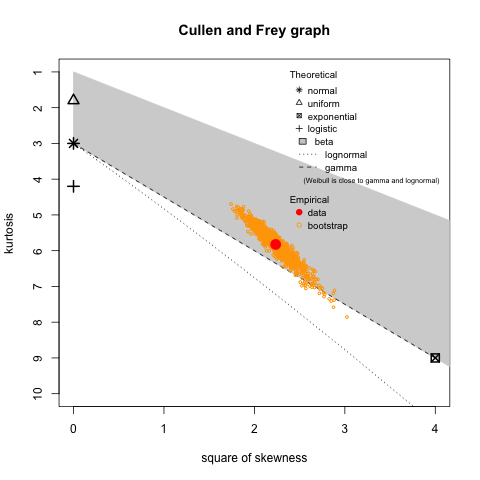

In [29]:
%%R
descdist(wine_quality$volatile_acidity, boot = 1000)

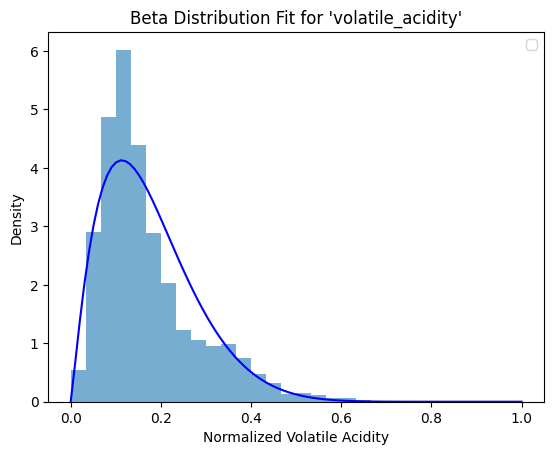

In [30]:
#volatile_acidity
# Normalizing the alcohol data and adding a small epsilon to avoid 0 and 1 values
epsilon = 1e-6  # Small value to avoid hitting exact 0 or 1
volatile_acidity_min = df_wine_quality['volatile_acidity'].min()
volatile_acidity_max = df_wine_quality['volatile_acidity'].max()
volatile_acidity_normalized = (df_wine_quality['volatile_acidity'] - volatile_acidity_min) / (volatile_acidity_max - volatile_acidity_min)

# Apply epsilon adjustments
volatile_acidity_normalized = np.clip(volatile_acidity_normalized, epsilon, 1 - epsilon)

# Step 2: Fit the Beta distribution
a, b, loc, scale = stats.beta.fit(volatile_acidity_normalized, floc=0, fscale=1)

# Step 3: Create a smooth range of x values for the plot
x = np.linspace(0, 1, 100)

# Step 4: Plot the fitted Beta PDF
p_beta = stats.beta.pdf(x, a, b, loc, scale)
plt.plot(x, p_beta, color='blue')
plt.hist(volatile_acidity_normalized, bins=30, density=True, alpha=0.6)

# Formatting the plot
plt.title("Beta Distribution Fit for 'volatile_acidity'")
plt.xlabel("Normalized Volatile Acidity")
plt.ylabel("Density")
plt.legend()
plt.show()

Blue line (Beta fit) is fit the normalized data well.

summary statistics
------
min:  0   max:  1.66 
median:  0.31 
mean:  0.3186332 
estimated sd:  0.1453179 
estimated skewness:  0.4717307 
estimated kurtosis:  5.397239 


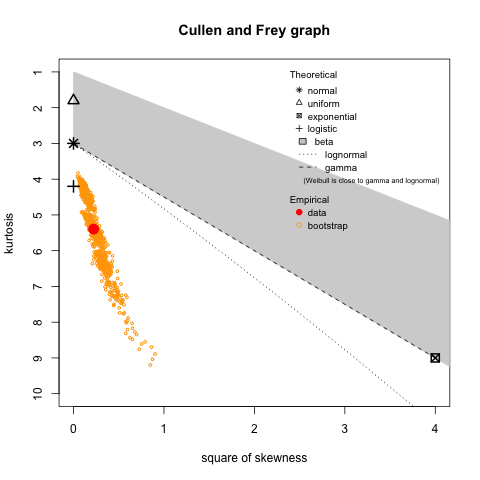

In [31]:
%%R
descdist(wine_quality$citric_acid, boot = 1000)

For citric_aci, logistic distribution maybe fitable. We will try it.

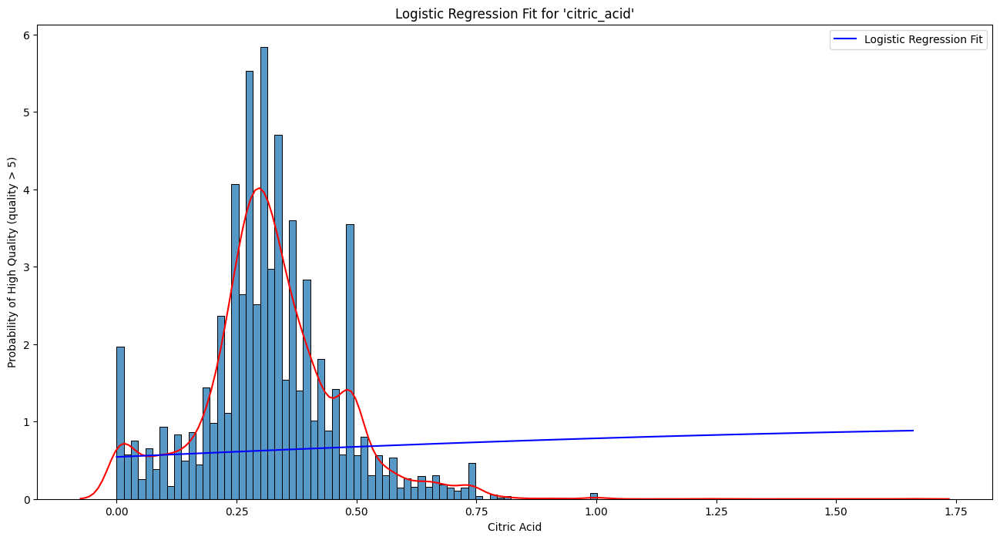

In [32]:
#citric_acid
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['citric_acid'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['citric_acid'],color='red')
# Example: Convert wine quality into a binary classification (e.g., quality > 5 -> 1, else 0)
df_wine_quality['quality_binary'] = (df_wine_quality['quality'] > 5).astype(int)

# Extract the feature 'citric_acid' and the binary target 'quality_binary'
X = df_wine_quality[['citric_acid']]
y = df_wine_quality['quality_binary']

# Standardize the feature 'citric_acid'
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Initialize and fit the logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

# Create a smooth range of citric_acid values for plotting
x_values = np.linspace(X_scaled.min(), X_scaled.max(), 100).reshape(-1, 1)

# Predict the probability for the smoothed x_values
y_prob = log_reg.predict_proba(x_values)[:, 1]

# Plot the logistic regression fit (probability curve)
plt.plot(scaler.inverse_transform(x_values), y_prob, color='blue', label='Logistic Regression Fit')

# Formatting the plot
plt.title("Logistic Regression Fit for 'citric_acid'")
plt.xlabel("Citric Acid")
plt.ylabel("Probability of High Quality (quality > 5)")
plt.legend()
plt.show()

However, the blue line(logistic regression) fail to regress our distribution here. It is OK becasue in CF plot, it is really far a way from logistic point.

summary statistics
------
min:  0.6   max:  65.8 
median:  3 
mean:  5.443235 
estimated sd:  4.757804 
estimated skewness:  1.435404 
estimated kurtosis:  7.359272 


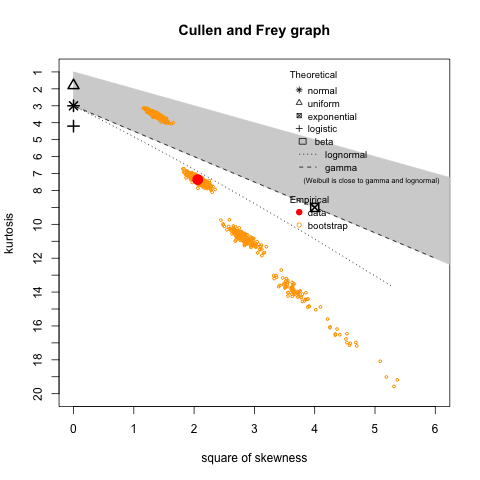

In [33]:
%%R
descdist(wine_quality$residual_sugar, boot = 1000)

For residual_sugar, lognormal maybe fitable. We will try it.

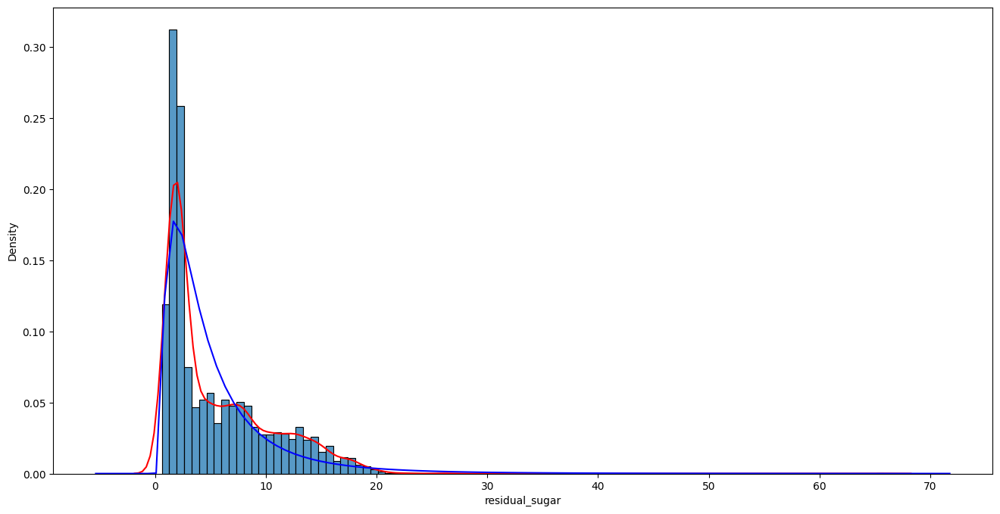

In [34]:
#residual_sugar
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['residual_sugar'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['residual_sugar'],color='red')
# Fit a lognormal distribution to the 'residual_sugar' data
shape, loc, scale = stats.lognorm.fit(df_wine_quality['residual_sugar'], floc=0)

# Create a smooth range of x values based on the data
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

# Compute the probability density function (PDF) for the lognormal distribution
p_lognorm = stats.lognorm.pdf(x, shape, loc, scale)

# Plot the lognormal distribution
plt.plot(x, p_lognorm, color='blue', label='Lognormal Fit')

Blue line (lgnormal fit) is regress the distribution just fine, but we notice that bootstrapping points are far away from the lgnormal, which means this result maybe not robust.

summary statistics
------
min:  0.009   max:  0.611 
median:  0.047 
mean:  0.05603386 
estimated sd:  0.0350336 
estimated skewness:  5.399828 
estimated kurtosis:  53.89805 


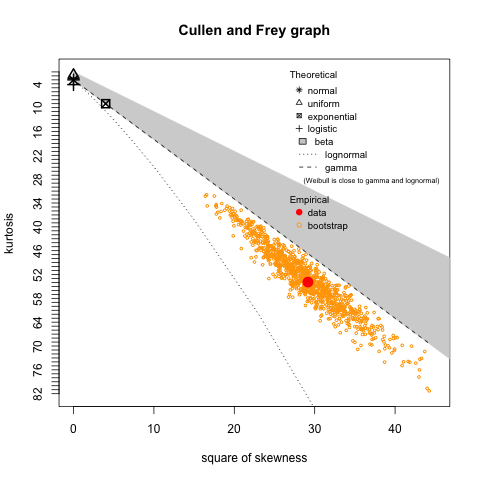

In [35]:
%%R
descdist(wine_quality$chlorides, boot = 1000)

For chlorides, gamma maybe fitable. We will try it.

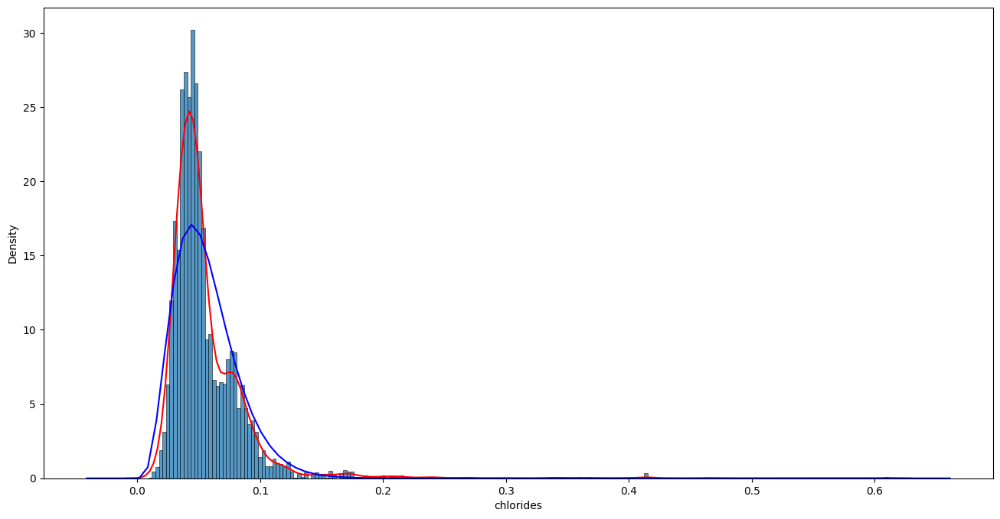

In [36]:
#chlorides
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['chlorides'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['chlorides'],color='red')
# Fit a gamma distribution to the 'chlorides' data
shape, loc, scale = stats.gamma.fit(df_wine_quality['chlorides'], floc=0)

# Create a smooth range of x values based on the data
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

# Compute the probability density function (PDF) for the gamma distribution
p_gamma = stats.gamma.pdf(x, shape, loc, scale)

# Plot the gamma distribution
plt.plot(x, p_gamma, color='blue', label='Gamma Fit')


Blue line (gamma fit) is regress the distribution is OK, but we notice it fails to take the highest point.

summary statistics
------
min:  1   max:  289 
median:  29 
mean:  30.52532 
estimated sd:  17.7494 
estimated skewness:  1.220066 
estimated kurtosis:  10.90624 


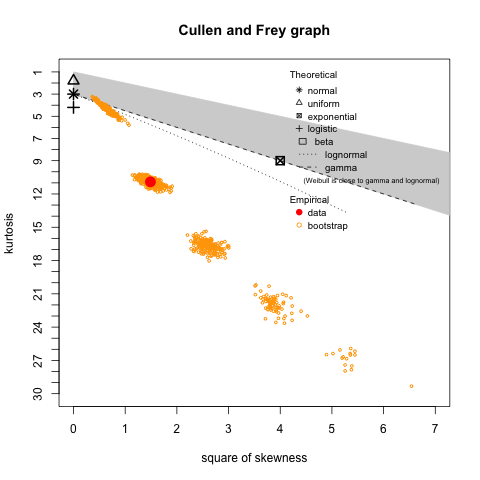

In [37]:
%%R
descdist(wine_quality$free_sulfur_dioxide, boot = 1000)

For free_sulfur_dioxide, maybe lgnormal or gamma is fitable. We will try them.

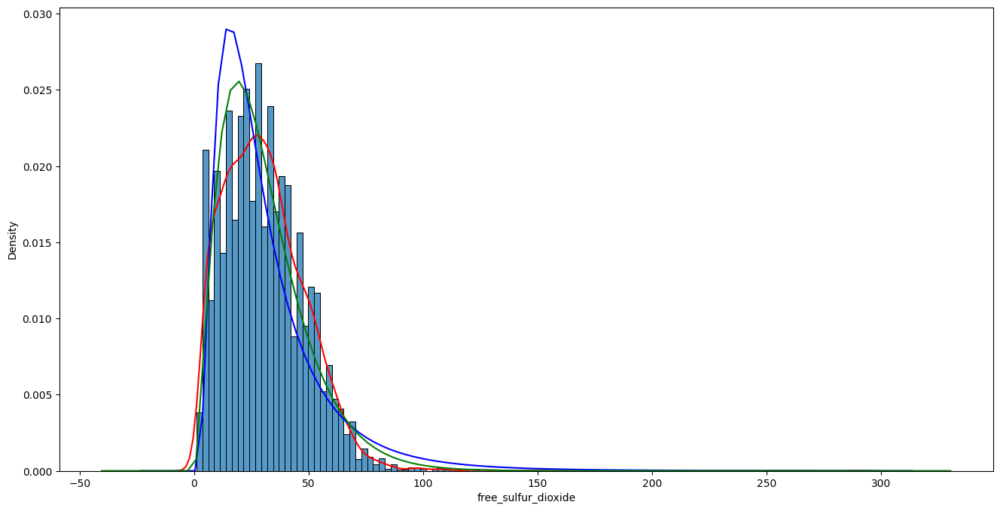

In [38]:
#free_sulfur_dioxide
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['free_sulfur_dioxide'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['free_sulfur_dioxide'],color='red')

# Fit a lognormal distribution to 'free_sulfur_dioxide'
shape, loc, scale = stats.lognorm.fit(df_wine_quality['free_sulfur_dioxide'], floc=0)

# Create a smooth range of x values based on the data
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

# Compute the probability density function (PDF) for the lognormal distribution
p_lognorm = stats.lognorm.pdf(x, shape, loc, scale)

# Plot the lognormal distribution
plt.plot(x, p_lognorm, color='blue', label='Lognormal Fit')

# Fit a gamma distribution to 'free_sulfur_dioxide'
shape, loc, scale = stats.gamma.fit(df_wine_quality['free_sulfur_dioxide'], floc=0)

# Create a smooth range of x values based on the data
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

# Compute the probability density function (PDF) for the gamma distribution
p_gamma = stats.gamma.pdf(x, shape, loc, scale)

# Plot the gamma distribution
plt.plot(x, p_gamma, color='green', label='Gamma Fit')


Blue line (lgnormal fit) and gamma(green fit) both regressed the distribution, but gamma is better in this case.

summary statistics
------
min:  6   max:  440 
median:  118 
mean:  115.7446 
estimated sd:  56.52185 
estimated skewness:  -0.001177478 
estimated kurtosis:  2.628336 


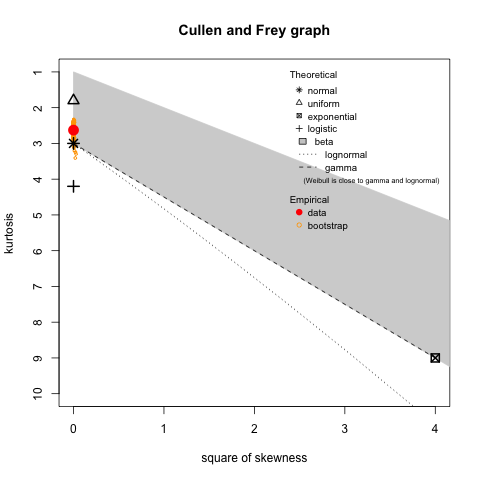

In [39]:
%%R
descdist(wine_quality$total_sulfur_dioxide, boot = 1000)

For total_sulfur_dioxide, normal distribution is fitable. We will try it.

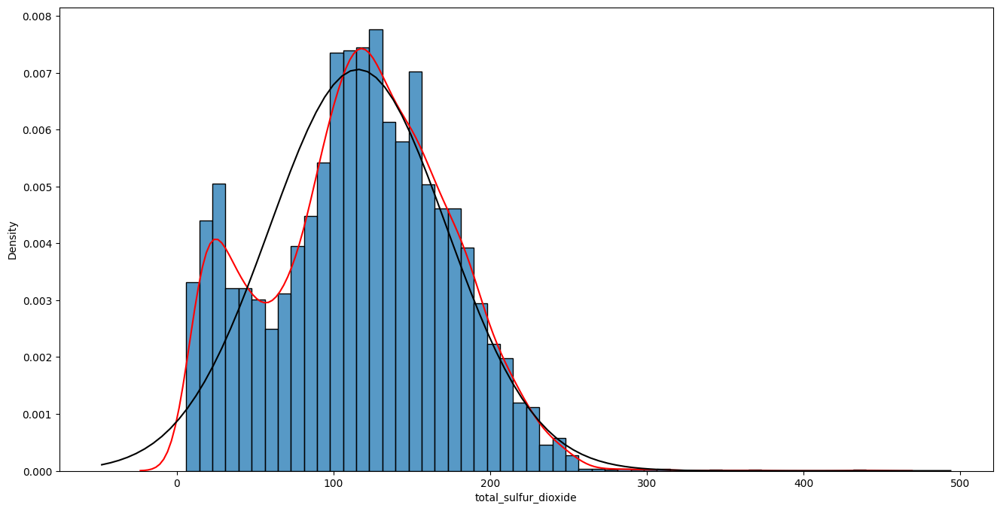

In [40]:
#total_sulfur_dioxide
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['total_sulfur_dioxide'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['total_sulfur_dioxide'],color='red')
#Normal distribution fits
mu, std = stats.norm.fit(df_wine_quality['total_sulfur_dioxide'])
xmin, xmax = plt.xlim( )
x = np.linspace(xmin, xmax, 100)
p_norm = stats.norm.pdf(x, mu, std)
plt.plot(x, p_norm,color='black')

black normal distribution is a good fit here.

summary statistics
------
min:  0.98711   max:  1.03898 
median:  0.99489 
mean:  0.9946966 
estimated sd:  0.002998673 
estimated skewness:  0.5036017 
estimated kurtosis:  9.606067 


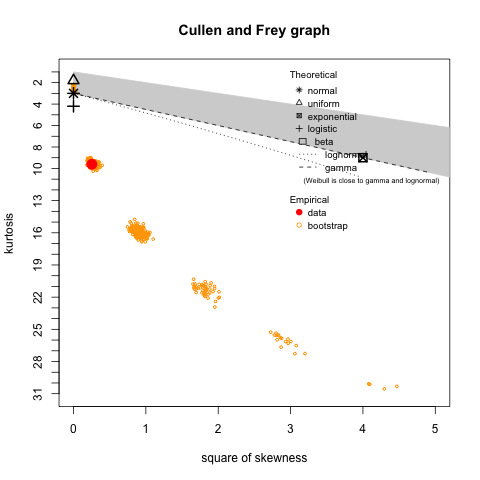

In [41]:
%%R
descdist(wine_quality$density, boot = 1000)

For density, normal distribution maybe is fitable. We will try it.

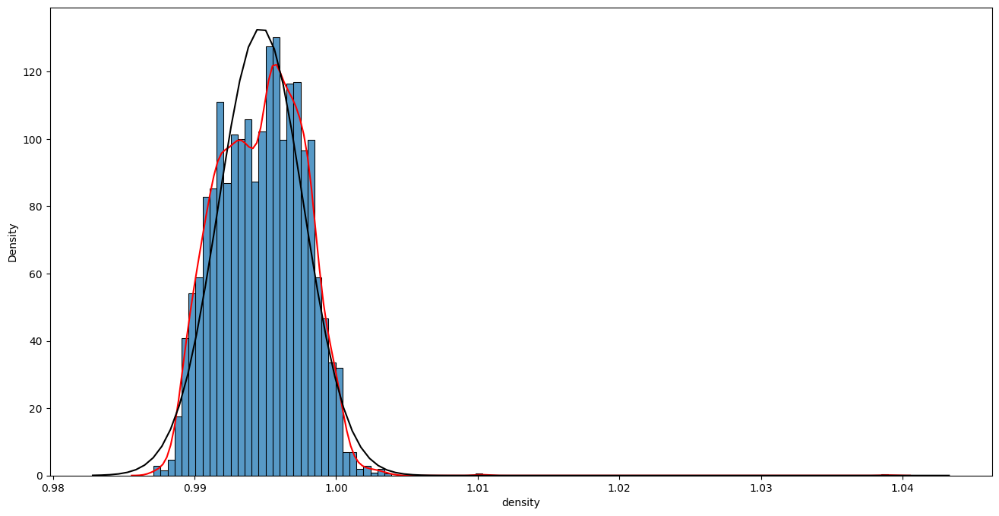

In [42]:
#density
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['density'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['density'],color='red')
#Normal distribution fits
mu, std = stats.norm.fit(df_wine_quality['density'])
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p_norm = stats.norm.pdf(x, mu, std)
plt.plot(x, p_norm,color='black')


black normal distribution is a good fit here.

summary statistics
------
min:  2.72   max:  4.01 
median:  3.21 
mean:  3.218501 
estimated sd:  0.1607872 
estimated skewness:  0.3868388 
estimated kurtosis:  3.367657 


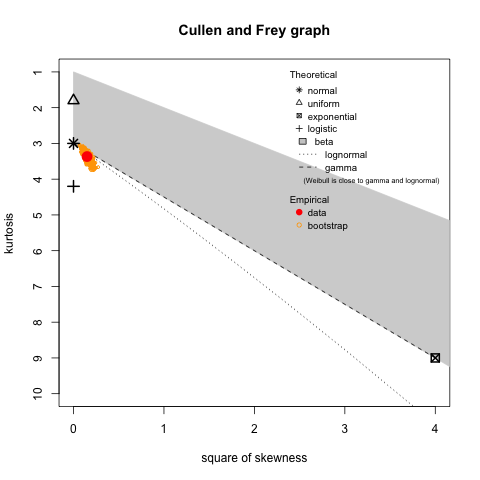

In [43]:
%%R
descdist(wine_quality$pH, boot = 1000)

For PH, maybe normal or lgnormal or gamma is fitable. We will try them.

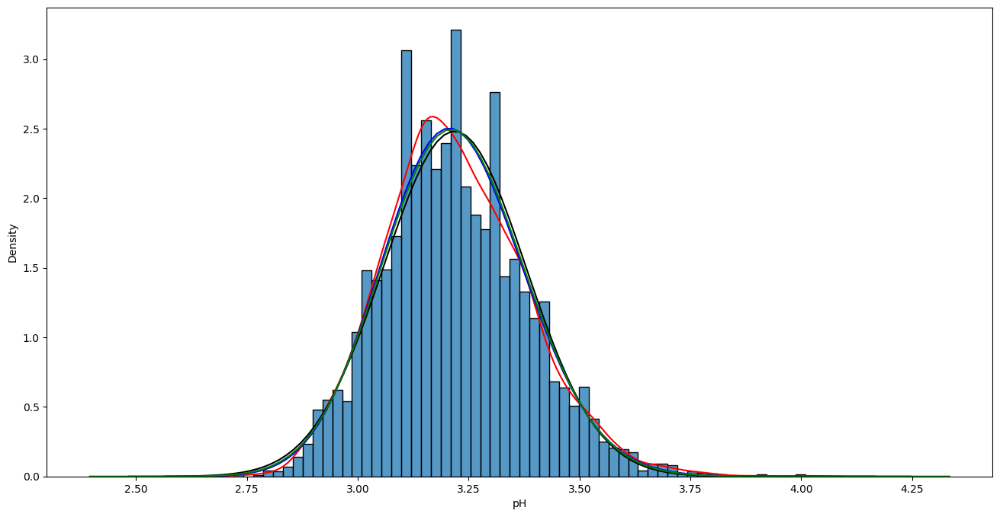

In [44]:
#pH
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['pH'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['pH'],color='red')
#Normal distribution fits
mu, std = stats.norm.fit(df_wine_quality['pH'])
xmin, xmax = plt.xlim( )
x = np.linspace(xmin, xmax, 100)
p_norm = stats.norm.pdf(x, mu, std)
plt.plot(x, p_norm,color='black')

# Lognormal distribution fit
shape, loc, scale = stats.lognorm.fit(df_wine_quality['pH'], floc=0)

# Create a smooth range of x values based on the data
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

# Compute the probability density function (PDF) for the lognormal distribution
p_lognorm = stats.lognorm.pdf(x, shape, loc, scale)

# Plot the lognormal distribution
plt.plot(x, p_lognorm, color='blue', label='Lognormal Fit')


# Gamma distribution fit
shape, loc, scale = stats.gamma.fit(df_wine_quality['pH'], floc=0)

# Create a smooth range of x values based on the data
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

# Compute the probability density function (PDF) for the gamma distribution
p_gamma = stats.gamma.pdf(x, shape, loc, scale)

# Plot the gamma distribution
plt.plot(x, p_gamma, color='green', label='Gamma Fit')


Blue line (lgnormal fit), gamma(green fit) and normal(black fit) regressed the distribution just fine, but normal just have one parameter and is easier, so we will take normal.

summary statistics
------
min:  0.22   max:  2 
median:  0.51 
mean:  0.5312683 
estimated sd:  0.1488059 
estimated skewness:  1.79727 
estimated kurtosis:  11.6537 


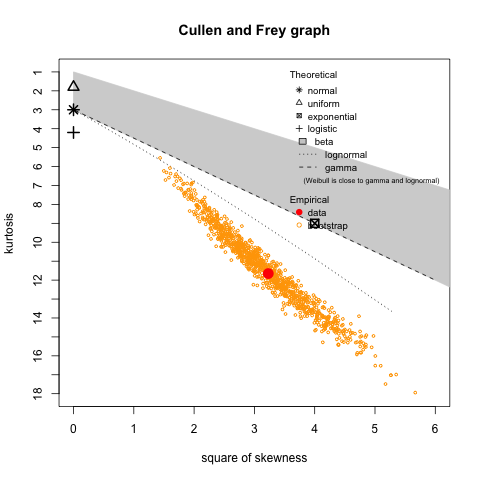

In [45]:
%%R
descdist(wine_quality$sulphates, boot = 1000)

For sulphates, lgnormal distribution maybe is fitable. We will try it.

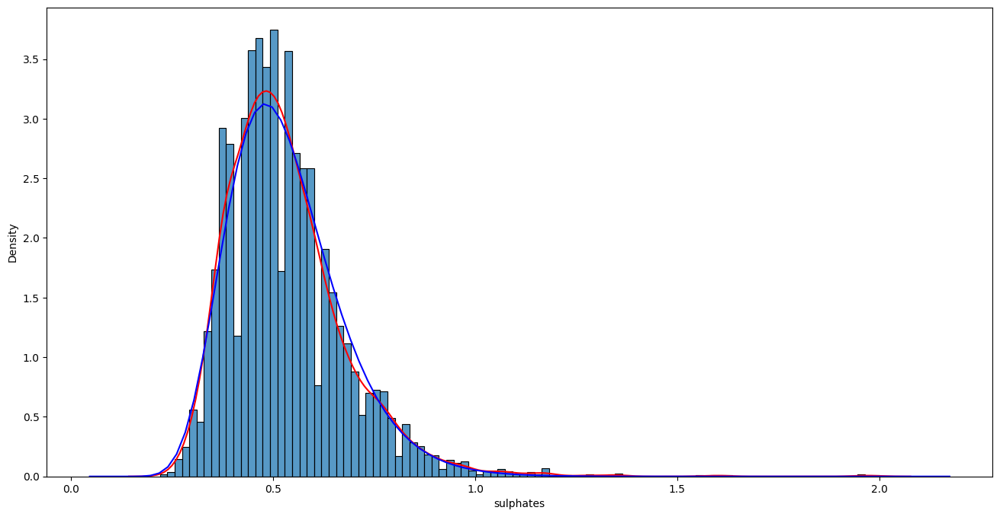

In [46]:
#sulphates
plt.figure(figsize = (16,8))
sns.histplot(df_wine_quality['sulphates'],stat = 'density')
plt.plot()
sns.kdeplot(df_wine_quality['sulphates'],color='red')

# Lognormal distribution fit
shape, loc, scale = stats.lognorm.fit(df_wine_quality['sulphates'], floc=0)

# Create a smooth range of x values based on the data
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)

# Compute the probability density function (PDF) for the lognormal distribution
p_lognorm = stats.lognorm.pdf(x, shape, loc, scale)

# Plot the lognormal distribution
plt.plot(x, p_lognorm, color='blue', label='Lognormal Fit')

Blue line (lgnormal fit) fits the data just fine.

summary statistics
------
min:  8   max:  14.9 
median:  10.3 
mean:  10.4918 
estimated sd:  1.192712 
estimated skewness:  0.5657177 
estimated kurtosis:  2.468313 


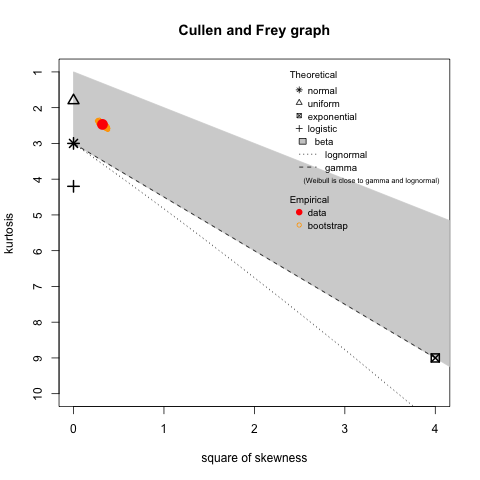

In [47]:
%%R
descdist(wine_quality$alcohol, boot = 1000)

For Alcohol, beta distribution maybe is fitable. We will try it.

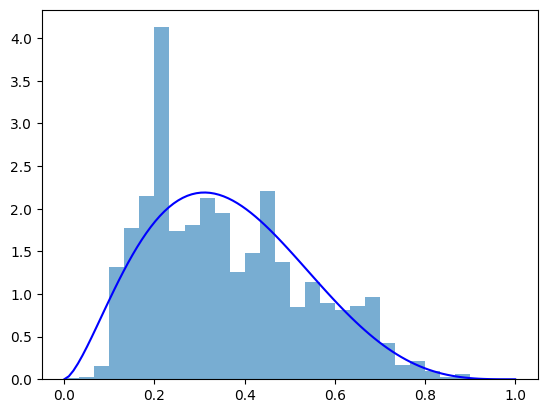

In [48]:
#Alcohol
# Normalizing the alcohol data and adding a small epsilon to avoid 0 and 1 values
epsilon = 1e-6  # Small value to avoid hitting exact 0 or 1
alcohol_min = df_wine_quality['alcohol'].min()
alcohol_max = df_wine_quality['alcohol'].max()
alcohol_normalized = (df_wine_quality['alcohol'] - alcohol_min) / (alcohol_max - alcohol_min)

# Apply epsilon adjustments
alcohol_normalized = np.clip(alcohol_normalized, epsilon, 1 - epsilon)

# Step 2: Fit the Beta distribution
a, b, loc, scale = stats.beta.fit(alcohol_normalized, floc=0, fscale=1)

# Step 3: Create a smooth range of x values for the plot
x = np.linspace(0, 1, 100)

# Step 4: Plot the fitted Beta PDF
p_beta = stats.beta.pdf(x, a, b, loc, scale)
plt.plot(x, p_beta, color='blue')
plt.hist(alcohol_normalized, bins=30, density=True, alpha=0.6)
plt.show()


Gamma here fit the data just fine.

### *1*.(D)Identify if there are any non-linearities within your variables. What transformations should you perform to make them linear? What would happen if you included non- linear variables in your regression models without transforming them first?

If we do not transform the non-linear variable first, our regression model have misrepresent the true pattern of the data. In addition, the residuals will not normaly distribute and they may show patterns. The coefficients and interpretation of the model will also be wrong which makes coefficients lose their interpretability.

In [49]:
df_wine_quality

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,quality_binary
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white,1


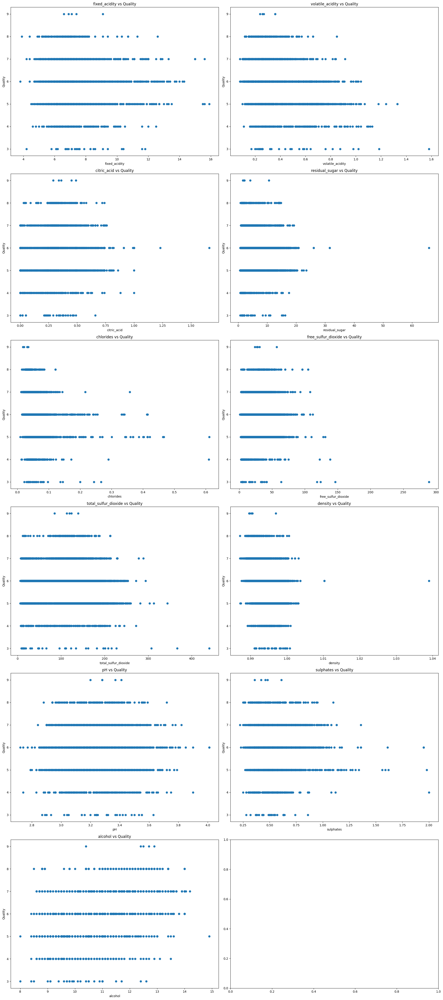

In [50]:
# Set up the number of rows and columns
cols = 2
rows = 6

# Create a figure and axes with the specified rows and columns
fig, axes = plt.subplots(rows, cols, figsize=(20, 45))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through the columns and plot each on a subplot
for idx, column in enumerate(df_num.columns):
    if column != 'quality':  # Assuming 'quality' is the response variable
        ax = axes[idx]  # Get the correct subplot
        ax.scatter(df_wine_quality[column], df_wine_quality['quality'])
        ax.set_title(f"{column} vs Quality")
        ax.set_xlabel(column)
        ax.set_ylabel('Quality')


# Adjust layout to prevent overlap
plt.tight_layout()

# Show the entire plot
plt.show()

Just by looking at these visualization of data, without working on any codes, we can conclude that there might not be a linear relation between predictor(all other variables) and y(wine quality). However, we still need to check if there is any ways to transform these variables to build a linear relationship. In our case, we will try to use Power transformation.

In [51]:
df = pd.DataFrame(df_wine_quality)

For Fixed acidity:

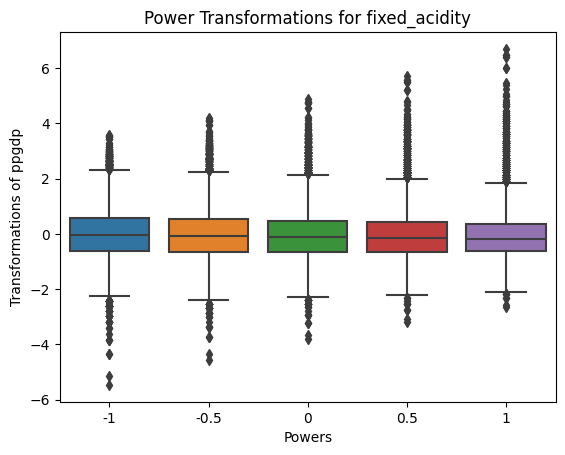

In [52]:
from sklearn import preprocessing
fixed_acidity_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['fixed_acidity'], lmbda=-1),
    '-0.5':stats.boxcox(df['fixed_acidity'], lmbda=-0.5),
    '0':stats.boxcox(df['fixed_acidity'], lmbda=0),
    '0.5':stats.boxcox(df['fixed_acidity'], lmbda=0.5),
    '1':stats.boxcox(df['fixed_acidity'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(fixed_acidity_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for fixed_acidity')
plt.show()

In [53]:
fixed_acidity = df['fixed_acidity'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(fixed_acidity, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=fixed_acidity) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=fixed_acidity) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=fixed_acidity) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=fixed_acidity) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = -1.31
rounded power = -1.3
Confidence interval = [-1.4162 -1.2036]

Lambda 	 Test Stat 	 p-value
0 	 607.496 	 0.0
0.5 	 1180.48 	 0.0
1 	 1958.23 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For Volatile acidity:

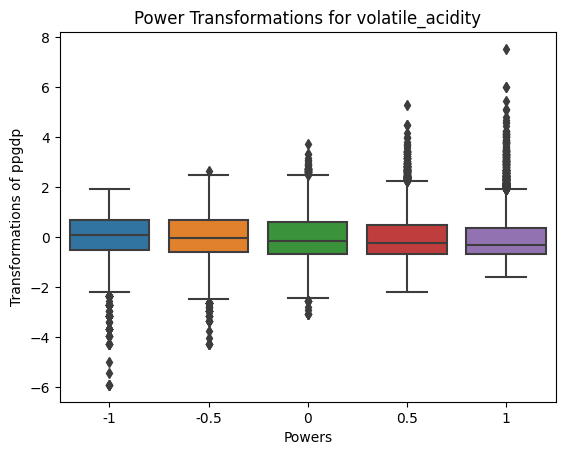

In [54]:
volatile_acidity_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['volatile_acidity'], lmbda=-1),
    '-0.5':stats.boxcox(df['volatile_acidity'], lmbda=-0.5),
    '0':stats.boxcox(df['volatile_acidity'], lmbda=0),
    '0.5':stats.boxcox(df['volatile_acidity'], lmbda=0.5),
    '1':stats.boxcox(df['volatile_acidity'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(volatile_acidity_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for volatile_acidity')
plt.show()

In [55]:
volatile_acidity = df['volatile_acidity'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(volatile_acidity, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=volatile_acidity) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=volatile_acidity) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=volatile_acidity) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=volatile_acidity) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = -0.28
rounded power = -0.3
Confidence interval = [-0.3279 -0.232 ]

Lambda 	 Test Stat 	 p-value
0 	 130.848 	 0.0
0.5 	 1014.27 	 0.0
1 	 2722.23 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For citric acid:

In [56]:
#Drop negative value or 0
df['citric_acid'] = df['citric_acid'].replace(0, np.nan)
df['citric_acid'] = df['citric_acid'].replace([np.inf, -np.inf], np.nan)
df['citric_acid'] = df['citric_acid'].dropna()

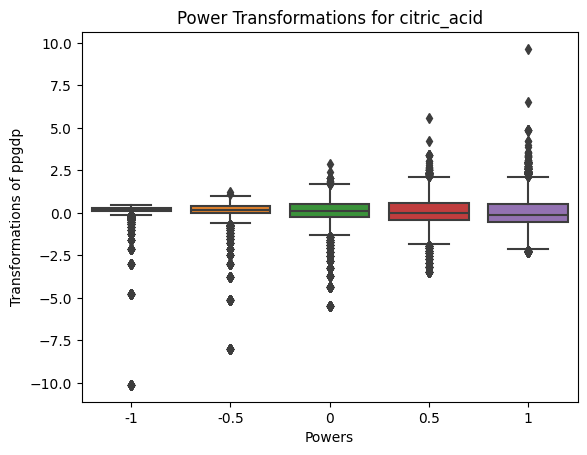

In [57]:
citric_acid_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['citric_acid'], lmbda=-1),
    '-0.5':stats.boxcox(df['citric_acid'], lmbda=-0.5),
    '0':stats.boxcox(df['citric_acid'], lmbda=0),
    '0.5':stats.boxcox(df['citric_acid'], lmbda=0.5),
    '1':stats.boxcox(df['citric_acid'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(citric_acid_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for citric_acid')
plt.show()

In [58]:
citric_acid = df['citric_acid'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(citric_acid, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=citric_acid) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=citric_acid) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=citric_acid) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=citric_acid) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = 0.7742
rounded power = 0.8
Confidence interval = [0.7432 0.8055]

Lambda 	 Test Stat 	 p-value
0 	 3189.94 	 0.0
0.5 	 328.594 	 0.0
1 	 187.737 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For residual sugar:

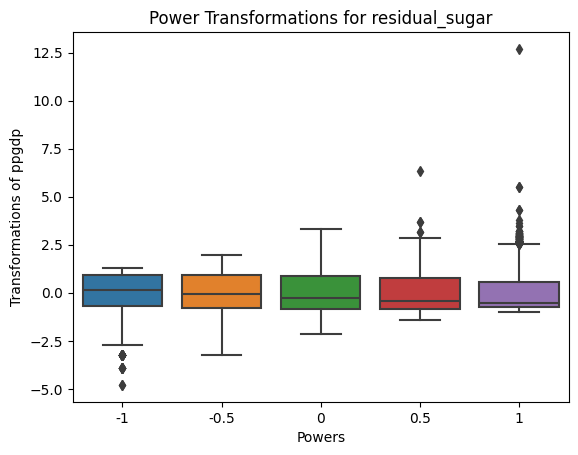

In [59]:
residual_sugar_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['residual_sugar'], lmbda=-1),
    '-0.5':stats.boxcox(df['residual_sugar'], lmbda=-0.5),
    '0':stats.boxcox(df['residual_sugar'], lmbda=0),
    '0.5':stats.boxcox(df['residual_sugar'], lmbda=0.5),
    '1':stats.boxcox(df['residual_sugar'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(residual_sugar_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for residual_sugar')
plt.show()

In [60]:
residual_sugar = df['residual_sugar'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(residual_sugar, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=residual_sugar) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=residual_sugar) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=residual_sugar) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=residual_sugar) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')


estimated power = -0.187
rounded power = -0.2
Confidence interval = [-0.2197 -0.1543]

Lambda 	 Test Stat 	 p-value
0 	 126.027 	 0.0
0.5 	 1705.91 	 0.0
1 	 5073.88 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For chlorides:

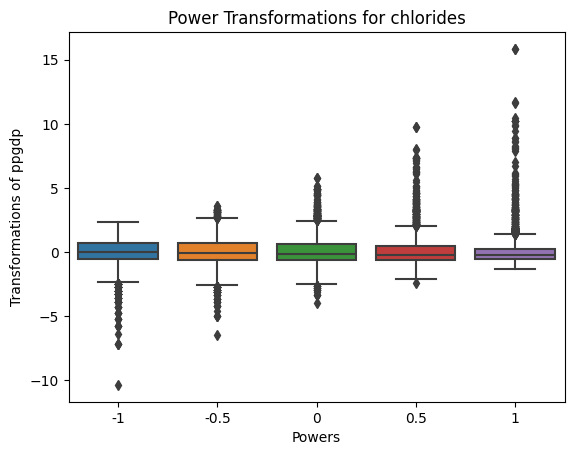

In [61]:
chlorides_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['chlorides'], lmbda=-1),
    '-0.5':stats.boxcox(df['chlorides'], lmbda=-0.5),
    '0':stats.boxcox(df['chlorides'], lmbda=0),
    '0.5':stats.boxcox(df['chlorides'], lmbda=0.5),
    '1':stats.boxcox(df['chlorides'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(chlorides_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for chlorides')
plt.show()

In [62]:
chlorides = df['chlorides'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(chlorides, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=chlorides) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=chlorides) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=chlorides) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=chlorides) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = -0.4689
rounded power = -0.5
Confidence interval = [-0.5094 -0.4286]

Lambda 	 Test Stat 	 p-value
0 	 552.919 	 0.0
0.5 	 2617.0 	 0.0
1 	 6795.85 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For free sulfur dioxide:

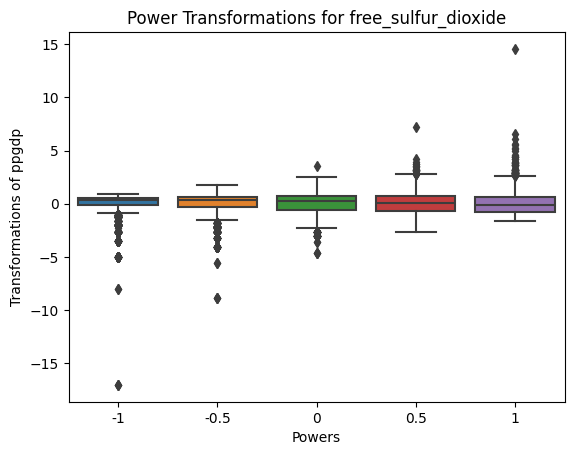

In [63]:
free_sulfur_dioxide_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['free_sulfur_dioxide'], lmbda=-1),
    '-0.5':stats.boxcox(df['free_sulfur_dioxide'], lmbda=-0.5),
    '0':stats.boxcox(df['free_sulfur_dioxide'], lmbda=0),
    '0.5':stats.boxcox(df['free_sulfur_dioxide'], lmbda=0.5),
    '1':stats.boxcox(df['free_sulfur_dioxide'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(free_sulfur_dioxide_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for free_sulfur_dioxide')
plt.show()

In [64]:
free_sulfur_dioxide = df['free_sulfur_dioxide'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(free_sulfur_dioxide, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=free_sulfur_dioxide) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=free_sulfur_dioxide) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=free_sulfur_dioxide) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=free_sulfur_dioxide) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = 0.4591
rounded power = 0.5
Confidence interval = [0.4275 0.4908]

Lambda 	 Test Stat 	 p-value
0 	 847.48 	 0.0
0.5 	 6.39799 	 0.01142
1 	 1092.45 	 0.0


Finally we got a non-zero p-value. However, the p-value is too small to make the lambda become a meaningful linearization changer.||

For total sulfur dioxide:


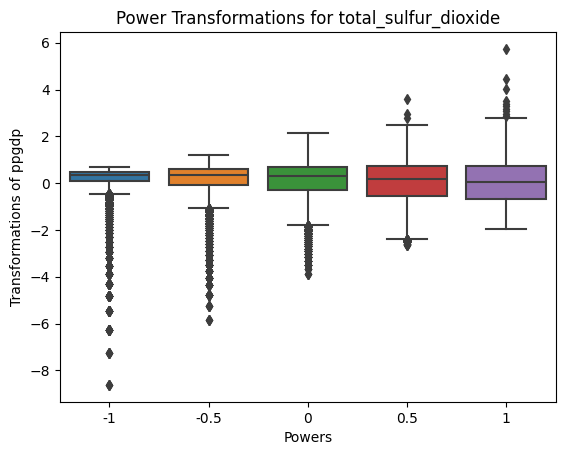

In [65]:
total_sulfur_dioxide_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['total_sulfur_dioxide'], lmbda=-1),
    '-0.5':stats.boxcox(df['total_sulfur_dioxide'], lmbda=-0.5),
    '0':stats.boxcox(df['total_sulfur_dioxide'], lmbda=0),
    '0.5':stats.boxcox(df['total_sulfur_dioxide'], lmbda=0.5),
    '1':stats.boxcox(df['total_sulfur_dioxide'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(total_sulfur_dioxide_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for total_sulfur_dioxide')
plt.show()

In [66]:
total_sulfur_dioxide = df['total_sulfur_dioxide'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(total_sulfur_dioxide, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=total_sulfur_dioxide) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=total_sulfur_dioxide) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=total_sulfur_dioxide) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=total_sulfur_dioxide) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = 0.8596
rounded power = 0.9
Confidence interval = [0.8235 0.8959]

Lambda 	 Test Stat 	 p-value
0 	 2563.54 	 0.0
0.5 	 407.638 	 0.0
1 	 56.2375 	 6.417e-14


Finally we got a non-zero p-value. However, the p-value is too small to make the lambda become a meaningful linearization changer.||

For density:

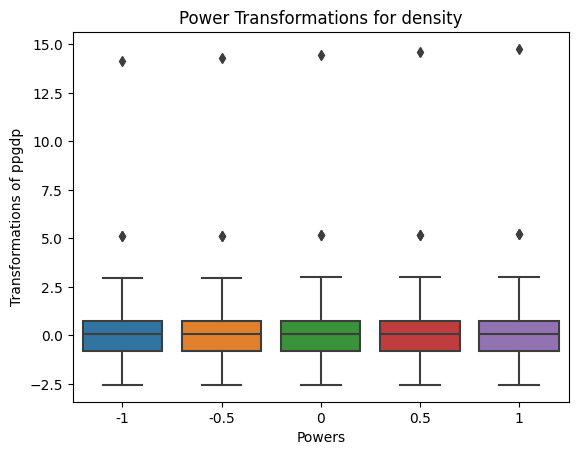

In [67]:
density_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['density'], lmbda=-1),
    '-0.5':stats.boxcox(df['density'], lmbda=-0.5),
    '0':stats.boxcox(df['density'], lmbda=0),
    '0.5':stats.boxcox(df['density'], lmbda=0.5),
    '1':stats.boxcox(df['density'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(density_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for density')
plt.show()

In [68]:
density = df['density'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(density, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=density) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=density) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=density) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=density) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = -23.76
rounded power = -23.8
Confidence interval = [-29.3425 -18.4332]

Lambda 	 Test Stat 	 p-value
0 	 94.0161 	 0.0
0.5 	 98.661 	 0.0
1 	 103.453 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For pH:

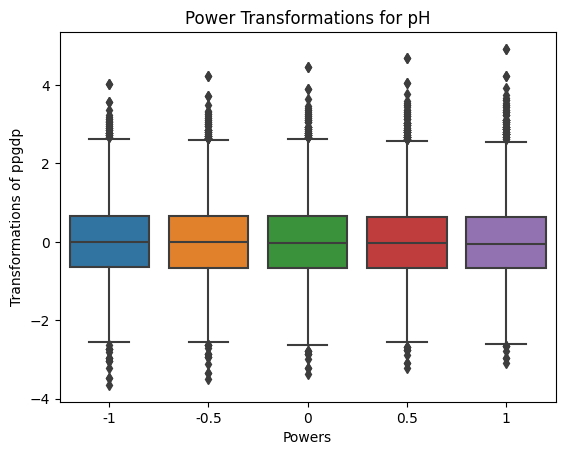

In [69]:
pH_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['pH'], lmbda=-1),
    '-0.5':stats.boxcox(df['pH'], lmbda=-0.5),
    '0':stats.boxcox(df['pH'], lmbda=0),
    '0.5':stats.boxcox(df['pH'], lmbda=0.5),
    '1':stats.boxcox(df['pH'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(pH_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for pH')
plt.show()

In [70]:
pH = df['pH'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(pH, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=pH) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=pH) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=pH) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=pH) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = -1.482
rounded power = -1.5
Confidence interval = [-1.8801 -1.0851]

Lambda 	 Test Stat 	 p-value
0 	 53.9413 	 2.066e-13
0.5 	 96.8221 	 0.0
1 	 152.387 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For sulphates:

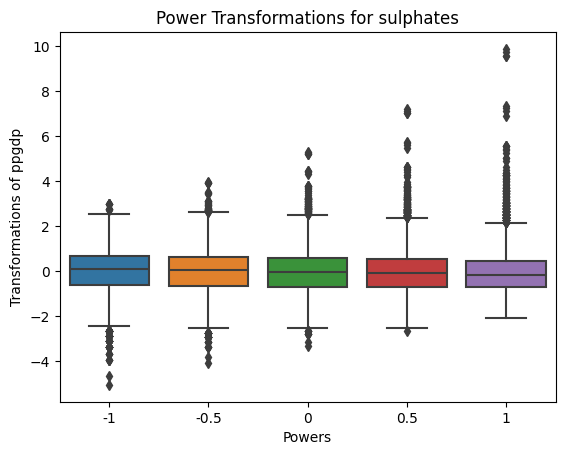

In [71]:
sulphates_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['sulphates'], lmbda=-1),
    '-0.5':stats.boxcox(df['sulphates'], lmbda=-0.5),
    '0':stats.boxcox(df['sulphates'], lmbda=0),
    '0.5':stats.boxcox(df['sulphates'], lmbda=0.5),
    '1':stats.boxcox(df['sulphates'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(sulphates_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for sulphates')
plt.show()

In [72]:
sulphates = df['sulphates'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(sulphates, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=sulphates) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=sulphates) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=sulphates) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=sulphates) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = -0.4592
rounded power = -0.5
Confidence interval = [-0.5338 -0.385 ]

Lambda 	 Test Stat 	 p-value
0 	 152.095 	 0.0
0.5 	 697.433 	 0.0
1 	 1713.5 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

For alcohol:

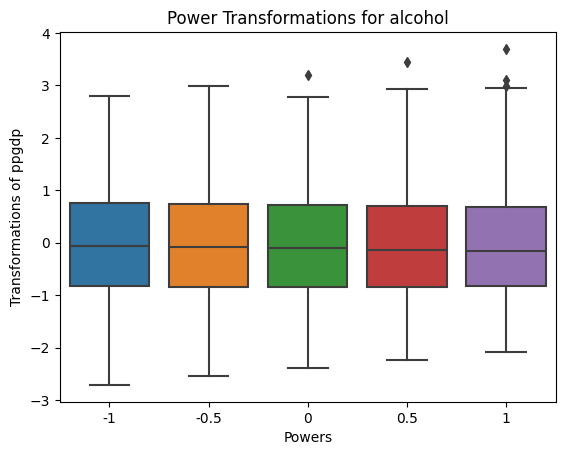

In [73]:
alcohol_boxcox = pd.DataFrame({
    '-1':stats.boxcox(df['alcohol'], lmbda=-1),
    '-0.5':stats.boxcox(df['alcohol'], lmbda=-0.5),
    '0':stats.boxcox(df['alcohol'], lmbda=0),
    '0.5':stats.boxcox(df['alcohol'], lmbda=0.5),
    '1':stats.boxcox(df['alcohol'], lmbda=1)
}).apply(preprocessing.scale, axis=0) # center and scale data

# Plotting
sns.boxplot(alcohol_boxcox)
plt.ylabel('Transformations of ppgdp')
plt.xlabel('Powers')
plt.title('Power Transformations for alcohol')
plt.show()

In [74]:
alcohol = df['alcohol'].dropna() # remove missing values
_, un_lambda, un_ci = stats.boxcox(alcohol, alpha=0.05)

# Print optimal results
print(f'estimated power = {un_lambda:.4}\n' + f'rounded power = {np.round(un_lambda,1)}\n' +
      f'Confidence interval = {np.round(un_ci, 4)}')

# Compute log-likelihoods
un_Lopt_ll = stats.boxcox_llf(lmb=un_lambda, data=alcohol) # optimal lambda
un_L0_ll = stats.boxcox_llf(lmb=0, data=alcohol) # lambda = 0
un_L05_ll = stats.boxcox_llf(lmb=0.5, data=alcohol) # lambda = 0.5
un_L1_ll = stats.boxcox_llf(lmb=1, data=alcohol) # lambda = 1
un_test_lambda = [0, 0.5, 1] # combine into one list

# Compute likelihood-ratio test statistics: T = 2 * (LogLik_optimal - LogLik_)
un_L0_stat = 2 * (un_Lopt_ll - un_L0_ll)
un_L05_stat = 2 * (un_Lopt_ll - un_L05_ll)
un_L1_stat = 2 * (un_Lopt_ll - un_L1_ll)
un_test_stat = [un_L0_stat, un_L05_stat, un_L1_stat] # combine into one list

# Compute p-values
un_L0_p = 1 - stats.chi2.cdf(un_L0_stat, df=1)
un_L05_p = 1 - stats.chi2.cdf(un_L05_stat, df=1)
un_L1_p = 1 - stats.chi2.cdf(un_L1_stat, df=1)
un_test_p = [un_L0_p, un_L05_p, un_L1_p] # combine into one list


# Print results
print('\nLambda \t Test Stat \t p-value')
for p in zip(un_test_lambda, un_test_stat, un_test_p):
    print(f'{p[0]} \t {p[1]:.6} \t {p[2]:.4}')

estimated power = -1.814
rounded power = -1.8
Confidence interval = [-2.0431 -1.586 ]

Lambda 	 Test Stat 	 p-value
0 	 247.798 	 0.0
0.5 	 405.506 	 0.0
1 	 602.871 	 0.0


Becasue the p-values are all zeros, we can not choose a proper lambda to form a linear relationship.

We can see that Power Transformation (box-cox) cannot help us linearize the relationship between quality and other predictors, which is related to the data in the dataset itself. We also noticed that there are other linearization methods, such as log transformation and Square Root Transformation, but the former is only applicable when the relationship between variables is exponential, while the latter is only applicable when the relationship between variables is square. Therefore, we do not need to try these two methods to know that they are not suitable for our dataset.

The reason why we can not linearize the dataset may because the dataset have too many variables on the x-axis with a large range, while the variables on the y-axis only have six integers ranging from 3-9. This makes it impossible for our independent and dependent variables to form a linear relationship, and therefore cannot perform linear transformation

### *1*.(E) Comment on any outliers and/or unusual features of your variables

In [75]:
pandas2ri.activate()
pd.DataFrame.iteritems = pd.DataFrame.items
utils = importr('utils')
# Select a repository (CRAN in this case)
utils.chooseCRANmirror(ind=1)
utils.install_packages('wooldridge')


R[write to console]: trying URL 'https://cloud.r-project.org/bin/macosx/big-sur-arm64/contrib/4.3/wooldridge_1.4-3.tgz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 4329161 bytes (4.1 MB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to c


The downloaded binary packages are in
	/var/folders/_5/mn8jxggn2fg23grkrzzwk0940000gn/T//Rtmpi3beib/downloaded_packages


<rpy2.rinterface_lib.sexp.NULLType object at 0x160228a40> [RTYPES.NILSXP]

In [76]:
%R -i df_wine_quality

In [77]:
%%R
install.packages("olsrr")
library(olsrr)


The downloaded binary packages are in
	/var/folders/_5/mn8jxggn2fg23grkrzzwk0940000gn/T//Rtmpi3beib/downloaded_packages


trying URL 'https://cloud.r-project.org/bin/macosx/big-sur-arm64/contrib/4.3/olsrr_0.6.0.tgz'
Content type 'application/x-gzip' length 2032272 bytes (1.9 MB)
downloaded 1.9 MB


Attaching package: ‘olsrr’

The following object is masked from ‘package:MASS’:

    cement

The following object is masked from ‘package:datasets’:

    rivers

In addition: Warning message:
package ‘olsrr’ was built under R version 4.3.1 


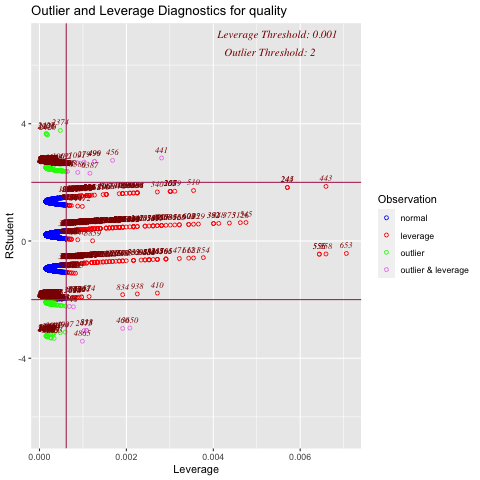

In [78]:
%%R
library(olsrr)
mreg_fixed.mod= lm(quality ~ fixed_acidity ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg_fixed.mod)

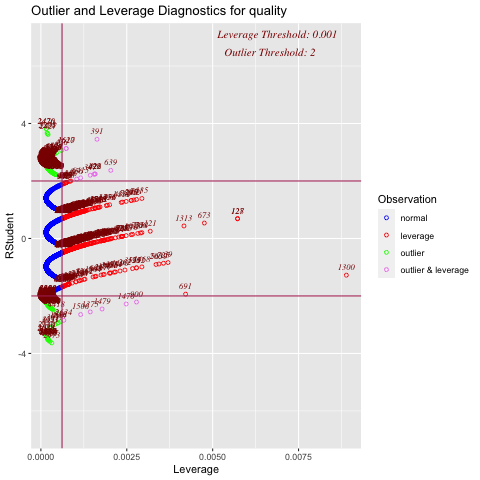

In [79]:
%%R
mreg.mod= lm(quality ~ volatile_acidity ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)


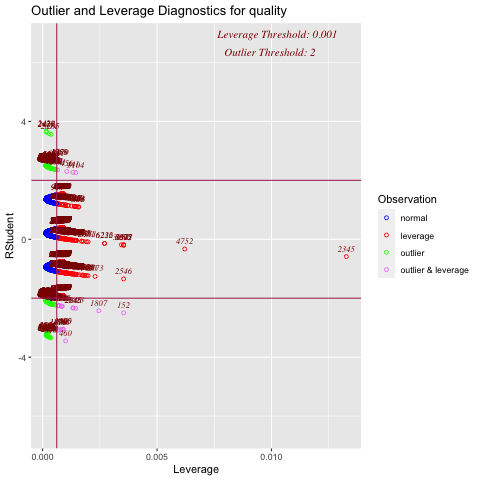

In [80]:
%%R
mreg.mod= lm(quality ~ citric_acid ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)

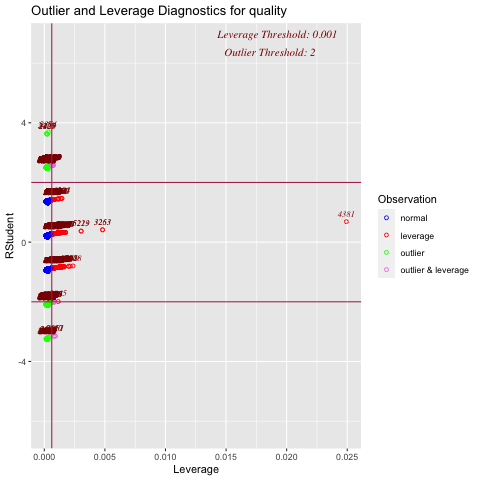

In [81]:
%%R
mreg.mod= lm(quality ~ residual_sugar ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)

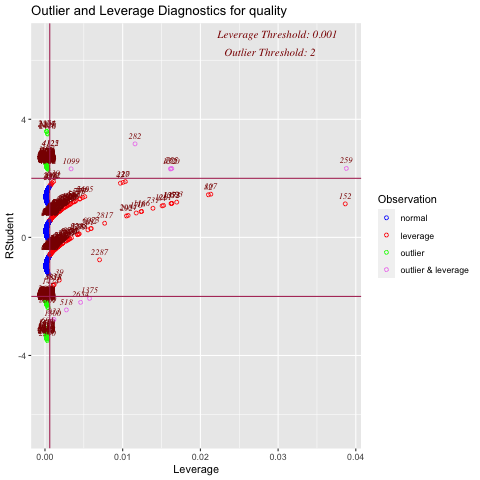

In [82]:
%%R
mreg.mod= lm(quality ~ chlorides ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)


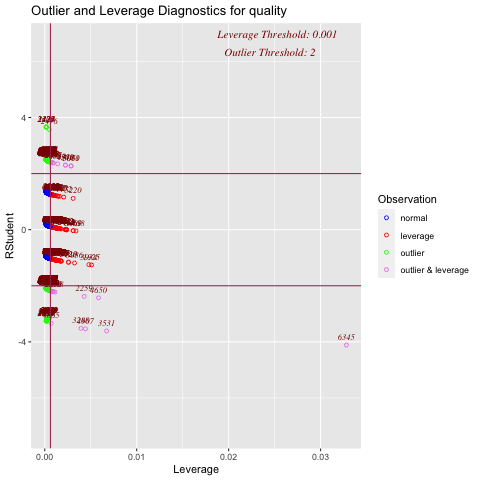

In [83]:
%%R
mreg.mod= lm(quality ~ free_sulfur_dioxide ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)


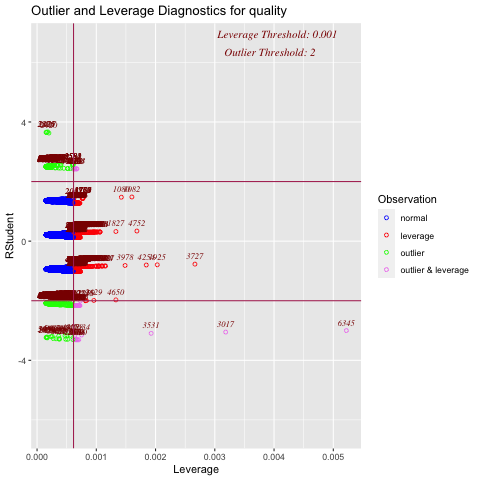

In [84]:
%%R
mreg.mod= lm(quality ~ total_sulfur_dioxide ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)

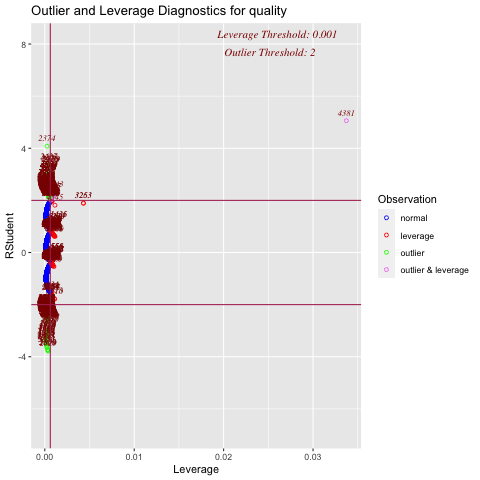

In [85]:
%%R
mreg.mod= lm(quality ~ density ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)

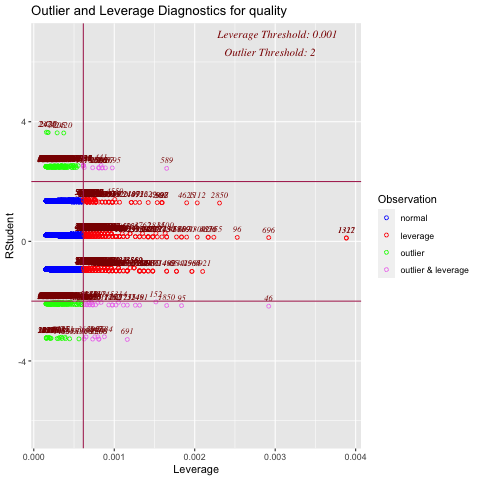

In [86]:
%%R
mreg.mod= lm(quality ~ pH ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)

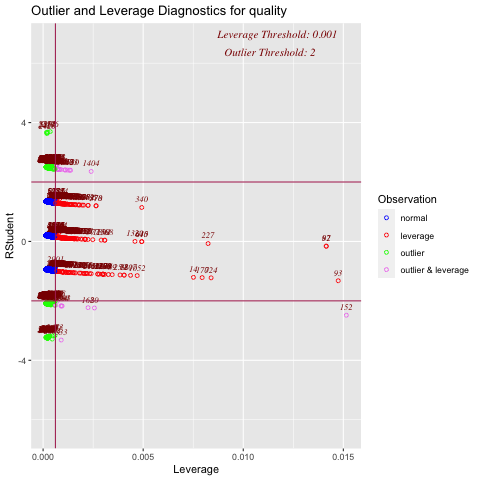

In [87]:
%%R
mreg.mod= lm(quality ~ sulphates ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)

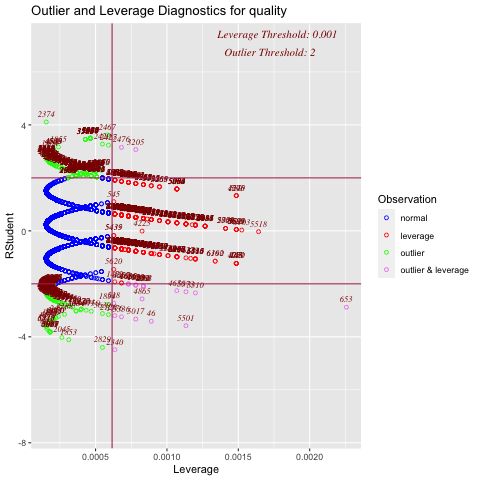

In [88]:
%%R
mreg.mod= lm(quality ~ alcohol ,data = df_wine_quality)
outlier_threshold <- 3
leverage_threshold <- 0.2
ols_plot_resid_lev(mreg.mod)

We can see that in most cases, almost all predictors have many outliers and levers, and even some predictors have a small number of data that appear to be within the normal range to the naked eye (this may be due to their outlier values being too large, compressing the size of normal values). The reason for this situation is likely that people are not as sensitive to the quality of alcohol. For example, some wines with significantly different pH values are actually perceived by different people as having the same rating level. To ensure that these extremely extreme outliers do not interfere with our calculations, I will drop them off in the subsequent models; But before that, let's take another look at the image made with box plot

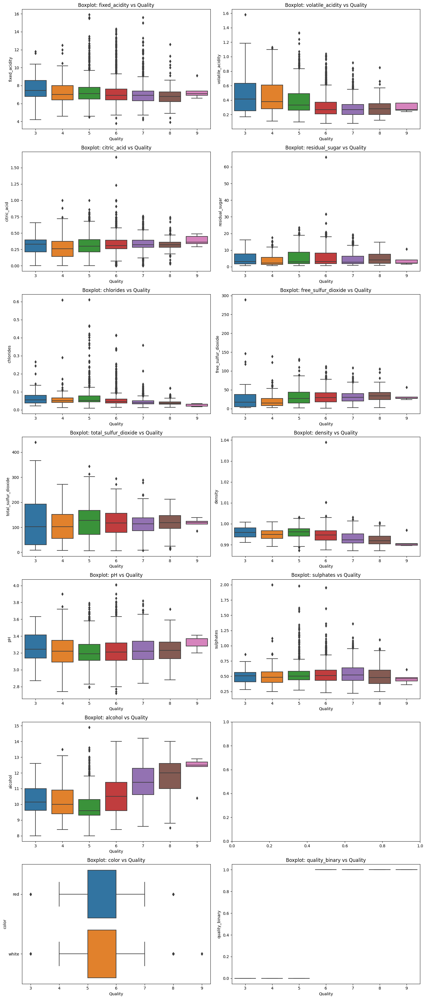

In [89]:
# Set the number of columns
cols = 2
rows = 7

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))  # Adjust the height accordingly
axes = axes.flatten()  # Flatten the axes array for easy access

# Loop through each column and create boxplots
for idx, column in enumerate(df_wine_quality.columns):
    if column != 'quality':  # Exclude 'quality' as it's the response variable
        sns.boxplot(x='quality', y=column, data=df_wine_quality, ax=axes[idx])
        axes[idx].set_title(f"Boxplot: {column} vs Quality")
        axes[idx].set_xlabel('Quality')
        axes[idx].set_ylabel(column)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the entire plot
plt.show()

We can see that in almost all variables, as long as they are at a quality level of 5-7, they will have a particularly high number of outliers compared to other levels, and the values of some outliers will be exaggerated. For example, in the quality grade 6 of residual sugar, the median is 3 and one outlier is 67; This seems to indicate a problem with data quality and also points out that the relationship between variables and quality is not a simple linear relationship. Especially in the quality range of 5 to 7, there may be complex interactions or other factors that affect these variance distributions. At the same time, this also to some extent proves my hypothesis that people may not be sensitive to the differences in trace elements in alcohol, so most of the scores will be distributed in a middle range of 5-7, and there are actually very few people who can truly taste the differences and give extreme scores.

#### Now we clean the data with the result from R and above.

In [90]:
df_wine_quality_cleaned = df[(df['fixed_acidity'] <= 14) &
    (df['volatile_acidity'] <= 1.3) &
    (df['citric_acid'] <= 1.2) &
    (df['residual_sugar'] <= 40) &
    (df['chlorides'] <= 0.4) &
    (df['free_sulfur_dioxide'] <= 150) &
    (df['total_sulfur_dioxide'] <= 350) &
    (df['density'] <= 1.03) &
    (df['sulphates'] <= 1.75)]

### *1*.(F) If you have any NAs, impute them using any of the methods discussed in class but make sure to justify your choice.

In [91]:
df_wine_quality_cleaned.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
color                   0
quality_binary          0
dtype: int64

#### As we claimed earilier, our data has no NAs which means we do not need any adjustment for NAs.

### *1*.(G) Provide a descriptive analysis conditioning on your categorical variable(s) similar to the analysis done in class with the Prestige data set.

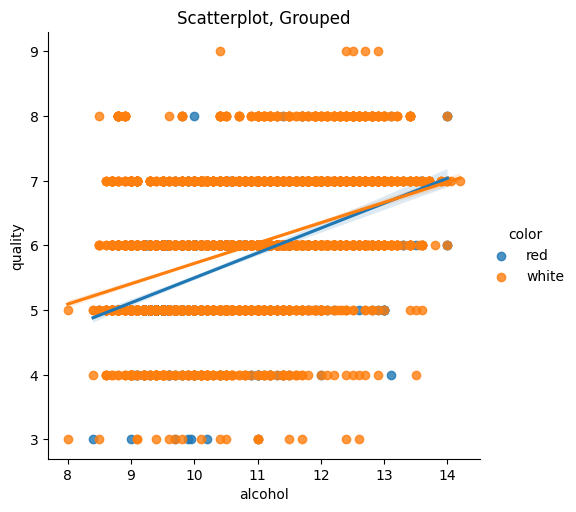

In [92]:
#scatter plots by type
sns.lmplot(df_wine_quality_cleaned, x='alcohol', y='quality', hue='color')
plt.title('Scatterplot, Grouped')
plt.show()

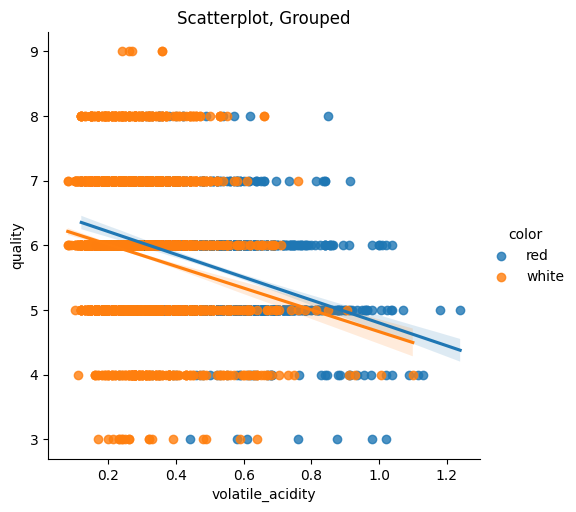

In [93]:
sns.lmplot(df_wine_quality_cleaned, x='volatile_acidity', y='quality', hue='color')
plt.title('Scatterplot, Grouped')
plt.show()

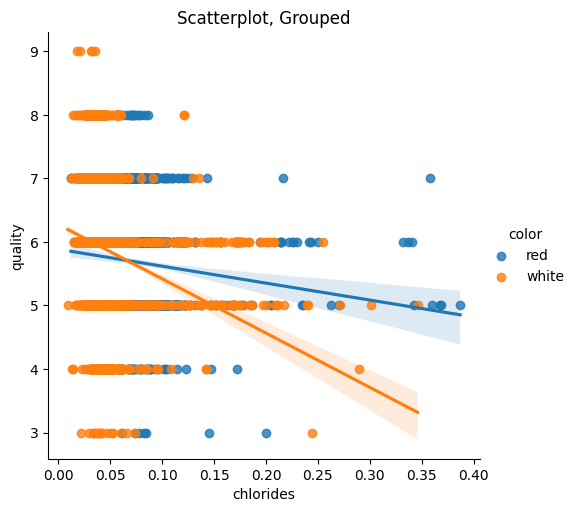

In [94]:
sns.lmplot(df_wine_quality_cleaned, x='chlorides', y='quality', hue='color')
plt.title('Scatterplot, Grouped')
plt.show()

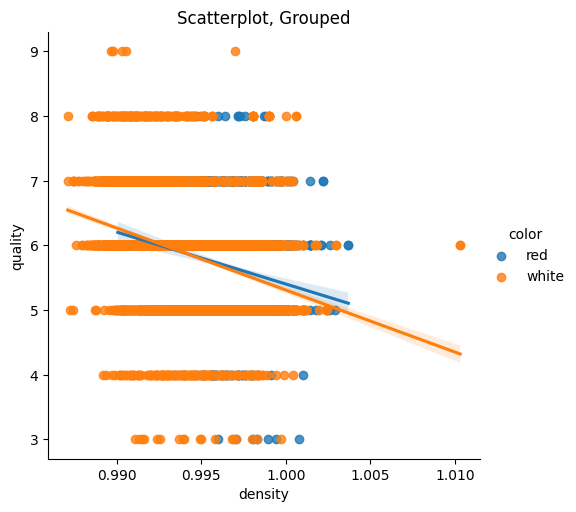

In [95]:
sns.lmplot(df_wine_quality_cleaned, x='density', y='quality', hue='color')
plt.title('Scatterplot, Grouped')
plt.show()

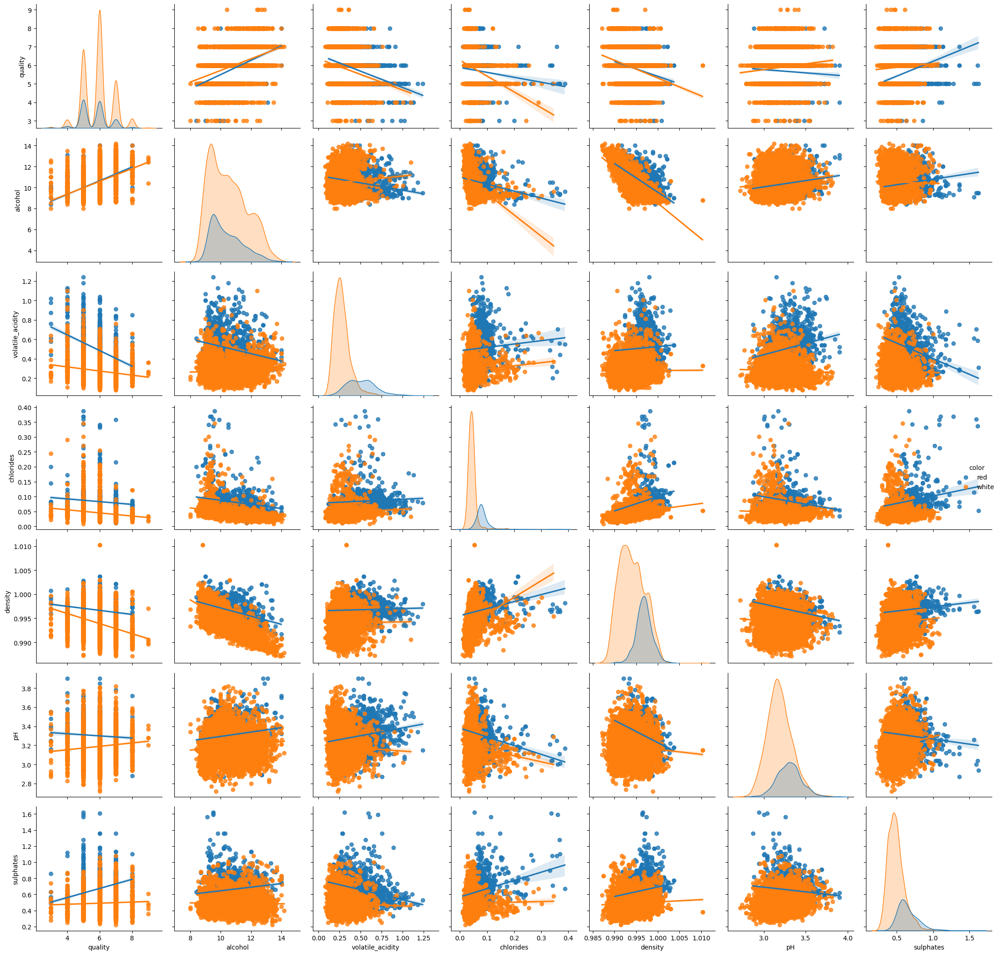

In [96]:
#Scatter plot matrix
sns.pairplot(df_wine_quality_cleaned[['quality', 'alcohol', 'volatile_acidity', 'chlorides', 'density','pH','sulphates','color']], hue='color', kind='reg', height=3)
plt.tight_layout()

## 2 Variable Selection:

#### Noted that our data *does not need any form of transformation* of data

#### So we do not need to compare the different variable selection between untransformed and transformed data. Because of that, we will use the original data to help us select variables from the data set.

### *2*.(A) Using the Boruta Algorithm identify the top 3 quantitative predictors

Here we tried three methods of Boruta Algorithm, and as the result, we will use the R version as it is prefered. We will see if the three methods agree with each other.

  0%|          | 0/100 [00:00<?, ?it/s]

11 attributes confirmed important: ['total_sulfur_dioxide', 'citric_acid', 'fixed_acidity', 'chlorides', 'pH', 'sulphates', 'alcohol', 'free_sulfur_dioxide', 'residual_sugar', 'density', 'volatile_acidity']
0 attributes confirmed unimportant: []
0 tentative attributes remains: []


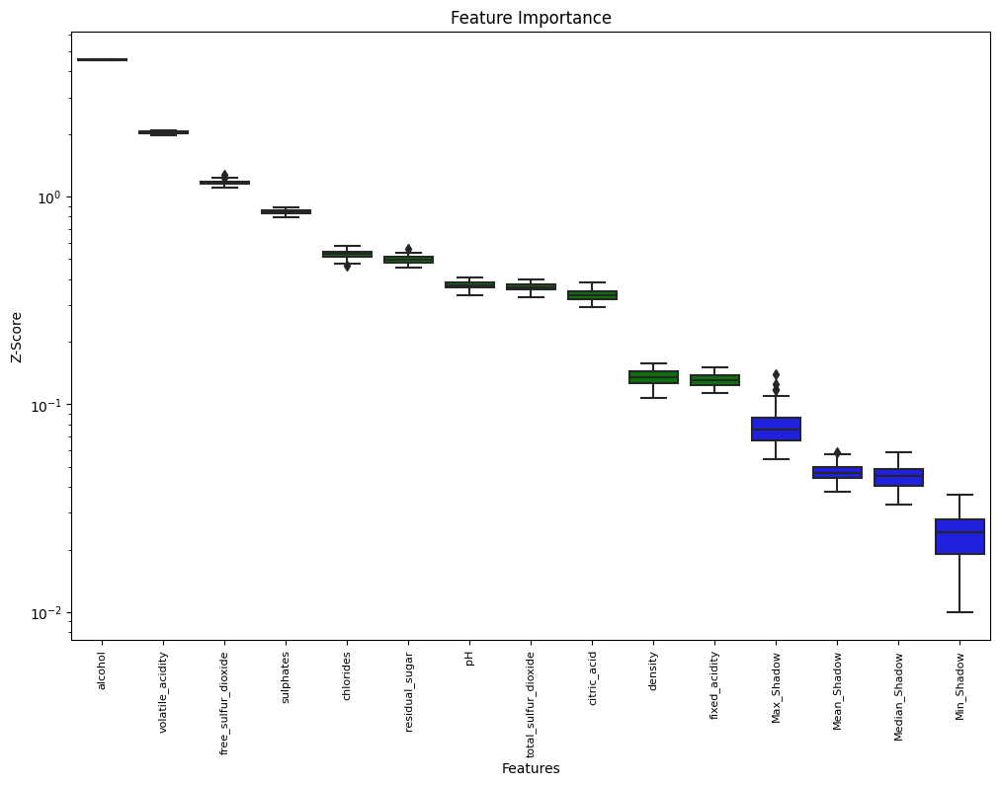

Feature: fixed_acidity        Rank: 2 (0.016),  Keep: Confirmed
Feature: volatile_acidity     Rank: 7 (0.148),  Keep: Confirmed
Feature: citric_acid          Rank: 1 (0.031),  Keep: Confirmed
Feature: residual_sugar       Rank: 11 (0.042),  Keep: Confirmed
Feature: chlorides            Rank: 10 (0.044),  Keep: Confirmed
Feature: free_sulfur_dioxide  Rank: 3 (0.090),  Keep: Confirmed
Feature: total_sulfur_dioxide Rank: 6 (0.031),  Keep: Confirmed
Feature: density              Rank: 9 (0.016),  Keep: Confirmed
Feature: pH                   Rank: 8 (0.032),  Keep: Confirmed
Feature: sulphates            Rank: 5 (0.065),  Keep: Confirmed
Feature: alcohol              Rank: 4 (0.332),  Keep: Confirmed


In [197]:
### Boruta using `BorutaShap`
## Note: takes about 10 minutes

df_num_Y = df_num['quality'].values
df_num_X2 = df_num.drop('quality', axis=1)

# Run Boruta algorithm
Feature_Selector = BorutaShap(importance_measure='shap', classification=False)
Feature_Selector.fit(X=df_num_X2, y=df_num_Y, n_trials=100, random_state=90095)

# Plot results
Feature_Selector.plot(which_features='all')
plt.show()

# Print results
boruta_keep2 = ['Confirmed' if p in Feature_Selector.accepted else
                'Tentative' if p in Feature_Selector.tentative else
                'Reject' for p in Feature_Selector.all_columns]

boruta_features2 = zip(Feature_Selector.all_columns,
                       len(Feature_Selector.shap_values) - np.argsort(Feature_Selector.shap_values),
                       Feature_Selector.shap_values,
                       boruta_keep2)
for feat in boruta_features2:
    print('Feature: {:<20} Rank: {} ({:.3f}),  Keep: {}'.format(feat[0], feat[1], feat[2], feat[3]))

#### Using this method, we could determined the top-3 bourta regressor are citric_acid, fixed_acidity, free_sulfur_dioxide, and all other features are confirmed

In [97]:
# Prepare data
df_wine_quality_Y = df_num['quality'].values
df_wine_quality_X = df_num.values.astype(np.float32)

# To fix dependency issues with BorutaPy
np.int = np.int32
np.float = np.float64
np.bool = np.bool_

# If you want to speed up computation time, consider parallel computing (n_jobs=-1)
rf = RandomForestRegressor(max_depth=5)
boruta = BorutaPy(rf, n_estimators='auto', verbose=2, random_state=9, two_step=True) # `two_step` uses Bonferroni

# Run algorithm, X and y must by numpy arrays
boruta.fit(df_wine_quality_X, df_wine_quality_Y)

df_wine_quality_X = pd.DataFrame(df_wine_quality_X, columns=df_num.columns)

if len(boruta.support_) == df_wine_quality_X.shape[1]:

    selected_features = df_wine_quality_X.columns[boruta.support_]
    print(f"Selected features: {selected_features}")
else:
    print("The length of boruta.support_ does not match the number of features.")


Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	9 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	10 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	11 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	12 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	13 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	14 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	15 / 100
Confirmed: 	1
Tentative: 	9
Rejected: 	2
Iteration: 	16 / 100
Confirmed: 	4
Tentative: 	6
Rejected: 	2
Iteration:

In [98]:
# Compile feature decisions
boruta_keep = ['Confirmed' if c else
               'Tentative' if t else
               'Reject' for c,t in zip(boruta.support_, boruta.support_weak_)]

# Combine results and print
boruta_features = zip(df_num.drop('quality', axis=1).columns, boruta.ranking_, boruta_keep)
for feat in boruta_features:
    print('Feature: {:<20} Rank: {},  Keep: {}'.format(feat[0], feat[1], feat[2]))

# These results seem to be a bit more strict than Boruta in R

Feature: fixed_acidity        Rank: 2,  Keep: Reject
Feature: volatile_acidity     Rank: 1,  Keep: Confirmed
Feature: citric_acid          Rank: 1,  Keep: Confirmed
Feature: residual_sugar       Rank: 3,  Keep: Reject
Feature: chlorides            Rank: 1,  Keep: Confirmed
Feature: free_sulfur_dioxide  Rank: 3,  Keep: Reject
Feature: total_sulfur_dioxide Rank: 1,  Keep: Confirmed
Feature: density              Rank: 1,  Keep: Confirmed
Feature: pH                   Rank: 1,  Keep: Confirmed
Feature: sulphates            Rank: 1,  Keep: Confirmed
Feature: alcohol              Rank: 1,  Keep: Confirmed


#### For this Python package method, we could only confirm we can keep volatile_acidity, citric_acid, chlorides, total_sulfur_dioxide, density, pH, sulphates, alcohol, and other variables are rejected.

#### Now, we use the most important R to compute Boruta to determine the final predictors, we will try both the original data from df_wine_quality and cleaned data from df_wine_quality_cleaned to show robustness.

In [99]:
df_wine_quality

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,quality_binary
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white,1


In [100]:
df_wine_quality=df_wine_quality.drop("quality_binary",axis=1)

In [101]:
ro.globalenv['original_wine_quality']=df_wine_quality

                      meanImp medianImp   minImp   maxImp normHits  decision
fixed_acidity        33.38157  33.51771 32.17684 34.88115        1 Confirmed
volatile_acidity     57.27133  57.30475 54.68651 61.60964        1 Confirmed
citric_acid          39.24201  39.34870 37.60118 41.04730        1 Confirmed
residual_sugar       40.06451  40.37622 36.05866 44.24011        1 Confirmed
chlorides            37.09482  37.20731 35.36814 38.51986        1 Confirmed
free_sulfur_dioxide  51.68639  51.76790 48.76052 54.46219        1 Confirmed
total_sulfur_dioxide 38.64880  38.91492 35.78809 41.11776        1 Confirmed
density              36.53181  36.56664 34.13124 39.47426        1 Confirmed
pH                   38.21305  37.13204 36.44428 41.25132        1 Confirmed
sulphates            44.52286  44.56841 42.22740 46.33574        1 Confirmed
alcohol              64.33488  64.24043 60.74140 65.98842        1 Confirmed
color                13.74845  13.88610 12.52421 14.50641        1 Confirmed

 1. run of importance source...
 2. run of importance source...
 3. run of importance source...
 4. run of importance source...
 5. run of importance source...
 6. run of importance source...
 7. run of importance source...
 8. run of importance source...
 9. run of importance source...
 10. run of importance source...
 11. run of importance source...
After 11 iterations, +22 secs: 
 confirmed 12 attributes: alcohol, chlorides, citric_acid, color, density and 7 more;
 no more attributes left.

In addition: Warning message:
In data("original_wine_quality") :
  data set ‘original_wine_quality’ not found


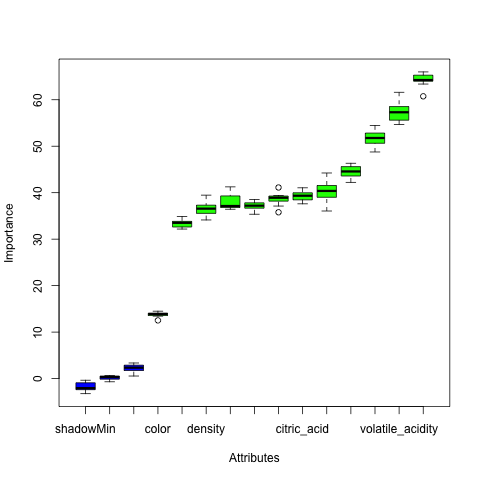

In [102]:
%%R
library(Boruta)
data("original_wine_quality")
# This is the preferred version

set.seed(90095)
wine_quality_small <- original_wine_quality
wine_quality_boruta <- Boruta(quality ~ ., data = wine_quality_small, doTrace = 2)

plot(wine_quality_boruta, sort = TRUE)
attStats(wine_quality_boruta)

In [103]:
ro.globalenv['wine_quality']=df_wine_quality_cleaned

                       meanImp  medianImp    minImp    maxImp normHits
fixed_acidity         24.43795  24.911623  20.88102  26.45114        1
volatile_acidity      28.89597  28.588628  27.16671  30.95527        1
citric_acid           23.84670  23.918102  22.60332  25.20430        1
residual_sugar        31.84173  31.481932  28.21061  34.55833        1
chlorides             26.71564  26.300442  24.71373  28.86644        1
free_sulfur_dioxide   30.06326  30.166227  27.27109  32.39111        1
total_sulfur_dioxide  25.43072  25.591549  23.89115  26.82240        1
density               25.85385  25.576803  23.44127  27.86144        1
pH                    29.21594  28.989013  27.96805  31.32539        1
sulphates             25.77955  25.700192  24.56640  27.18745        1
alcohol               36.14176  35.887005  34.11961  38.27285        1
color                 10.01898   9.893649   9.40245  10.92343        1
quality_binary       184.39451 184.919685 177.93256 191.75865        1
      

 1. run of importance source...
 2. run of importance source...
 3. run of importance source...
 4. run of importance source...
 5. run of importance source...
 6. run of importance source...
 7. run of importance source...
 8. run of importance source...
 9. run of importance source...
 10. run of importance source...
 11. run of importance source...
After 11 iterations, +27 secs: 
 confirmed 13 attributes: alcohol, chlorides, citric_acid, color, density and 8 more;
 no more attributes left.

In addition: Warning message:
In data("wine_quality") : data set ‘wine_quality’ not found


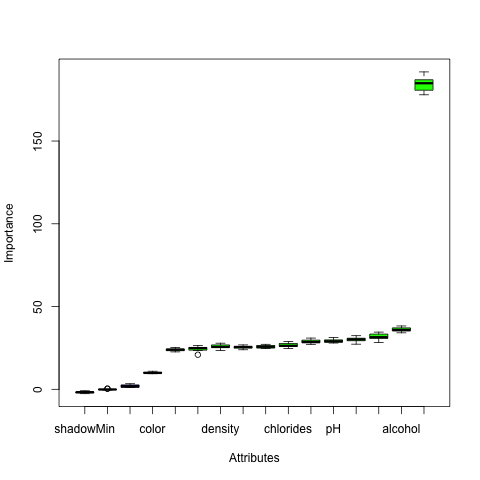

In [104]:
%%R
library(Boruta)
data("wine_quality")
# This is the preferred version

set.seed(90095)
wine_quality_small <- wine_quality
wine_quality_boruta <- Boruta(quality ~ ., data = wine_quality_small, doTrace = 2)

plot(wine_quality_boruta, sort = TRUE)
attStats(wine_quality_boruta)

#### We can see that the original and cleaned result agrees with each other, so it is robusted. Using this method, we could compare the mean and median of the result, and we determined the top-3 bourta regressor are alcohol, volatile_acidity, free_sulfur_dioxide.

### Cross Evaluation:

#### For alcohol, three of the bourta method all agree with that this is an important variable and we should keep it. Using the R result, which is the most important, we believe alcohol is the most important one here.

#### For volatile_acidity, the second python method agrees as the first one does not; For the free_sulfur_dioxide, the first python method agrees as the second one does not. According to R version is more accurate, we believe we will accept that volatile_acidity and free_sulfur_dioxide to be our second and third choices.

#### As a result we choose alcohol, volatile_acidity and free_sulfur_dioxide for our bourta results

### *2*.(B) Using Mallows Cp identify the top 2 qualitative predictor

For the Mallow CP, for more proper selection, we believe we will combine the first python code result and the R code result of Boruta for the predictors we put into our model.

Which means, we will put citric_acid, fixed_acidity, free_sulfur_dioxide, alcohol, volatile_acidity in it.

Features: 1023/1023

Best subset: ['volatile_acidity', 'residual_sugar', 'total_sulfur_dioxide', 'sulphates', 'alcohol']


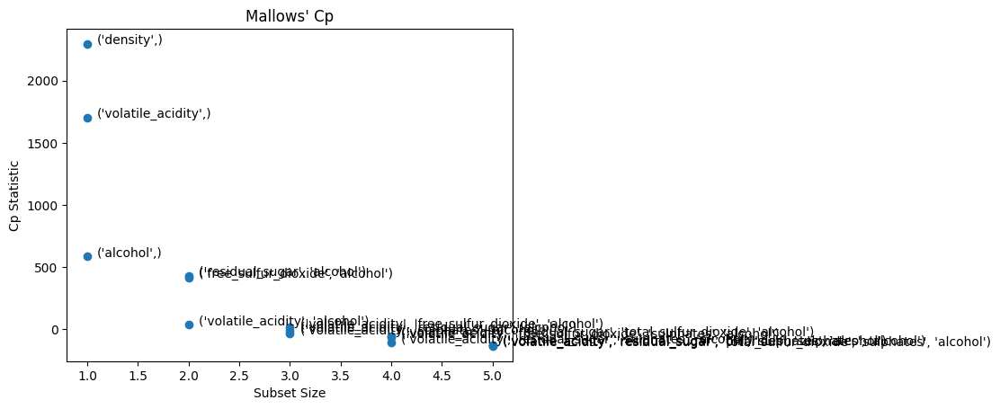

subsets  \
subsets                                                               
5       (volatile_acidity, residual_sugar, total_sulfur...        5   
        (volatile_acidity, residual_sugar, pH, sulphate...        5   
        (volatile_acidity, residual_sugar, chlorides, s...        5   
4       (volatile_acidity, residual_sugar, sulphates, a...        4   
        (volatile_acidity, free_sulfur_dioxide, sulphat...        4   
        (volatile_acidity, residual_sugar, total_sulfur...        4   
3       (volatile_acidity, sulphates, alcohol)                    3   
        (volatile_acidity, residual_sugar, alcohol)               3   
        (volatile_acidity, free_sulfur_dioxide, alcohol)          3   
2       (volatile_acidity, alcohol)                               2   
        (free_sulfur_dioxide, alcohol)                            2   
        (residual_sugar, alcohol)                                 2   
1       (alcohol,)                                                1   
        (volatile_acidity,)                                       1   
        (density,)                                                1   

                                                                     Cp  
subsets                                                                  
5       (volatile_acidity, residual_sugar, total_sulfur...  -136.258590  
        (volatile_acidity, residual_sugar, pH, sulphate...  -128.006188  
        (volatile_acidity, residual_sugar, chlorides, s...  -127.454757  
4       (volatile_acidity, residual_sugar, sulphates, a...  -109.683277  
        (volatile_acidity, free_sulfur_dioxide, sulphat...   -67.240554  
        (volatile_acidity, residual_sugar, total_sulfur...   -57.341309  
3       (volatile_acidity, sulphates, alcohol)               -39.040909  
        (volatile_acidity, residual_sugar, alcohol)          -16.843625  
        (volatile_acidity, free_sulfur_dioxide, alcohol)      13.459730  
2       (volatile_acidity, alcohol)                           33.923335  
        (free_sulfur_dioxide, alcohol)                       416.212048  
        (residual_sugar, alcohol)                            430.256575  
1       (alcohol,)                                           583.338344  
        (volatile_acidity,)                                 1701.045367  
        (density,)                                          2295.630618

In [105]:

# First get some estimates from the full regression
df_full = smf.ols('quality ~ citric_acid+fixed_acidity+free_sulfur_dioxide+alcohol+volatile_acidity', data=df_num).fit()
df_full_sig2 = df_full.mse_resid # residual MSE = sigma^2 hat
df_n, _ = df_num.shape

# Negative Mallows' cp, so we want largest
def negative_mallows(estimator, X, y):
    y_pred = estimator.predict(X)
    sse = np.sum((y - y_pred) ** 2)
    p = estimator.n_features_in_ + 1 # number features doesn't include bias term
    cp = sse / df_full_sig2 + 2*p - df_n
    return -cp

# Set up regression
df_Y = df_num['quality'].values
df_X = df_num.drop('quality', axis=1)
lr = LinearRegression(fit_intercept=True)

# Using `ExhaustiveFeatureSelector` from `mlxtend`
df_efs = EFS(lr,
              min_features=1,
              max_features=5,
              scoring=negative_mallows,
              cv=None)

# Run regressions
df_efs.fit(df_X, df_Y)
print('Best subset:', [df_efs.feature_names[i] for i in df_efs.best_idx_])

# Extract Mallows' Cp data
df_efs_features = [df_efs.subsets_[p]['feature_names'] for p in df_efs.subsets_]
df_efs_subset = [len(df_efs.subsets_[p]['feature_idx']) for p in df_efs.subsets_]
df_efs_cp = [ -df_efs.subsets_[p]['avg_score'] for p in df_efs.subsets_]
df_mallows = pd.DataFrame({'subsets':df_efs_subset, 'Cp':df_efs_cp}, index=df_efs_features)

# Top 3 best, by subset
df_mallows_best = df_mallows.groupby('subsets')[['subsets','Cp']].apply(lambda x: x.nsmallest(3, 'Cp'))
df_mallows_best

# Plotting best subsets
plt.scatter(df_mallows_best['subsets'], df_mallows_best['Cp'])
plt.title("Mallows' Cp")
plt.xlabel('Subset Size')
plt.ylabel('Cp Statistic')
for i,sub in enumerate(df_mallows_best['subsets']):
    subset = df_mallows_best.index[i][1]
    plt.annotate(subset, (sub + 0.1, df_mallows_best.iloc[i]['Cp'] + 0.3)) # to plot labels
plt.show()

# And the associated sorted data frame
df_mallows_best.sort_values('Cp')



#### Using python, from the Mallow's CP plot, we can see that:
Among models with a single predcitor, alcohol and volatile_acidity is the two best quantitative predictors with the lowest CP value; Among models with two predictors, the best quantitative predictor combination is volatile_acidity, alcohol.

#### R code which is prefered, using original data

Loading required package: carData
In addition: Warning message:
package ‘leaps’ was built under R version 4.3.3 


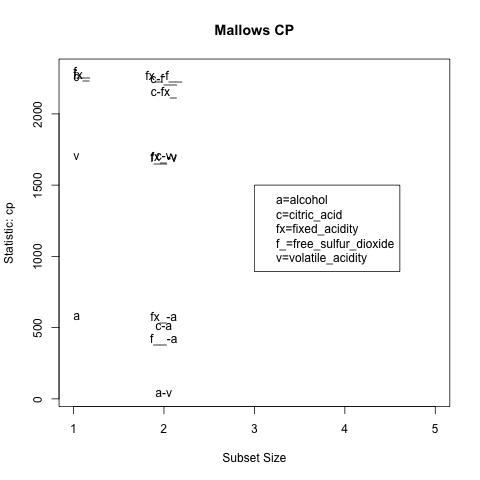

In [106]:
%%R
library(leaps)
library(car)

best_subset <- regsubsets(quality ~ citric_acid+fixed_acidity+free_sulfur_dioxide+alcohol+volatile_acidity,
                          data = original_wine_quality, nbest = 10,nvmax=2, method = "exhaustive")

subsets(best_subset, statistic = "cp", legend = F, main = "Mallows CP")
legend(3, 1500 ,bty = "y", legend = c('a=alcohol', 'c=citric_acid','fx=fixed_acidity', 'f_=free_sulfur_dioxide', 'v=volatile_acidity'),
       col = "steelblue4", cex = 1)

# a-v is the best model


#### R code which is prefered, using cleaned data

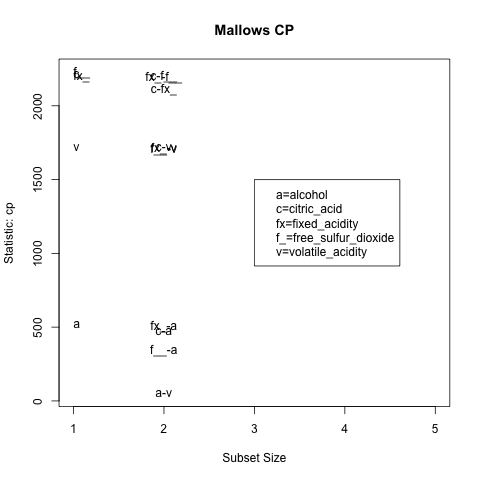

In [107]:
%%R
library(leaps)
library(car)

best_subset <- regsubsets(quality ~ citric_acid+fixed_acidity+free_sulfur_dioxide+alcohol+volatile_acidity,
                          data = wine_quality, nbest = 10,nvmax=2, method = "exhaustive")

subsets(best_subset, statistic = "cp", legend = F, main = "Mallows CP")
legend(3, 1500 ,bty = "y", legend = c('a=alcohol', 'c=citric_acid','fx=fixed_acidity', 'f_=free_sulfur_dioxide', 'v=volatile_acidity'),
       col = "steelblue4", cex = 1)

# a-v is the best model

#### Using R, which is prefered, from the Mallow's CP plot, we can see that:

There is no difference between the cleaned and original data results which shows the robusted of our results.

Among models with a single predcitor, alcohol and volatile_acidity is the two best quantitative predictors with the lowest CP value;
Among models with two predictors, the best quantitative predictor combination is alcohol and volatile_acidity.

## 3 Model Building:

#### Based on part 2, in order to consider more about the regressor, we select the result of Boruta to determine our regressors here for our OLS. We determined citric_acid, fixed_acidity, free_sulfur_dioxide, alcohol, volatile_acidity as our regressor seperately. We deem color as a conditioning variable.

### *3*.(A) Evaluate transformations of variables

According to the previous findings, we can not using any ways of transformation to linearize the relationship between predictors and quality. Thus, we do not need to evaluate transformations of variables at this point.

### *3*.(B) Run the OLS models. Look at Cook’s distance Plot, Residuals Plot

### *3*.(B) quality ~ alcohol

In [108]:
# run OLS regression  quality~alcohol
model_alcohol = smf.ols('quality ~ alcohol',data=df_wine_quality_cleaned).fit()
model_alcohol.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.203
Model:                            OLS   Adj. R-squared:                  0.203
Method:                 Least Squares   F-statistic:                     1607.
Date:                Fri, 25 Oct 2024   Prob (F-statistic):          3.47e-313
Time:                        00:51:05   Log-Likelihood:                -7371.5
No. Observations:                6316   AIC:                         1.475e+04
Df Residuals:                    6314   BIC:                         1.476e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.3773      0.087     27.412      0.000       2.207       2.547
alcohol        0.3292      0.008     40.082      0.000       0.313       0.345
==============================================================================
Omnibus:                      117.087   Durbin-Watson:                   1.632
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              235.168
Skew:                           0.064   Prob(JB):                     8.59e-52
Kurtosis:                       3.937   Cond. No.                         94.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [109]:
# Get RMSE
predictions = model_alcohol.predict(df_wine_quality_cleaned)
RMSE = np.sqrt(((df_wine_quality_cleaned['quality']-predictions)**2).mean())
print(RMSE)

0.7773821133900632


<function matplotlib.pyplot.show(close=None, block=None)>

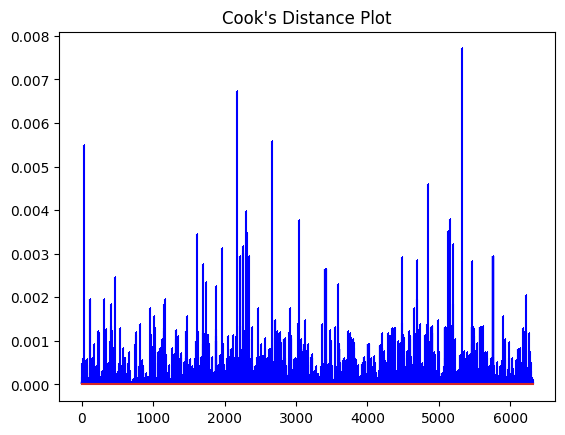

In [110]:
# Cook's distance Plot
from statsmodels.stats.outliers_influence import OLSInfluence
influence = OLSInfluence(model_alcohol)
cooks_d = influence.cooks_distance[0]
plt.stem(np.arange(len(cooks_d)), cooks_d, linefmt = 'b-', markerfmt = ',')
plt.title("Cook's Distance Plot")
plt.show
# Threshold: Cook's Distance>1(rule of thumb)  points influential on fitted model
# More conservative threshold: >4/n  in our case n = 6497

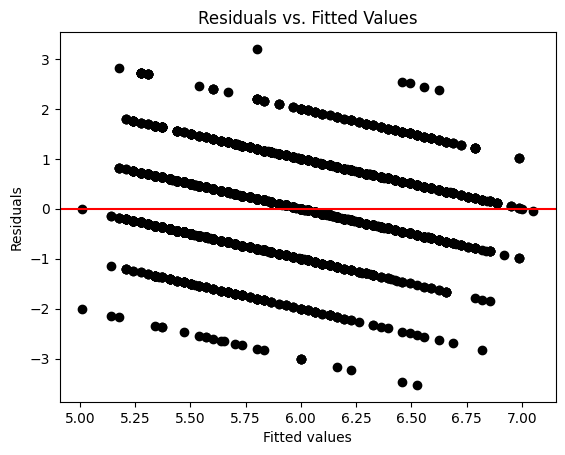

In [111]:
# Residuals vs. Fitted Values
plt.scatter(x=model_alcohol.fittedvalues, y=model_alcohol.resid, color='black')
plt.axhline(y=0.0, color='r')
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

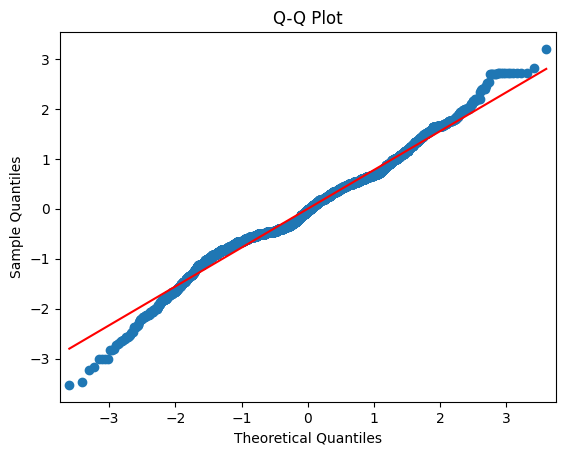

In [112]:
# Q-Q Plot
sm.qqplot(model_alcohol.resid,line='s')
plt.title('Q-Q Plot')
plt.show()

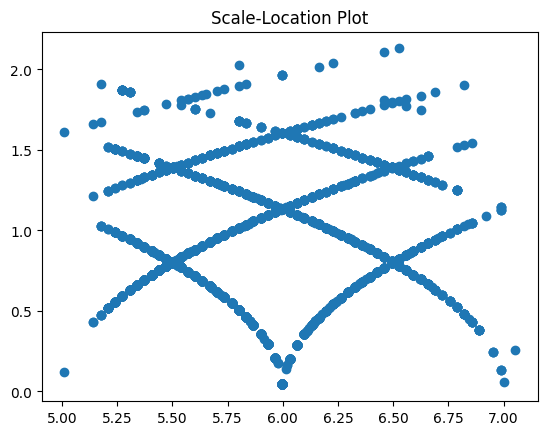

In [113]:
model_alcohol_std_resid = model_alcohol.get_influence().resid_studentized_internal # standardized residuals
model_alcohol_lev = model_alcohol.get_influence().hat_matrix_diag # leverage values
#Scale-Location Plot
plt.scatter(x=model_alcohol.fittedvalues, y=np.sqrt(np.abs(model_alcohol_std_resid)))   # y = sqrt( |std. resid| )
plt.title('Scale-Location Plot')
plt.show()

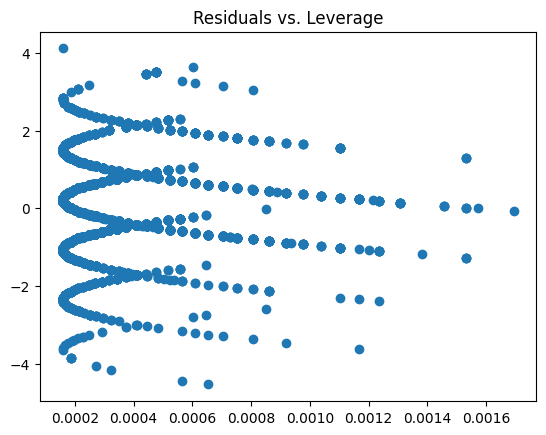

In [114]:
#Residuals vs. Leverage
plt.scatter(x=model_alcohol_lev, y=model_alcohol_std_resid)
plt.title('Residuals vs. Leverage')
plt.show()

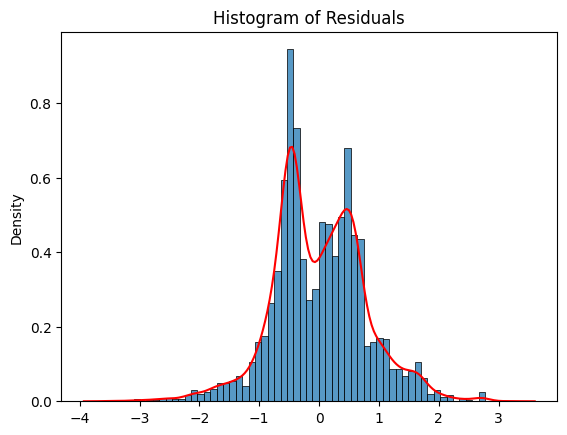

SignificanceResult(statistic=235.16771844384814, pvalue=8.589715484757363e-52)

In [115]:
# Histogram of Residuals
sns.histplot(model_alcohol.resid, stat='density')
sns.kdeplot(model_alcohol.resid, color='r')
plt.title('Histogram of Residuals')
plt.show()
#JB test
stats.jarque_bera(model_alcohol.resid)

### *3*.(B) quality ~ volatile_acidity

In [116]:
# run OLS regression  quality~volatile_acidity
model_volatile_acidity = smf.ols('quality ~ volatile_acidity',data=df_wine_quality_cleaned).fit()
model_volatile_acidity.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     424.5
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           2.42e-91
Time:                        00:51:08   Log-Likelihood:                -7881.9
No. Observations:                6316   AIC:                         1.577e+04
Df Residuals:                    6314   BIC:                         1.578e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            6.2968      0.025    252.254      0.000       6.248       6.346
volatile_acidity    -1.4062      0.068    -20.604      0.000      -1.540      -1.272
==============================================================================
Omnibus:                       87.140   Durbin-Watson:                   1.651
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               96.696
Skew:                           0.249   Prob(JB):                     1.01e-21
Kurtosis:                       3.344   Cond. No.                         7.16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [117]:
# Get RMSE
predictions = model_volatile_acidity.predict(df_wine_quality_cleaned)
RMSE = np.sqrt(((df_wine_quality_cleaned['quality']-predictions)**2).mean())
print(RMSE)

0.8428103120700242


<function matplotlib.pyplot.show(close=None, block=None)>

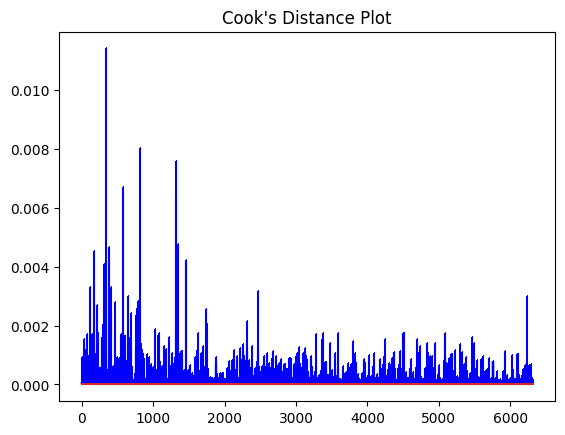

In [118]:
# Cook's distance Plot
from statsmodels.stats.outliers_influence import OLSInfluence
influence = OLSInfluence(model_volatile_acidity)
cooks_d = influence.cooks_distance[0]
plt.stem(np.arange(len(cooks_d)), cooks_d, linefmt = 'b-', markerfmt = ',')
plt.title("Cook's Distance Plot")
plt.show
# Threshold: Cook's Distance>1(rule of thumb)  points influential on fitted model
# More conservative threshold: >4/n  in our case n = 6464

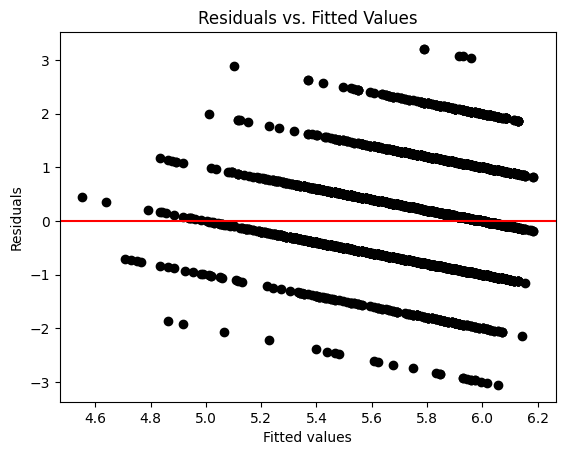

In [119]:
# Residuals vs. Fitted Values
plt.scatter(x=model_volatile_acidity.fittedvalues, y=model_volatile_acidity.resid, color='black')
plt.axhline(y=0.0, color='r')
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

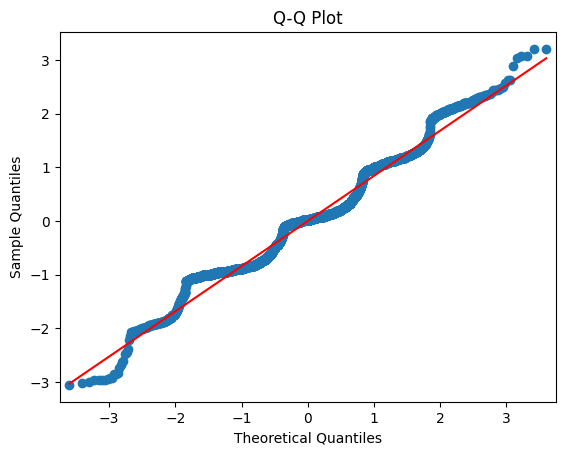

In [120]:
# Q-Q Plot
sm.qqplot(model_volatile_acidity.resid,line='s')
plt.title('Q-Q Plot')
plt.show()

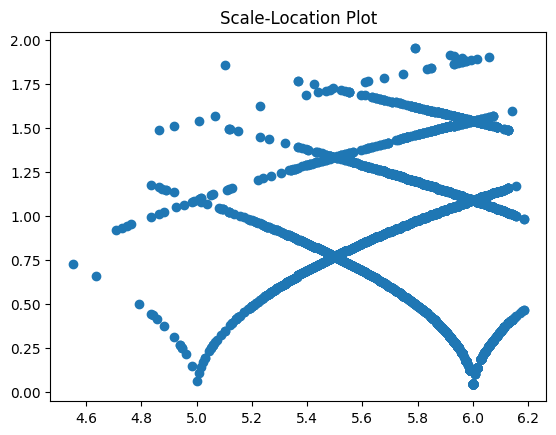

In [121]:
model_volatile_acidity_std_resid = model_volatile_acidity.get_influence().resid_studentized_internal # standardized residuals
model_volatile_acidity_lev = model_volatile_acidity.get_influence().hat_matrix_diag # leverage values
#Scale-Location Plot
plt.scatter(x=model_volatile_acidity.fittedvalues, y=np.sqrt(np.abs(model_volatile_acidity_std_resid)))   # y = sqrt( |std. resid| )
plt.title('Scale-Location Plot')
plt.show()

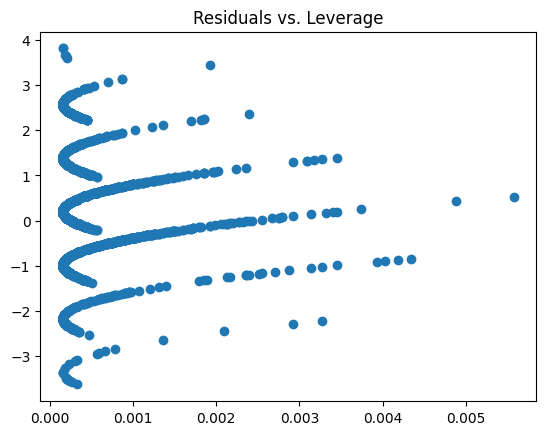

In [122]:
#Residuals vs. Leverage
plt.scatter(x=model_volatile_acidity_lev, y=model_volatile_acidity_std_resid)
plt.title('Residuals vs. Leverage')
plt.show()

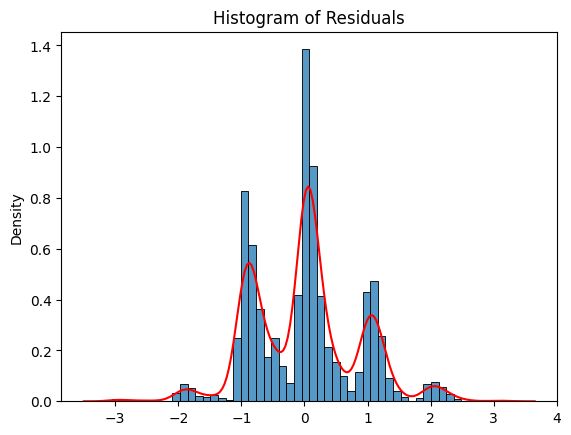

SignificanceResult(statistic=96.69562865107763, pvalue=1.0064936200567051e-21)

In [123]:
# Histogram of Residuals
sns.histplot(model_volatile_acidity.resid, stat='density')
sns.kdeplot(model_volatile_acidity.resid, color='r')
plt.title('Histogram of Residuals')
plt.show()
#JB test
stats.jarque_bera(model_volatile_acidity.resid)

### *3*.(B) quality ~ fixed_acidity

In [124]:
# run OLS regression  quality ~ fixed_acidity
model_citric_fixed_acidity = smf.ols('quality ~ fixed_acidity',data=df_wine_quality_cleaned).fit()
model_citric_fixed_acidity.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     41.82
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           1.08e-10
Time:                        00:51:10   Log-Likelihood:                -8066.5
No. Observations:                6316   AIC:                         1.614e+04
Df Residuals:                    6314   BIC:                         1.615e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         6.2329      0.063     98.821      0.000       6.109       6.357
fixed_acidity    -0.0557      0.009     -6.467      0.000      -0.073      -0.039
==============================================================================
Omnibus:                       52.660   Durbin-Watson:                   1.646
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               54.614
Skew:                           0.209   Prob(JB):                     1.38e-12
Kurtosis:                       3.182   Cond. No.                         43.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Notice R-squared is only 0.6%. Goodness-of-fit is too low for the model to be effective.

### *3*.(B) quality ~ free_sulfur_dioxide

In [125]:
# run OLS regression  quality ~ free_sulfur_dioxide
model_free_sulfur_dioxide = smf.ols('quality ~ free_sulfur_dioxide',data=df_wine_quality_cleaned).fit()
model_free_sulfur_dioxide.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     18.39
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           1.82e-05
Time:                        00:51:10   Log-Likelihood:                -8078.2
No. Observations:                6316   AIC:                         1.616e+04
Df Residuals:                    6314   BIC:                         1.617e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               5.7482      0.022    258.405      0.000       5.705       5.792
free_sulfur_dioxide     0.0027      0.001      4.289      0.000       0.001       0.004
==============================================================================
Omnibus:                       54.991   Durbin-Watson:                   1.650
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.025
Skew:                           0.214   Prob(JB):                     4.14e-13
Kurtosis:                       3.181   Cond. No.                         72.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Notice R-squared is only 0.4%. Goodness-of-fit is too low for the model to be effective.

### *3*.(B) quality ~ citric_acid

In [126]:
# run OLS regression  quality ~ citric_acid
model_citric_acid = smf.ols('quality ~ citric_acid',data=df_wine_quality_cleaned).fit()
model_citric_acid.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     29.12
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           7.05e-08
Time:                        00:51:11   Log-Likelihood:                -8072.9
No. Observations:                6316   AIC:                         1.615e+04
Df Residuals:                    6314   BIC:                         1.616e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       5.6902      0.028    200.879      0.000       5.635       5.746
citric_acid     0.4340      0.080      5.396      0.000       0.276       0.592
==============================================================================
Omnibus:                       54.999   Durbin-Watson:                   1.646
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.405
Skew:                           0.211   Prob(JB):                     3.43e-13
Kurtosis:                       3.201   Cond. No.                         8.15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Notice R-squared is only 0.8%. Goodness-of-fit is too low for the model to be effective.

#### Choice of linear models with one predictor

There is no big problem with the Cook's Distance Plots, as we can see all cook distances are below o.1, passing the rule of thumb. In particular, for the best model of alcohol as predictor, we see all the cook's distances below 0.008 lower than 4/n, indicating no influential point on the fitted model. But there is big problem in all residual plots with residuals showing strong linear pattern. Such problem arises when we use OLS model on data with discrete target variable, like the quality in our case taking only the integers from 0-10. 
<br>As for the choice of models, the OLS model including alcohol as predictor gives largest R-squared of 20% and a smallest RMSE of 0.78. The coefficients of intercept and alcohol are significant. So among linear models with one predictor we would say the best preditor to include is alcohol.

### *3*.(B) Including one factor variable(ANOVA)

In [127]:
# setting white wine to be the reference group
df_wine_quality_cleaned['type']=df_wine_quality['color'].map({'white':0, 'red':1})

In [128]:
model_alcohol_f = smf.ols('quality ~ type',data = df_wine_quality_cleaned).fit()
model_alcohol_f.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     73.37
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           1.33e-17
Time:                        00:51:13   Log-Likelihood:                -8050.9
No. Observations:                6316   AIC:                         1.611e+04
Df Residuals:                    6314   BIC:                         1.612e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.8820      0.012    474.246      0.000       5.858       5.906
type          -0.2223      0.026     -8.566      0.000      -0.273      -0.171
==============================================================================
Omnibus:                       47.839   Durbin-Watson:                   1.659
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               50.267
Skew:                           0.191   Prob(JB):                     1.22e-11
Kurtosis:                       3.214   Cond. No.                         2.53
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

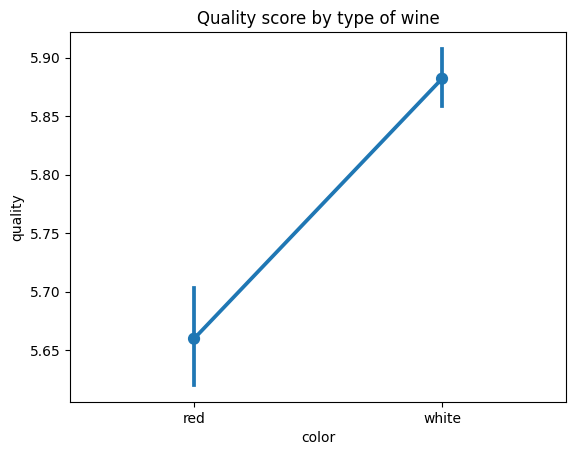

In [129]:
sns.pointplot(data =df_wine_quality_cleaned, x = 'color', y = 'quality')
plt.title('Quality score by type of wine')
plt.show()

The ANOVA model gives a negative statistically significant coefficient on the factor variable, indicating that the mean quality of red wine significantly lower than that of white wine. The result is consistent with the group effect plot.

### *3*.(B) Including slope interaction variable

In [130]:
# run the regression
model_alcohol_c = smf.ols('quality ~ alcohol + alcohol:type',data=df_wine_quality_cleaned).fit()
model_alcohol_c.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.210
Method:                 Least Squares   F-statistic:                     842.7
Date:                Fri, 25 Oct 2024   Prob (F-statistic):               0.00
Time:                        00:51:15   Log-Likelihood:                -7340.1
No. Observations:                6316   AIC:                         1.469e+04
Df Residuals:                    6313   BIC:                         1.471e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        2.4080      0.086     27.874      0.000       2.239       2.577
alcohol          0.3303      0.008     40.402      0.000       0.314       0.346
alcohol:type    -0.0175      0.002     -7.937      0.000      -0.022      -0.013
==============================================================================
Omnibus:                      116.565   Durbin-Watson:                   1.649
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              238.720
Skew:                           0.039   Prob(JB):                     1.45e-52
Kurtosis:                       3.949   Cond. No.                         97.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [131]:
# Get RMSE
predictions = model_alcohol_c.predict(df_wine_quality_cleaned)
RMSE = np.sqrt(((df_wine_quality_cleaned['quality']-predictions)**2).mean())
print(RMSE)

0.7735320733056252


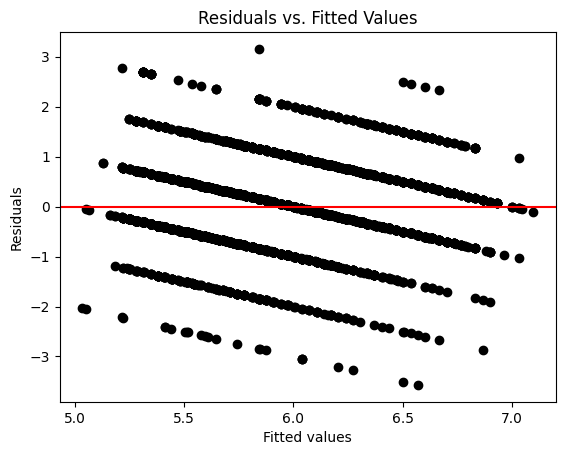

In [132]:
# Residuals vs. Fitted Values
plt.scatter(x=model_alcohol_c.fittedvalues, y=model_alcohol_c.resid, color='black')
plt.axhline(y=0.0, color='r')
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

By introducing the interaction term we see how alcohol by volume of red wine and white wine have different effects on quality. With 0 for white wine and 1 for red wine, the coefficient of alcohol tells the expected effect of rise in ABV of white wine on the quality of white wine, and the sum of coefficients of alcohol and interaction term shows the relationship in red wine. The coefficient of interaction term can be interpreted as the difference of effect of ABV rise on quality between red and white wine. The negative interaction term coefficient is just saying that a rise in ABV of white wine is expected to contribute more to quality compared to red wine.

### *3*.(B) Including factor variable(ANCOVA)

In [133]:
# run the regression
model_alcohol_c2 = smf.ols('quality ~ alcohol + type',data=df_wine_quality_cleaned).fit()
model_alcohol_c2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.211
Method:                 Least Squares   F-statistic:                     846.6
Date:                Fri, 25 Oct 2024   Prob (F-statistic):               0.00
Time:                        00:51:16   Log-Likelihood:                -7337.0
No. Observations:                6316   AIC:                         1.468e+04
Df Residuals:                    6313   BIC:                         1.470e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.4439      0.087     28.211      0.000       2.274       2.614
alcohol        0.3271      0.008     40.016      0.000       0.311       0.343
type          -0.1930      0.023     -8.324      0.000      -0.238      -0.148
==============================================================================
Omnibus:                      116.258   Durbin-Watson:                   1.650
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              238.325
Skew:                           0.036   Prob(JB):                     1.77e-52
Kurtosis:                       3.949   Cond. No.                         94.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [134]:
# Get RMSE
predictions = model_alcohol_c2.predict(df_wine_quality_cleaned)
RMSE = np.sqrt(((df_wine_quality_cleaned['quality']-predictions)**2).mean())
print(RMSE)

0.7731506384725438


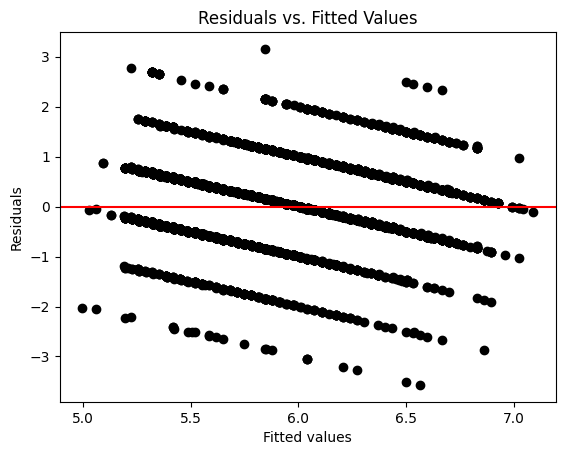

In [135]:
# Residuals vs. Fitted Values
plt.scatter(x=model_alcohol_c2.fittedvalues, y=model_alcohol_c.resid, color='black')
plt.axhline(y=0.0, color='r')
plt.title('Residuals vs. Fitted Values')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

The ANCOVA model takes a further step ahead from ANOVA, saying that conditioning on ABV, white wine has higher quality than red wine. 

### *3*.(C) Evaluate the robustness of your coefficient estimates by bootstrapping your model. Pro- vide a histogram of the bootstrapped estimates (including R2), and comment on the findings. In particular how do these estimates compare against your LS estimates?

### *3*.(C).Alcohol

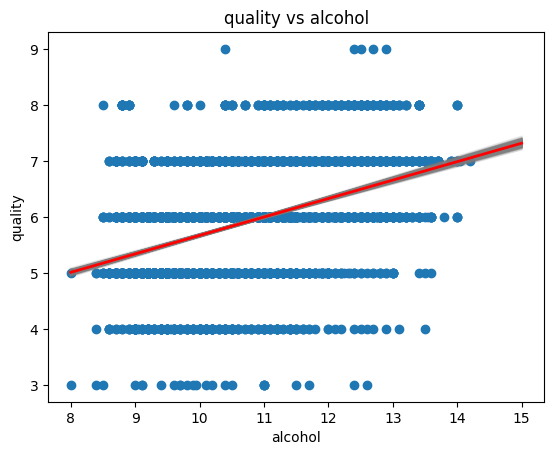

In [136]:
random.seed(90095)
n_boot = 500 # number of bootstraps

# initializations
boot_rmse = []
boot_b1 = []
boot_b2 = []
boot_sig2hat = [] # sigma^2 hat estimates (or std error ^2)
boot_r2 = [] # R^2 (no need to adjust)

df_wine_quality_cleaned_span_x = pd.DataFrame({'alcohol':np.linspace(8, 15, 200)}) # x spanning 3.5 through 34 for graphing

for iter in range(n_boot):
   # Sampling with replacement
   df_wine_quality_cleaned_sample = df_wine_quality_cleaned.sample(n=df_wine_quality_cleaned.shape[0], replace=True) # `sample` method for pandas DataFrame
   df_wine_quality_cleaned_sample_ols = smf.ols('quality ~ alcohol', data=df_wine_quality_cleaned_sample).fit() # fit model

   # Append coefficients
   boot_b1.append(df_wine_quality_cleaned_sample_ols.params[0])          # intercept
   boot_b2.append(df_wine_quality_cleaned_sample_ols.params[1])          # slope
   # Performance measures
   boot_sig2hat.append(df_wine_quality_cleaned_sample_ols.scale)         # scale = estimated sigma^2
   boot_rmse.append(np.sqrt(np.mean(df_wine_quality_cleaned_sample_ols.resid ** 2))) # RMSE
   boot_r2.append(df_wine_quality_cleaned_sample_ols.rsquared)           # R^2

   # Plot a greyed out line for this iteration
   df_wine_quality_cleaned_sample_yhat = df_wine_quality_cleaned_sample_ols.predict(df_wine_quality_cleaned_span_x)
   plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_sample_yhat, color='grey', alpha=0.1)

# Fit averaged model
df_wine_quality_cleaned_ols_span_y = np.mean(boot_b1) + df_wine_quality_cleaned_span_x * np.mean(boot_b2)

# Plotting the fitted lines
plt.scatter(df_wine_quality_cleaned['alcohol'], df_wine_quality_cleaned['quality'])
plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_ols_span_y, color='r', linewidth=2)
plt.xlabel('alcohol')
plt.ylabel('quality')
plt.title('quality vs alcohol')
plt.show()

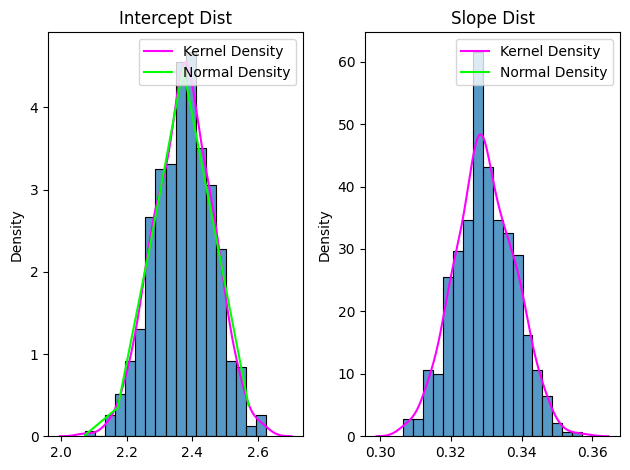

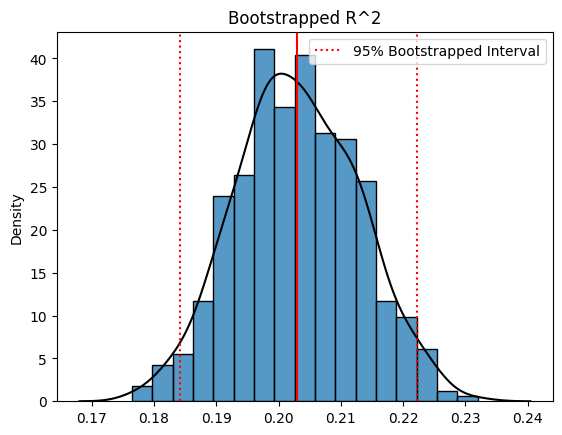

--- sigma hat ---
estimate:		0.77793
std error:		0.008147
median:			0.77816
2.5 percentile:		0.76192
97.5 percentile:	0.79383


In [137]:
# Next the distributions of the estimates

# For plotting normal PDFs
b1_range = np.arange(np.min(boot_b1), np.max(boot_b1), 0.1)
b2_range = np.arange(np.min(boot_b2), np.max(boot_b2), 0.1)

# Plotting beta estimates
fig6, ax6 = plt.subplots(1, 2)
sns.histplot(boot_b1, stat='density', kde=False, ax=ax6[0])
sns.kdeplot(boot_b1, color='fuchsia', ax=ax6[0], label='Kernel Density')
sns.lineplot(x=b1_range, y=norm.pdf(b1_range, np.mean(boot_b1), np.std(boot_b1)), color='lime',ax=ax6[0], label='Normal Density')
ax6[0].set_title('Intercept Dist')
sns.histplot(boot_b2, stat='density', kde=False, ax=ax6[1])
sns.kdeplot(boot_b2, color='fuchsia', ax=ax6[1], label='Kernel Density')
sns.lineplot(x=b2_range, y=norm.pdf(b2_range, np.mean(boot_b2), np.std(boot_b2)), color='lime',ax=ax6[1], label='Normal Density')
ax6[1].set_title('Slope Dist')
plt.tight_layout()
plt.show()

# Bootstrap for distribution of R^2 (coefficient of determination)
sns.histplot(boot_r2, stat='density', kde=False)
sns.kdeplot(boot_r2, color='black')
plt.axvline(x=np.quantile(boot_r2, q=0.025), color='red', linestyle=':', label='95% Bootstrapped Interval')
plt.axvline(x=np.quantile(boot_r2, q=0.5), color='red')
plt.axvline(x=np.quantile(boot_r2, q=0.975), color='red', linestyle=':')#画了两边的数据
plt.title('Bootstrapped R^2')
plt.legend()
plt.show()

# Bootstrap for estimated residual standard deviation
boot_stdhat = np.sqrt(boot_sig2hat)
print('--- sigma hat ---\n' +
      f'estimate:\t\t{boot_stdhat.mean():.5}\n' +
      f'std error:\t\t{boot_stdhat.std():.5}\n' +
      f'median:\t\t\t{np.quantile(boot_stdhat, q=0.5):.5}\n' +
      f'2.5 percentile:\t\t{np.quantile(boot_stdhat, q=0.025):.5}\n' +
      f'97.5 percentile:\t{np.quantile(boot_stdhat, q=0.975):.5}'
      )


In [138]:
# run OLS regression  quality~alcohol
model_alcohol = smf.ols('quality ~ alcohol',data=df_wine_quality_cleaned).fit()
model_alcohol.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.203
Model:                            OLS   Adj. R-squared:                  0.203
Method:                 Least Squares   F-statistic:                     1607.
Date:                Fri, 25 Oct 2024   Prob (F-statistic):          3.47e-313
Time:                        00:51:24   Log-Likelihood:                -7371.5
No. Observations:                6316   AIC:                         1.475e+04
Df Residuals:                    6314   BIC:                         1.476e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.3773      0.087     27.412      0.000       2.207       2.547
alcohol        0.3292      0.008     40.082      0.000       0.313       0.345
==============================================================================
Omnibus:                      117.087   Durbin-Watson:                   1.632
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              235.168
Skew:                           0.064   Prob(JB):                     8.59e-52
Kurtosis:                       3.937   Cond. No.                         94.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Comment: (Compared to OLS estimates)

Although our predict value is strictly as integer, and it is distributed very werid in scatter plot. We can see that, the bootstrap plot for quality-alcohol is fairly stable, which means our data and model is robusted.

Besides, we can see that the bootstrapped intercept and R^2 is fairly normal distributed  around the their value in OLS which is a good attribute.However,the bootstrapped alcohol coefficient is distributed around is OLS estimated value, but it is not normally distributed. We still think alcohol is the best regressor.

#### With the special of our data, we find that our residual and other features are strongly affected by the fact that predict value can just be integer between 1-10. Even with bootstrap, it did not change much. We tried to use jitter to solve it.

#### However, when we try it, we find that when the jitter is 0.3, it did not change much. However, when the jitter climbs to 1, it is much better. But it is too noisy for our data, so our group decided not to use jitter further.

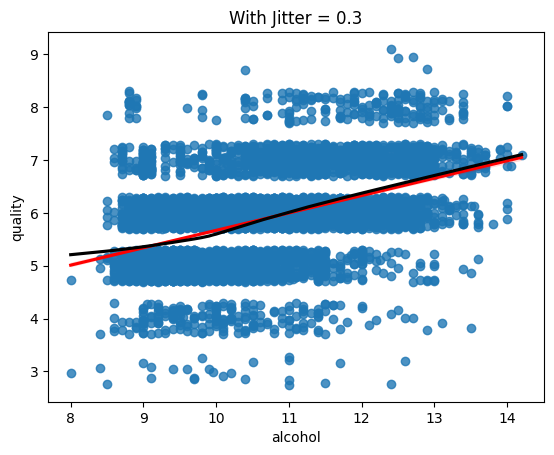

In [139]:
# With jitter = 0.3
# Lowess in black, regression line in red
sns.regplot(df_wine_quality_cleaned, x='alcohol', y='quality', x_jitter=0, y_jitter=0.3, fit_reg=False, seed=10)
sns.regplot(df_wine_quality_cleaned, x='alcohol', y='quality', fit_reg=True, scatter=False, color='red')
sns.regplot(df_wine_quality_cleaned, x='alcohol', y='quality', lowess=True, scatter=False, color='black')
plt.title('With Jitter = 0.3')
plt.show()

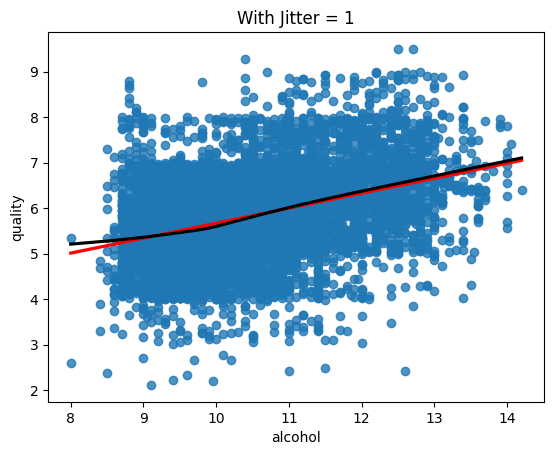

In [140]:
# With jitter = 1
# Lowess in black, regression line in red
sns.regplot(df_wine_quality_cleaned, x='alcohol', y='quality', x_jitter=0, y_jitter=1, fit_reg=False, seed=10)
sns.regplot(df_wine_quality_cleaned, x='alcohol', y='quality', fit_reg=True, scatter=False, color='red')
sns.regplot(df_wine_quality_cleaned, x='alcohol', y='quality', lowess=True, scatter=False, color='black')
plt.title('With Jitter = 1')
plt.show()


### *3*.(C).volatile_acidity

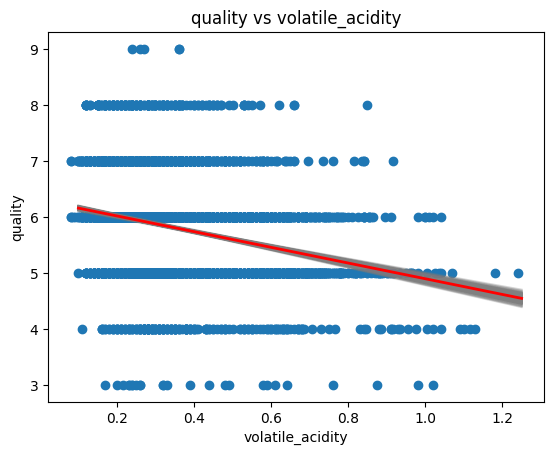

In [141]:
# initializations
boot_rmse = []
boot_b1 = []
boot_b2 = []
boot_sig2hat = [] # sigma^2 hat estimates (or std error ^2)
boot_r2 = [] # R^2 (no need to adjust)

df_wine_quality_cleaned_span_x = pd.DataFrame({'volatile_acidity':np.linspace(0.1, 1.25, 200)}) # x spanning 3.5 through 34 for graphing

for iter in range(n_boot):
   # Sampling with replacement
   df_wine_quality_cleaned_sample = df_wine_quality_cleaned.sample(n=df_wine_quality_cleaned.shape[0], replace=True) # `sample` method for pandas DataFrame
   df_wine_quality_cleaned_sample_ols = smf.ols('quality ~ volatile_acidity', data=df_wine_quality_cleaned_sample).fit() # fit model

   # Append coefficients
   boot_b1.append(df_wine_quality_cleaned_sample_ols.params[0])          # intercept
   boot_b2.append(df_wine_quality_cleaned_sample_ols.params[1])          # slope
   # Performance measures
   boot_sig2hat.append(df_wine_quality_cleaned_sample_ols.scale)         # scale = estimated sigma^2
   boot_rmse.append(np.sqrt(np.mean(df_wine_quality_cleaned_sample_ols.resid ** 2))) # RMSE
   boot_r2.append(df_wine_quality_cleaned_sample_ols.rsquared)           # R^2

   # Plot a greyed out line for this iteration
   df_wine_quality_cleaned_sample_yhat = df_wine_quality_cleaned_sample_ols.predict(df_wine_quality_cleaned_span_x)
   plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_sample_yhat, color='grey', alpha=0.1)

# Fit averaged model
df_wine_quality_cleaned_ols_span_y = np.mean(boot_b1) + df_wine_quality_cleaned_span_x * np.mean(boot_b2)

# Plotting the fitted lines
plt.scatter(df_wine_quality_cleaned['volatile_acidity'], df_wine_quality_cleaned['quality'])
plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_ols_span_y, color='r', linewidth=2)
plt.xlabel('volatile_acidity')
plt.ylabel('quality')
plt.title('quality vs volatile_acidity')
plt.show()

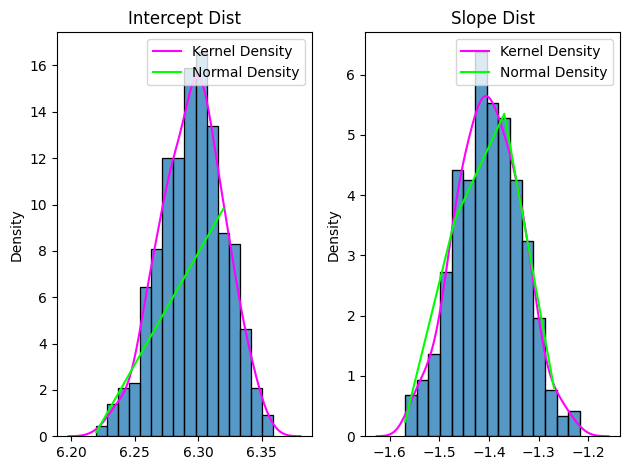

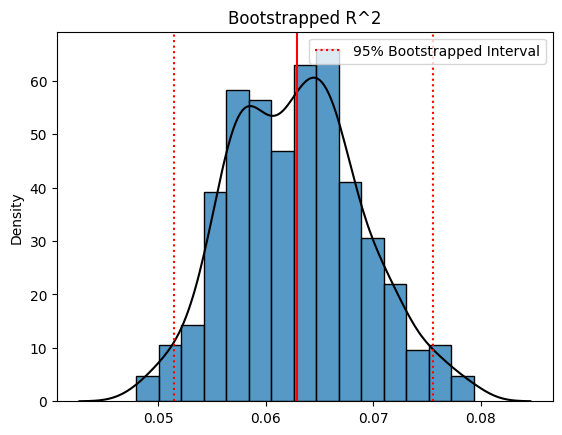

--- sigma hat ---
estimate:		0.84283
std error:		0.0079902
median:			0.8428
2.5 percentile:		0.82635
97.5 percentile:	0.85898


In [142]:
# Next the distributions of the estimates

# For plotting normal PDFs
b1_range = np.arange(np.min(boot_b1), np.max(boot_b1), 0.1)
b2_range = np.arange(np.min(boot_b2), np.max(boot_b2), 0.1)

# Plotting beta estimates
fig6, ax6 = plt.subplots(1, 2)
sns.histplot(boot_b1, stat='density', kde=False, ax=ax6[0])
sns.kdeplot(boot_b1, color='fuchsia', ax=ax6[0], label='Kernel Density')
sns.lineplot(x=b1_range, y=norm.pdf(b1_range, np.mean(boot_b1), np.std(boot_b1)), color='lime',ax=ax6[0], label='Normal Density')
ax6[0].set_title('Intercept Dist')
sns.histplot(boot_b2, stat='density', kde=False, ax=ax6[1])
sns.kdeplot(boot_b2, color='fuchsia', ax=ax6[1], label='Kernel Density')
sns.lineplot(x=b2_range, y=norm.pdf(b2_range, np.mean(boot_b2), np.std(boot_b2)), color='lime',ax=ax6[1], label='Normal Density')
ax6[1].set_title('Slope Dist')
plt.tight_layout()
plt.show()

# Bootstrap for distribution of R^2 (coefficient of determination)
sns.histplot(boot_r2, stat='density', kde=False)
sns.kdeplot(boot_r2, color='black')
plt.axvline(x=np.quantile(boot_r2, q=0.025), color='red', linestyle=':', label='95% Bootstrapped Interval')
plt.axvline(x=np.quantile(boot_r2, q=0.5), color='red')
plt.axvline(x=np.quantile(boot_r2, q=0.975), color='red', linestyle=':')#画了两边的数据
plt.title('Bootstrapped R^2')
plt.legend()
plt.show()

# Bootstrap for estimated residual standard deviation
boot_stdhat = np.sqrt(boot_sig2hat)
print('--- sigma hat ---\n' +
      f'estimate:\t\t{boot_stdhat.mean():.5}\n' +
      f'std error:\t\t{boot_stdhat.std():.5}\n' +
      f'median:\t\t\t{np.quantile(boot_stdhat, q=0.5):.5}\n' +
      f'2.5 percentile:\t\t{np.quantile(boot_stdhat, q=0.025):.5}\n' +
      f'97.5 percentile:\t{np.quantile(boot_stdhat, q=0.975):.5}'
      )

In [143]:
# run OLS regression  quality~volatile_acidity
model_chlorides = smf.ols('quality ~ volatile_acidity',data=df_wine_quality_cleaned).fit()
model_chlorides.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     424.5
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           2.42e-91
Time:                        00:51:29   Log-Likelihood:                -7881.9
No. Observations:                6316   AIC:                         1.577e+04
Df Residuals:                    6314   BIC:                         1.578e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            6.2968      0.025    252.254      0.000       6.248       6.346
volatile_acidity    -1.4062      0.068    -20.604      0.000      -1.540      -1.272
==============================================================================
Omnibus:                       87.140   Durbin-Watson:                   1.651
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               96.696
Skew:                           0.249   Prob(JB):                     1.01e-21
Kurtosis:                       3.344   Cond. No.                         7.16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Comment: (Compared to OLS estimates)

Although our predict value is strictly as integer, and it is distributed very werid in scatter plot. We can see that, the bootstrap plot for quality-chlorides is fairly stable, which means our data and model is robusted.

However, we are in lack of larger volatile_acidity, which resulted a shift for the right sides of bootstrpped regression. But it is fairly Ok.

Besides, we can see that the bootstrapped slope and R^2 is fairly normal distributed  around the their value in OLS which is a good attribute.However,the bootstrapped intercept is distributed around is OLS estimated value, but it is not normally distributed. And the intercept is not important in here.

### *3*.(C).fixed_acidity

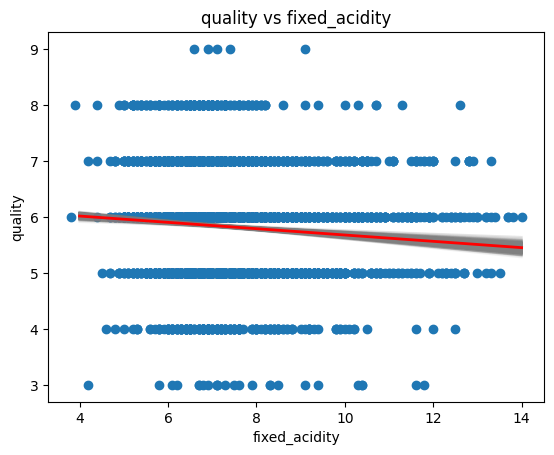

In [144]:
# initializations
boot_rmse = []
boot_b1 = []
boot_b2 = []
boot_sig2hat = [] # sigma^2 hat estimates (or std error ^2)
boot_r2 = [] # R^2 (no need to adjust)

df_wine_quality_cleaned_span_x = pd.DataFrame({'fixed_acidity':np.linspace(4, 14, 200)}) # x spanning 3.5 through 34 for graphing

for iter in range(n_boot):
   # Sampling with replacement
   df_wine_quality_cleaned_sample = df_wine_quality_cleaned.sample(n=df_wine_quality_cleaned.shape[0], replace=True) # `sample` method for pandas DataFrame
   df_wine_quality_cleaned_sample_ols = smf.ols('quality ~ fixed_acidity', data=df_wine_quality_cleaned_sample).fit() # fit model

   # Append coefficients
   boot_b1.append(df_wine_quality_cleaned_sample_ols.params[0])          # intercept
   boot_b2.append(df_wine_quality_cleaned_sample_ols.params[1])          # slope
   # Performance measures
   boot_sig2hat.append(df_wine_quality_cleaned_sample_ols.scale)         # scale = estimated sigma^2
   boot_rmse.append(np.sqrt(np.mean(df_wine_quality_cleaned_sample_ols.resid ** 2))) # RMSE
   boot_r2.append(df_wine_quality_cleaned_sample_ols.rsquared)           # R^2

   # Plot a greyed out line for this iteration
   df_wine_quality_cleaned_sample_yhat = df_wine_quality_cleaned_sample_ols.predict(df_wine_quality_cleaned_span_x)
   plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_sample_yhat, color='grey', alpha=0.1)

# Fit averaged model
df_wine_quality_cleaned_ols_span_y = np.mean(boot_b1) + df_wine_quality_cleaned_span_x * np.mean(boot_b2)

# Plotting the fitted lines
plt.scatter(df_wine_quality_cleaned['fixed_acidity'], df_wine_quality_cleaned['quality'])
plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_ols_span_y, color='r', linewidth=2)
plt.xlabel('fixed_acidity')
plt.ylabel('quality')
plt.title('quality vs fixed_acidity')
plt.show()

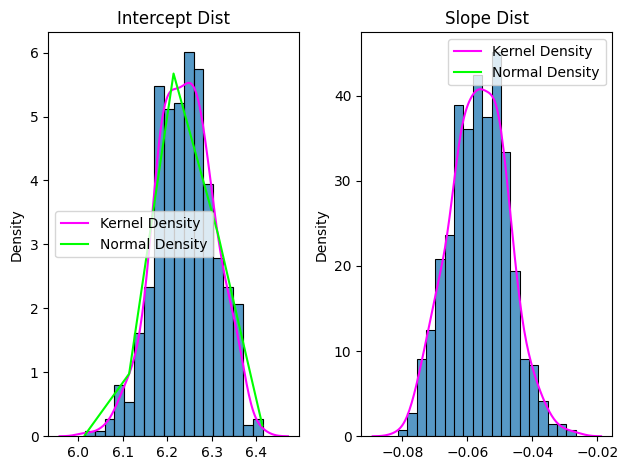

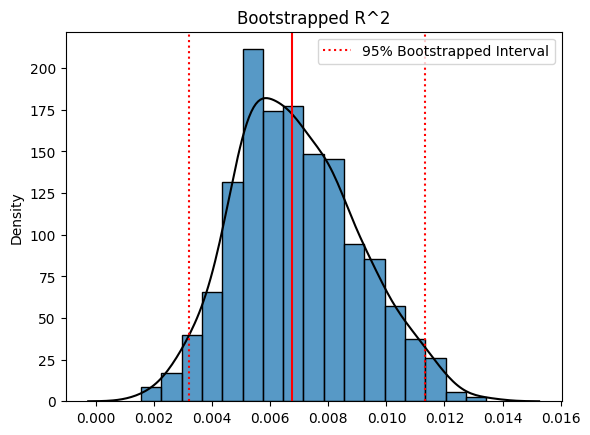

--- sigma hat ---
estimate:		0.86717
std error:		0.0074967
median:			0.86715
2.5 percentile:		0.85216
97.5 percentile:	0.88195


In [145]:
# Next the distributions of the estimates

# For plotting normal PDFs
b1_range = np.arange(np.min(boot_b1), np.max(boot_b1), 0.1)
b2_range = np.arange(np.min(boot_b2), np.max(boot_b2), 0.1)

# Plotting beta estimates
fig6, ax6 = plt.subplots(1, 2)
sns.histplot(boot_b1, stat='density', kde=False, ax=ax6[0])
sns.kdeplot(boot_b1, color='fuchsia', ax=ax6[0], label='Kernel Density')
sns.lineplot(x=b1_range, y=norm.pdf(b1_range, np.mean(boot_b1), np.std(boot_b1)), color='lime',ax=ax6[0], label='Normal Density')
ax6[0].set_title('Intercept Dist')
sns.histplot(boot_b2, stat='density', kde=False, ax=ax6[1])
sns.kdeplot(boot_b2, color='fuchsia', ax=ax6[1], label='Kernel Density')
sns.lineplot(x=b2_range, y=norm.pdf(b2_range, np.mean(boot_b2), np.std(boot_b2)), color='lime',ax=ax6[1], label='Normal Density')
ax6[1].set_title('Slope Dist')
plt.tight_layout()
plt.show()

# Bootstrap for distribution of R^2 (coefficient of determination)
sns.histplot(boot_r2, stat='density', kde=False)
sns.kdeplot(boot_r2, color='black')
plt.axvline(x=np.quantile(boot_r2, q=0.025), color='red', linestyle=':', label='95% Bootstrapped Interval')
plt.axvline(x=np.quantile(boot_r2, q=0.5), color='red')
plt.axvline(x=np.quantile(boot_r2, q=0.975), color='red', linestyle=':')#画了两边的数据
plt.title('Bootstrapped R^2')
plt.legend()
plt.show()

# Bootstrap for estimated residual standard deviation
boot_stdhat = np.sqrt(boot_sig2hat)
print('--- sigma hat ---\n' +
      f'estimate:\t\t{boot_stdhat.mean():.5}\n' +
      f'std error:\t\t{boot_stdhat.std():.5}\n' +
      f'median:\t\t\t{np.quantile(boot_stdhat, q=0.5):.5}\n' +
      f'2.5 percentile:\t\t{np.quantile(boot_stdhat, q=0.025):.5}\n' +
      f'97.5 percentile:\t{np.quantile(boot_stdhat, q=0.975):.5}'
      )

In [146]:
# run OLS regression  quality~fixed_acidity
model_density = smf.ols('quality ~ fixed_acidity',data=df_wine_quality_cleaned).fit()
model_density.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     41.82
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           1.08e-10
Time:                        00:51:45   Log-Likelihood:                -8066.5
No. Observations:                6316   AIC:                         1.614e+04
Df Residuals:                    6314   BIC:                         1.615e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         6.2329      0.063     98.821      0.000       6.109       6.357
fixed_acidity    -0.0557      0.009     -6.467      0.000      -0.073      -0.039
==============================================================================
Omnibus:                       52.660   Durbin-Watson:                   1.646
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               54.614
Skew:                           0.209   Prob(JB):                     1.38e-12
Kurtosis:                       3.182   Cond. No.                         43.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Comment: (Compared to OLS estimates)

Although our predict value is strictly as integer, and it is distributed very werid in scatter plot. We can see that, the bootstrap plot for quality-density is fairly stable, which means our data and model is robusted.

Besides, we can see that the bootstrapped intercept and R^2 is fairly normal distributed  around the their value in OLS which is a good attribute.However,the bootstrapped alcohol coefficient is distributed around is OLS estimated value, but it is not normally distributed. 

### *3*.(C).citric_acid

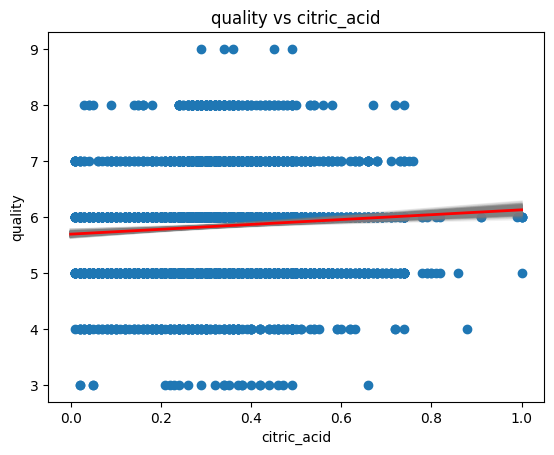

In [147]:
# initializations
boot_rmse = []
boot_b1 = []
boot_b2 = []
boot_sig2hat = [] # sigma^2 hat estimates (or std error ^2)
boot_r2 = [] # R^2 (no need to adjust)

df_wine_quality_cleaned_span_x = pd.DataFrame({'citric_acid':np.linspace(0, 1, 200)}) # x spanning 3.5 through 34 for graphing

for iter in range(n_boot):
   # Sampling with replacement
   df_wine_quality_cleaned_sample = df_wine_quality_cleaned.sample(n=df_wine_quality_cleaned.shape[0], replace=True) # `sample` method for pandas DataFrame
   df_wine_quality_cleaned_sample_ols = smf.ols('quality ~ citric_acid', data=df_wine_quality_cleaned_sample).fit() # fit model

   # Append coefficients
   boot_b1.append(df_wine_quality_cleaned_sample_ols.params[0])          # intercept
   boot_b2.append(df_wine_quality_cleaned_sample_ols.params[1])          # slope
   # Performance measures
   boot_sig2hat.append(df_wine_quality_cleaned_sample_ols.scale)         # scale = estimated sigma^2
   boot_rmse.append(np.sqrt(np.mean(df_wine_quality_cleaned_sample_ols.resid ** 2))) # RMSE
   boot_r2.append(df_wine_quality_cleaned_sample_ols.rsquared)           # R^2

   # Plot a greyed out line for this iteration
   df_wine_quality_cleaned_sample_yhat = df_wine_quality_cleaned_sample_ols.predict(df_wine_quality_cleaned_span_x)
   plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_sample_yhat, color='grey', alpha=0.1)

# Fit averaged model
df_wine_quality_cleaned_ols_span_y = np.mean(boot_b1) + df_wine_quality_cleaned_span_x * np.mean(boot_b2)

# Plotting the fitted lines
plt.scatter(df_wine_quality_cleaned['citric_acid'], df_wine_quality_cleaned['quality'])
plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_ols_span_y, color='r', linewidth=2)
plt.xlabel('citric_acid')
plt.ylabel('quality')
plt.title('quality vs citric_acid')
plt.show()


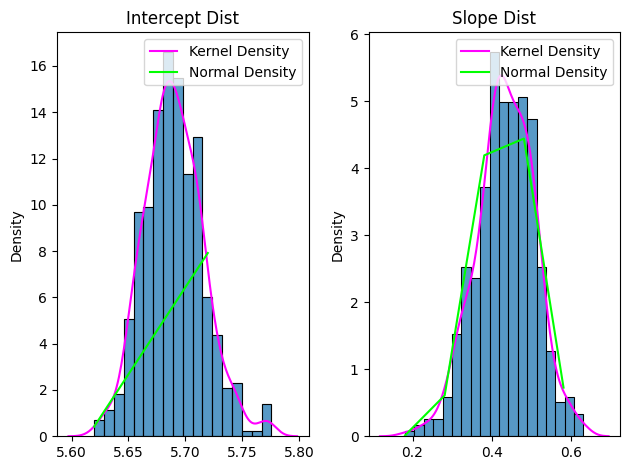

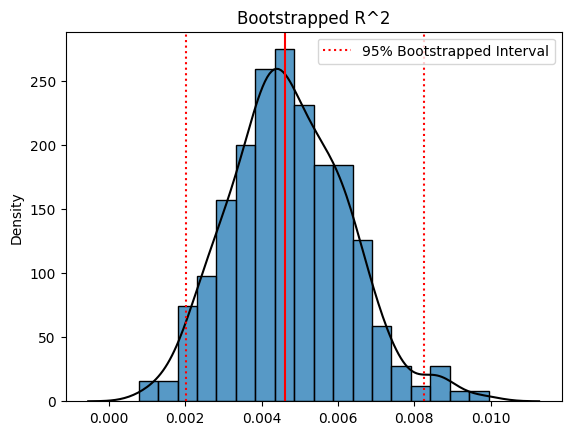

--- sigma hat ---
estimate:		0.86877
std error:		0.0081202
median:			0.86854
2.5 percentile:		0.85309
97.5 percentile:	0.88521


In [148]:
# Next the distributions of the estimates

# For plotting normal PDFs
b1_range = np.arange(np.min(boot_b1), np.max(boot_b1), 0.1)
b2_range = np.arange(np.min(boot_b2), np.max(boot_b2), 0.1)

# Plotting beta estimates
fig6, ax6 = plt.subplots(1, 2)
sns.histplot(boot_b1, stat='density', kde=False, ax=ax6[0])
sns.kdeplot(boot_b1, color='fuchsia', ax=ax6[0], label='Kernel Density')
sns.lineplot(x=b1_range, y=norm.pdf(b1_range, np.mean(boot_b1), np.std(boot_b1)), color='lime',ax=ax6[0], label='Normal Density')
ax6[0].set_title('Intercept Dist')
sns.histplot(boot_b2, stat='density', kde=False, ax=ax6[1])
sns.kdeplot(boot_b2, color='fuchsia', ax=ax6[1], label='Kernel Density')
sns.lineplot(x=b2_range, y=norm.pdf(b2_range, np.mean(boot_b2), np.std(boot_b2)), color='lime',ax=ax6[1], label='Normal Density')
ax6[1].set_title('Slope Dist')
plt.tight_layout()
plt.show()

# Bootstrap for distribution of R^2 (coefficient of determination)
sns.histplot(boot_r2, stat='density', kde=False)
sns.kdeplot(boot_r2, color='black')
plt.axvline(x=np.quantile(boot_r2, q=0.025), color='red', linestyle=':', label='95% Bootstrapped Interval')
plt.axvline(x=np.quantile(boot_r2, q=0.5), color='red')
plt.axvline(x=np.quantile(boot_r2, q=0.975), color='red', linestyle=':')#画了两边的数据
plt.title('Bootstrapped R^2')
plt.legend()
plt.show()

# Bootstrap for estimated residual standard deviation
boot_stdhat = np.sqrt(boot_sig2hat)
print('--- sigma hat ---\n' +
      f'estimate:\t\t{boot_stdhat.mean():.5}\n' +
      f'std error:\t\t{boot_stdhat.std():.5}\n' +
      f'median:\t\t\t{np.quantile(boot_stdhat, q=0.5):.5}\n' +
      f'2.5 percentile:\t\t{np.quantile(boot_stdhat, q=0.025):.5}\n' +
      f'97.5 percentile:\t{np.quantile(boot_stdhat, q=0.975):.5}'
      )

In [149]:
# run OLS regression  quality~citric_acid
model_citric_acid = smf.ols('quality ~ citric_acid',data=df_wine_quality_cleaned).fit()
model_citric_acid.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     29.12
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           7.05e-08
Time:                        00:51:51   Log-Likelihood:                -8072.9
No. Observations:                6316   AIC:                         1.615e+04
Df Residuals:                    6314   BIC:                         1.616e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       5.6902      0.028    200.879      0.000       5.635       5.746
citric_acid     0.4340      0.080      5.396      0.000       0.276       0.592
==============================================================================
Omnibus:                       54.999   Durbin-Watson:                   1.646
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.405
Skew:                           0.211   Prob(JB):                     3.43e-13
Kurtosis:                       3.201   Cond. No.                         8.15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Comment: (Compared to OLS estimates)

Although our predict value is strictly as integer, and it is distributed very werid in scatter plot. We can see that, the bootstrap plot for quality-citric_acid is fairly stable, which means our data and model is robusted.

Besides, we can see that the bootstrapped slope and R^2 is fairly normal distributed  around the their value in OLS which is a good attribute.However,the bootstrapped intercept is distributed around is OLS estimated value, but it is not normally distributed. And the intercept is not important in here.

### *3*.(C).free_sulfur_dioxide

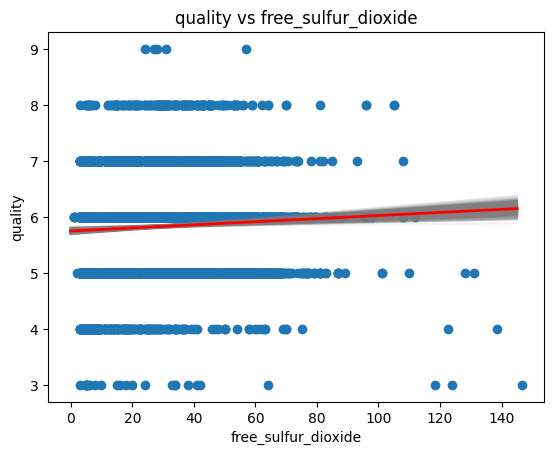

In [150]:
# initializations
boot_rmse = []
boot_b1 = []
boot_b2 = []
boot_sig2hat = [] # sigma^2 hat estimates (or std error ^2)
boot_r2 = [] # R^2 (no need to adjust)

df_wine_quality_cleaned_span_x = pd.DataFrame({'free_sulfur_dioxide':np.linspace(0, 145, 200)}) # x spanning 3.5 through 34 for graphing

for iter in range(n_boot):
   # Sampling with replacement
   df_wine_quality_cleaned_sample = df_wine_quality_cleaned.sample(n=df_wine_quality_cleaned.shape[0], replace=True) # `sample` method for pandas DataFrame
   df_wine_quality_cleaned_sample_ols = smf.ols('quality ~ free_sulfur_dioxide', data=df_wine_quality_cleaned_sample).fit() # fit model

   # Append coefficients
   boot_b1.append(df_wine_quality_cleaned_sample_ols.params[0])          # intercept
   boot_b2.append(df_wine_quality_cleaned_sample_ols.params[1])          # slope
   # Performance measures
   boot_sig2hat.append(df_wine_quality_cleaned_sample_ols.scale)         # scale = estimated sigma^2
   boot_rmse.append(np.sqrt(np.mean(df_wine_quality_cleaned_sample_ols.resid ** 2))) # RMSE
   boot_r2.append(df_wine_quality_cleaned_sample_ols.rsquared)           # R^2

   # Plot a greyed out line for this iteration
   df_wine_quality_cleaned_sample_yhat = df_wine_quality_cleaned_sample_ols.predict(df_wine_quality_cleaned_span_x)
   plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_sample_yhat, color='grey', alpha=0.1)

# Fit averaged model
df_wine_quality_cleaned_ols_span_y = np.mean(boot_b1) + df_wine_quality_cleaned_span_x * np.mean(boot_b2)

# Plotting the fitted lines
plt.scatter(df_wine_quality_cleaned['free_sulfur_dioxide'], df_wine_quality_cleaned['quality'])
plt.plot(df_wine_quality_cleaned_span_x, df_wine_quality_cleaned_ols_span_y, color='r', linewidth=2)
plt.xlabel('free_sulfur_dioxide')
plt.ylabel('quality')
plt.title('quality vs free_sulfur_dioxide')
plt.show()


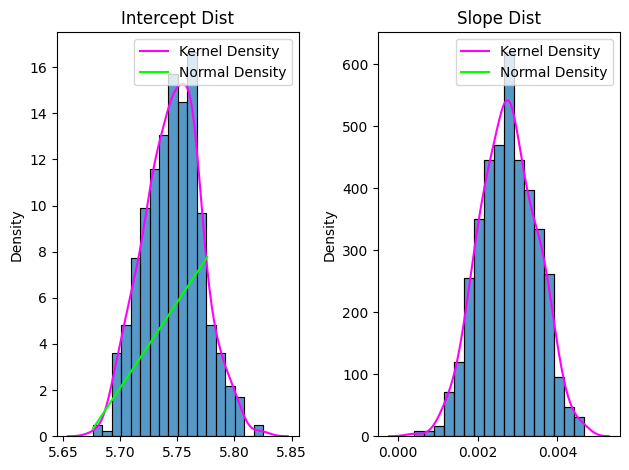

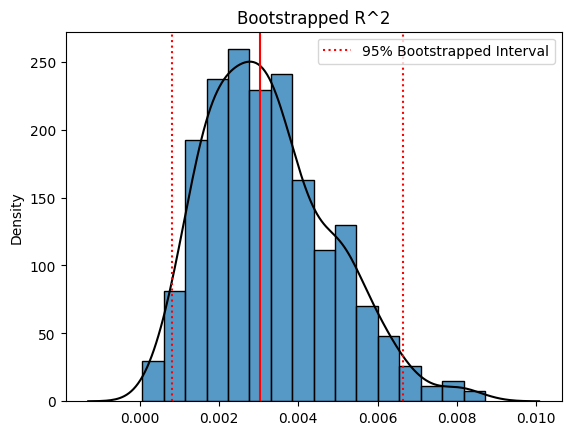

--- sigma hat ---
estimate:		0.86928
std error:		0.0077837
median:			0.86884
2.5 percentile:		0.85538
97.5 percentile:	0.88563


In [151]:
# Next the distributions of the estimates

# For plotting normal PDFs
b1_range = np.arange(np.min(boot_b1), np.max(boot_b1), 0.1)
b2_range = np.arange(np.min(boot_b2), np.max(boot_b2), 0.1)

# Plotting beta estimates
fig6, ax6 = plt.subplots(1, 2)
sns.histplot(boot_b1, stat='density', kde=False, ax=ax6[0])
sns.kdeplot(boot_b1, color='fuchsia', ax=ax6[0], label='Kernel Density')
sns.lineplot(x=b1_range, y=norm.pdf(b1_range, np.mean(boot_b1), np.std(boot_b1)), color='lime',ax=ax6[0], label='Normal Density')
ax6[0].set_title('Intercept Dist')
sns.histplot(boot_b2, stat='density', kde=False, ax=ax6[1])
sns.kdeplot(boot_b2, color='fuchsia', ax=ax6[1], label='Kernel Density')
sns.lineplot(x=b2_range, y=norm.pdf(b2_range, np.mean(boot_b2), np.std(boot_b2)), color='lime',ax=ax6[1], label='Normal Density')
ax6[1].set_title('Slope Dist')
plt.tight_layout()
plt.show()

# Bootstrap for distribution of R^2 (coefficient of determination)
sns.histplot(boot_r2, stat='density', kde=False)
sns.kdeplot(boot_r2, color='black')
plt.axvline(x=np.quantile(boot_r2, q=0.025), color='red', linestyle=':', label='95% Bootstrapped Interval')
plt.axvline(x=np.quantile(boot_r2, q=0.5), color='red')
plt.axvline(x=np.quantile(boot_r2, q=0.975), color='red', linestyle=':')#画了两边的数据
plt.title('Bootstrapped R^2')
plt.legend()
plt.show()

# Bootstrap for estimated residual standard deviation
boot_stdhat = np.sqrt(boot_sig2hat)
print('--- sigma hat ---\n' +
      f'estimate:\t\t{boot_stdhat.mean():.5}\n' +
      f'std error:\t\t{boot_stdhat.std():.5}\n' +
      f'median:\t\t\t{np.quantile(boot_stdhat, q=0.5):.5}\n' +
      f'2.5 percentile:\t\t{np.quantile(boot_stdhat, q=0.025):.5}\n' +
      f'97.5 percentile:\t{np.quantile(boot_stdhat, q=0.975):.5}'
      )

In [152]:
# run OLS regression  quality~free_sulfur_dioxide
model_citric_acid = smf.ols('quality ~ free_sulfur_dioxide',data=df_wine_quality_cleaned).fit()
model_citric_acid.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     18.39
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           1.82e-05
Time:                        00:52:03   Log-Likelihood:                -8078.2
No. Observations:                6316   AIC:                         1.616e+04
Df Residuals:                    6314   BIC:                         1.617e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               5.7482      0.022    258.405      0.000       5.705       5.792
free_sulfur_dioxide     0.0027      0.001      4.289      0.000       0.001       0.004
==============================================================================
Omnibus:                       54.991   Durbin-Watson:                   1.650
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               57.025
Skew:                           0.214   Prob(JB):                     4.14e-13
Kurtosis:                       3.181   Cond. No.                         72.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Comment: (Compared to OLS estimates)

Although our predict value is strictly as integer, and it is distributed very werid in scatter plot. We can see that, the bootstrap plot for quality-citric_acid is fairly stable, which means our data and model is robusted.

Besides, we can see that R^2 is fairly normal distributed  around the their value in OLS which is a good attribute.However,the bootstrapped intercept and the slopr is distributed around is OLS estimated value, but it is not normally distributed which means it is a not good result here.

### *3*. (D) Use cross-validation to evaluate your model’s performance

In [153]:
df_encoded = pd.get_dummies(df_wine_quality_cleaned, columns=['color'], drop_first=True)
#turn color into dummies

In [154]:
# 5-fold CV w/ RMSE
#alcohol
X = df_encoded[['alcohol', 'color_white']]
Y = df_encoded['quality']
model = LinearRegression()
scores = cross_val_score(model, X = X, y = Y,
                        scoring = 'neg_root_mean_squared_error', # Preferred metric
                         cv = 5) # Number of folds
np.abs(scores).mean()

0.7774877904341503

In [155]:
#volatile_acidity
X = df_encoded[['volatile_acidity', 'color_white']]
Y = df_encoded['quality']
model = LinearRegression()
scores = cross_val_score(model, X = X, y = Y,
                        scoring = 'neg_root_mean_squared_error', # Preferred metric
                         cv = 5) # Number of folds
np.abs(scores).mean()

0.8399597122703986

In [156]:
#chlorides
X = df_encoded[['chlorides', 'color_white']]
Y = df_encoded['quality']
model = LinearRegression()
scores = cross_val_score(model, X = X, y = Y,
                        scoring = 'neg_root_mean_squared_error', # Preferred metric
                         cv = 5) # Number of folds
np.abs(scores).mean()

0.8574960082097745

In [157]:
#density
X = df_encoded[['density', 'color_white']]
Y = df_encoded['quality']
model = LinearRegression()
scores = cross_val_score(model, X = X, y = Y,
                        scoring = 'neg_root_mean_squared_error', # Preferred metric
                         cv = 5) # Number of folds
np.abs(scores).mean()

0.8317962591391017

In [158]:
#citric_acid
X = df_encoded[['citric_acid', 'color_white']]
Y = df_encoded['quality']
model = LinearRegression()
scores = cross_val_score(model, X = X, y = Y,
                        scoring = 'neg_root_mean_squared_error', # Preferred metric
                         cv = 5) # Number of folds
np.abs(scores).mean()

0.8690767694709628

#### Performance

By using 5-fold cross validation on models with 1 quantitative predictor and 1 categorical predictor (color), we compute the negative MSE and turn it into a postive value for comparison. Higher score indicates higher MSE in the final result, so we would like to pick the model with lowest cross-validated MSE score. That is, the model (quality~alcohol+color) is the best performing model.

### *3*. (E) Provide an interpretation of your model parameters and discuss their economic vs. statistical significance.

In [159]:
# OLS regression of quality on alcohol
model_alcohol = smf.ols('quality ~ alcohol',data=df_wine_quality_cleaned).fit()
model_alcohol.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.203
Model:                            OLS   Adj. R-squared:                  0.203
Method:                 Least Squares   F-statistic:                     1607.
Date:                Fri, 25 Oct 2024   Prob (F-statistic):          3.47e-313
Time:                        00:52:10   Log-Likelihood:                -7371.5
No. Observations:                6316   AIC:                         1.475e+04
Df Residuals:                    6314   BIC:                         1.476e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.3773      0.087     27.412      0.000       2.207       2.547
alcohol        0.3292      0.008     40.082      0.000       0.313       0.345
==============================================================================
Omnibus:                      117.087   Durbin-Watson:                   1.632
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              235.168
Skew:                           0.064   Prob(JB):                     8.59e-52
Kurtosis:                       3.937   Cond. No.                         94.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Summary
The basic linear model of quality on alcohol gives the effect of rising in ABV on quality score. The slope of 0.3275 is to say that a 1% increase in alcohol concentration can lead to by average a 0.3275 increase in wine quality. The intercept here is the expected quality score with a wine of 0% alcohol, which is irrelevant. 
<br>The coefficient of alcohol, with a p-value of 0.000, is statistically significant. Economically speaking, I think the result of 0.3275 is also economically significant, given that middle 50% of quality scores distribute between 5 and 6. A 1% increase in ABV would lead to an increase in quality with the amount of over 30% IQR, which is to me economically significant.

In [160]:
# ANOVA
model_alcohol_f = smf.ols('quality ~ type',data = df_wine_quality_cleaned).fit()
model_alcohol_f.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     73.37
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           1.33e-17
Time:                        00:52:12   Log-Likelihood:                -8050.9
No. Observations:                6316   AIC:                         1.611e+04
Df Residuals:                    6314   BIC:                         1.612e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.8820      0.012    474.246      0.000       5.858       5.906
type          -0.2223      0.026     -8.566      0.000      -0.273      -0.171
==============================================================================
Omnibus:                       47.839   Durbin-Watson:                   1.659
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               50.267
Skew:                           0.191   Prob(JB):                     1.22e-11
Kurtosis:                       3.214   Cond. No.                         2.53
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Summary
The intercept parameter in ANOVA model indicates that within the reference group, that is for white wine, the mean of quality score is 5.8790. The slope of -0.2378 means the average quality score of red wine is 0.2378 less than its counterpart. By calculation we know the mean quality score of red wine is 5.6421.
<br>
<br>Both the coefficient of intercept and slope are statistically significant and we may conclude that white wine is significantly of better quality than red wine. Of course such conclusion is still doubtable without controlling other variables and unproportional distribution of red and white wine in our dataset. As for economical significance, red wine quality is estimated to be 4.21% lower than quality of white wine, so I would say the quality difference between white and red wine is not economically significant.

In [161]:
# ANCOVA
model_alcohol_c2 = smf.ols('quality ~ alcohol + type',data=df_wine_quality_cleaned).fit()
model_alcohol_c2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.211
Method:                 Least Squares   F-statistic:                     846.6
Date:                Fri, 25 Oct 2024   Prob (F-statistic):               0.00
Time:                        00:52:13   Log-Likelihood:                -7337.0
No. Observations:                6316   AIC:                         1.468e+04
Df Residuals:                    6313   BIC:                         1.470e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.4439      0.087     28.211      0.000       2.274       2.614
alcohol        0.3271      0.008     40.016      0.000       0.311       0.343
type          -0.1930      0.023     -8.324      0.000      -0.238      -0.148
==============================================================================
Omnibus:                      116.258   Durbin-Watson:                   1.650
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              238.325
Skew:                           0.036   Prob(JB):                     1.77e-52
Kurtosis:                       3.949   Cond. No.                         94.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Summary
The coefficient of alcohol shares the same meaning from the linear OLS regression, saying that for both types, a 1% increase in ABV leads to 0.3252 rise in quality score. The coefficient of type here shows that conditioning on alcohol, red wine quality score is by average 0.2112 lower than white wine quality score. That is to way, when comparing red and white wine with the same alcohol concentration, say 10%, white wine quality is 0.2112 higher than that of red wine. 
<br>Both two coefficients are statistically significant, and the interpretation of economical significance remains the same with the linear regression and ANOVA case above, that the coefficient of alcohol is economically significant while the difference between red and white wine is not.

In [162]:
# Introduing slope interaction
model_alcohol_c = smf.ols('quality ~ alcohol + alcohol:type',data=df_wine_quality_cleaned).fit()
model_alcohol_c.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                quality   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.210
Method:                 Least Squares   F-statistic:                     842.7
Date:                Fri, 25 Oct 2024   Prob (F-statistic):               0.00
Time:                        00:52:14   Log-Likelihood:                -7340.1
No. Observations:                6316   AIC:                         1.469e+04
Df Residuals:                    6313   BIC:                         1.471e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        2.4080      0.086     27.874      0.000       2.239       2.577
alcohol          0.3303      0.008     40.402      0.000       0.314       0.346
alcohol:type    -0.0175      0.002     -7.937      0.000      -0.022      -0.013
==============================================================================
Omnibus:                      116.565   Durbin-Watson:                   1.649
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              238.720
Skew:                           0.039   Prob(JB):                     1.45e-52
Kurtosis:                       3.949   Cond. No.                         97.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Summary
The coefficient of alcohol here represents of rise in ABV on quality within the reference group, that is 1% rise in ABV of white wine induces an increase of 0.3290 in the quality of white wine. As for the red wine, a 1% increase in ABV would lead to a (0.3290-0.0194)=0.3090 increase in red wine quality. The coefficient of interaction term identifies the difference in effects of alcohol concentration on quality between the groups of red wine and white wine. A 1% rise in white wine alcohol concentration can contribute more to wine quality than that of red wine by 0.0194.
<br>All coefficients are statistically significant. Same as discussed above, the coefficient of alcohol that represents effect of ABV on quality within the white wine group is still economically significant. The coefficient of interaction term is not economically significant, since 0.0194 is relatively very small compared to 0.3290 and 0.3090. The effect of ABV on quality for red wine is 0.0194/0.3290 = 5.90% lower than that of white wine, so I would say generally speaking ABV has a similar effect on wine quality, despite the type of wine to be red or white.

### Wrapping up
Here we wrapped up for our assignment, and express thanks to all the of our teammates, and Dr.Rojas for help during the assignment.